In [1]:
# individual subject timecourses

In [2]:
import sys
sys.path.append('/Users/jmiller/python/RAM_classify')

In [4]:
%matplotlib inline
from GroupLevel.Analyses import group_classifier, group_SME, group_SME_timebins
from GroupLevel.Analyses import group_classifier_using_top_features
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import ram_data_helpers
# from Projects.TH_SME_Paper import brain_plots
from SubjectLevel import subject_exclusions
import behavioral.TH_beh_summary_plots
from GroupLevel.Analyses import group_move_vs_still
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.compat import urlopen
import pandas as pd
import scipy
plt.style.use('/home1/jfm2/python/RAM_classify/myplotstyle.mplstyle')

/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [63]:

elecs = [np.sum((x.elec_locs['Hipp']) & ~(x.elec_locs['is_right'])) for x in sme_th.subject_objs]
np.sum(np.array(elecs) > 0)

25

In [ ]:
[x.elec_locs['']]

In [5]:
th_subjs = ram_data_helpers.get_subjs_and_montages('RAM_TH1')
th_subjs = th_subjs[np.array([False if s[0] == 'R1258T' else True for s in th_subjs])]
th_subjs = th_subjs[np.array([False if s[0] == 'R1132C' else True for s in th_subjs])]
# th_subjs = np.vstack([th_subjs,np.array([u'R1285C', u'0']), np.array([u'R1289C', u'0'])])
th_subjs = np.vstack([th_subjs,np.array([u'R1285C', u'0'])])

In [18]:
base_dir='/Users/jmiller/data/python'

R1124J: Input data already exists, loading.


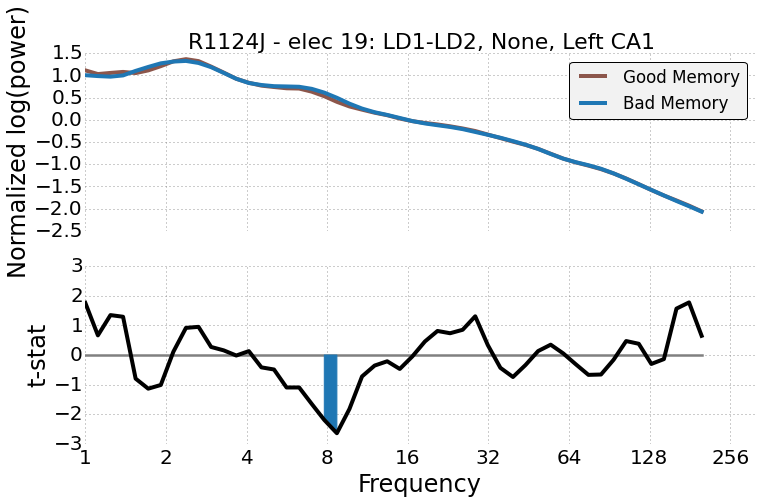

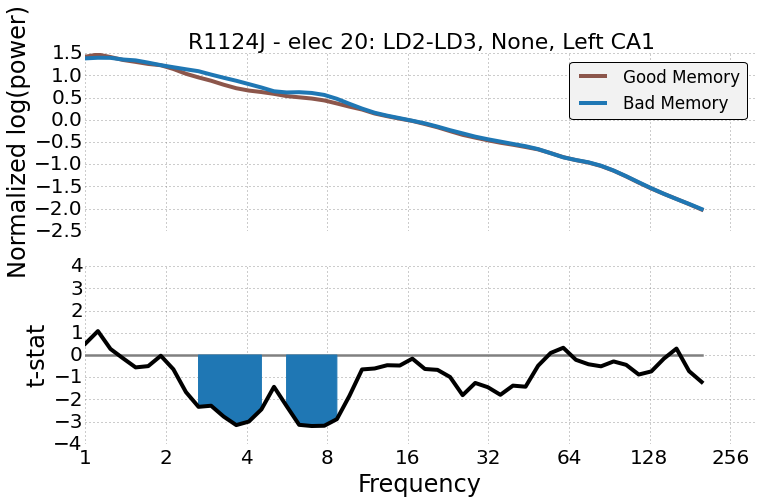

R1133C: Input data already exists, loading.


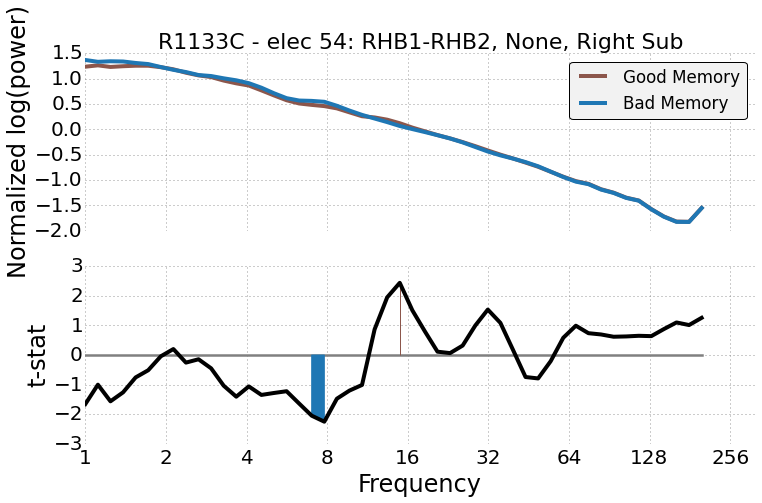

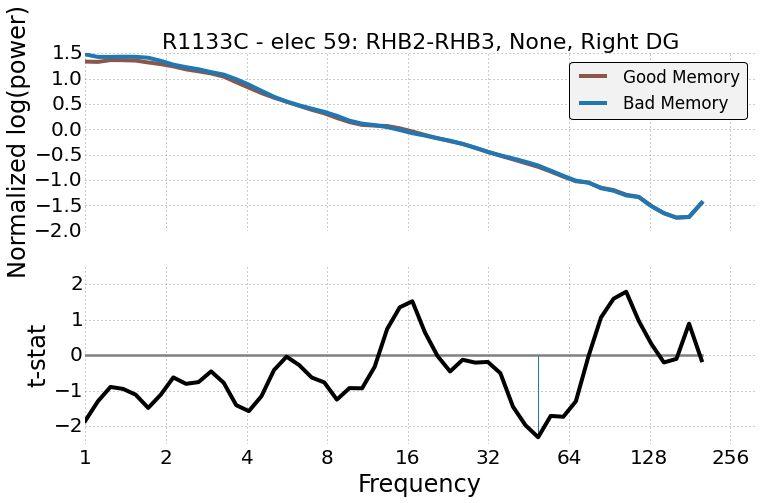

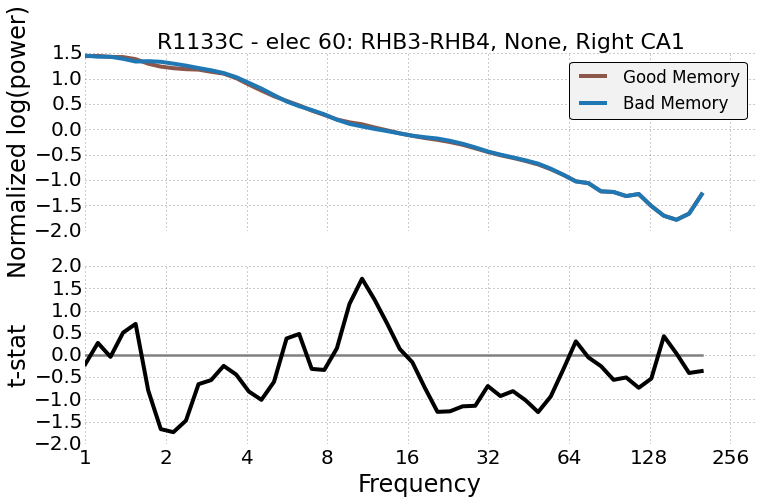

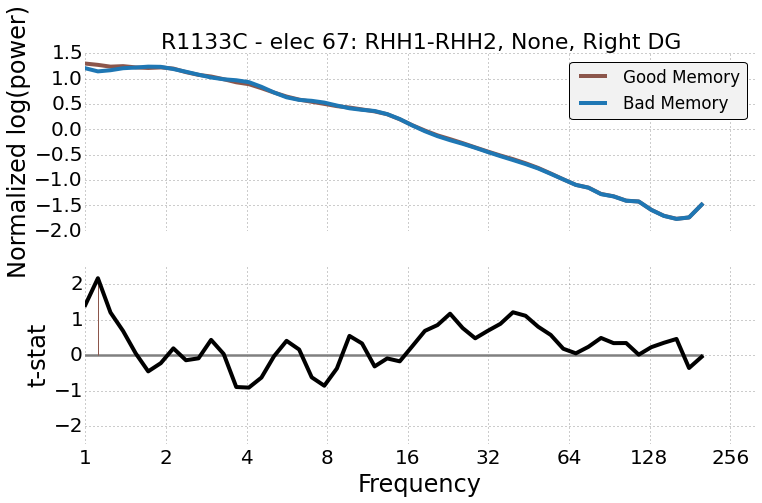

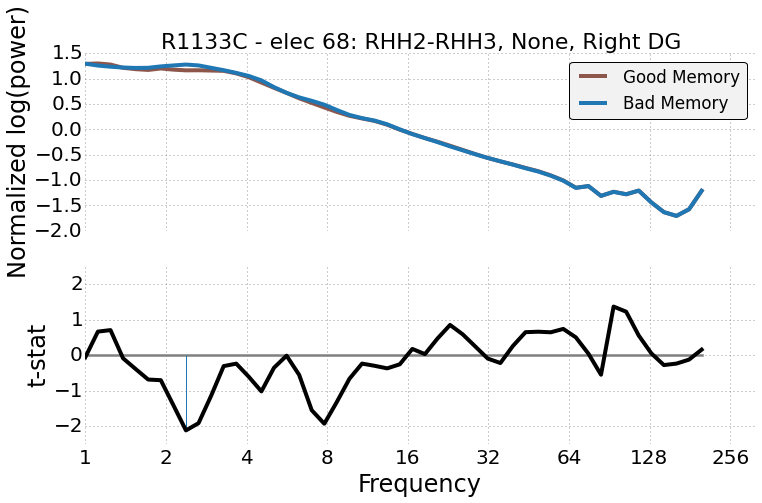

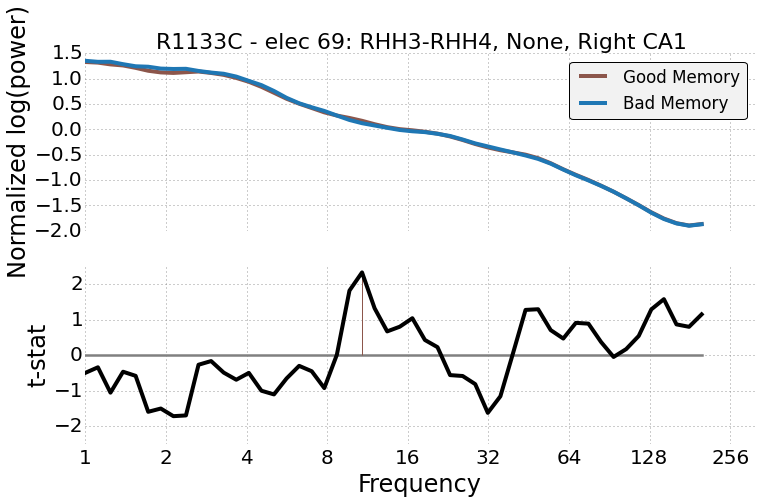

R1145J: Input data already exists, loading.


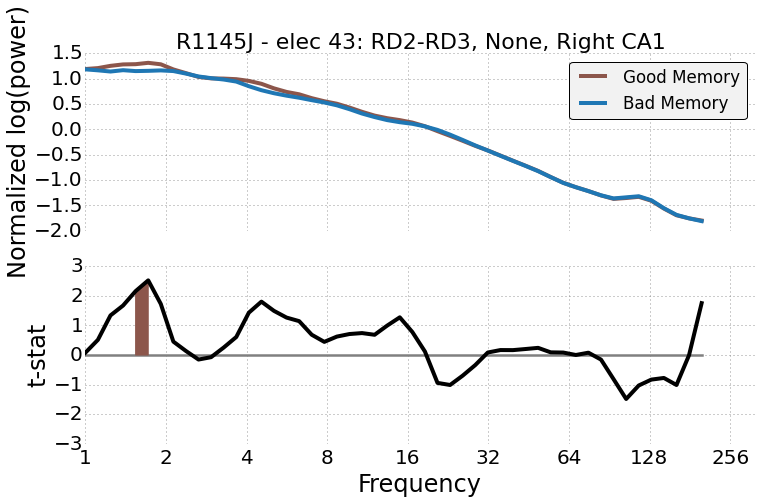

R1147P: Input data already exists, loading.


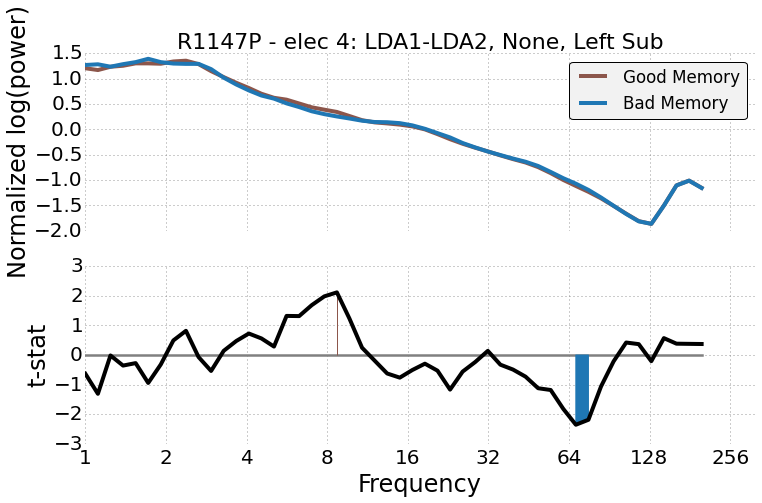

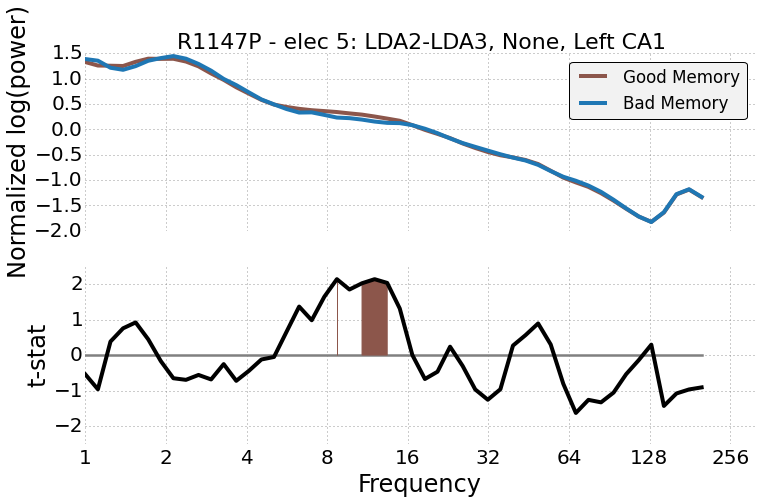

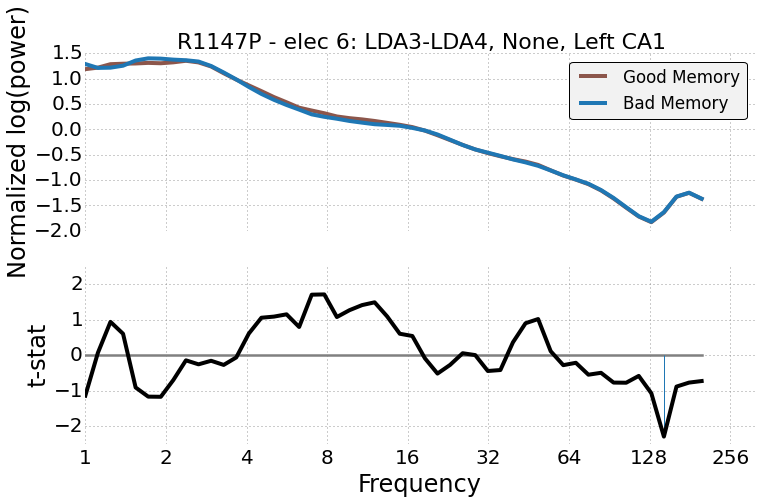

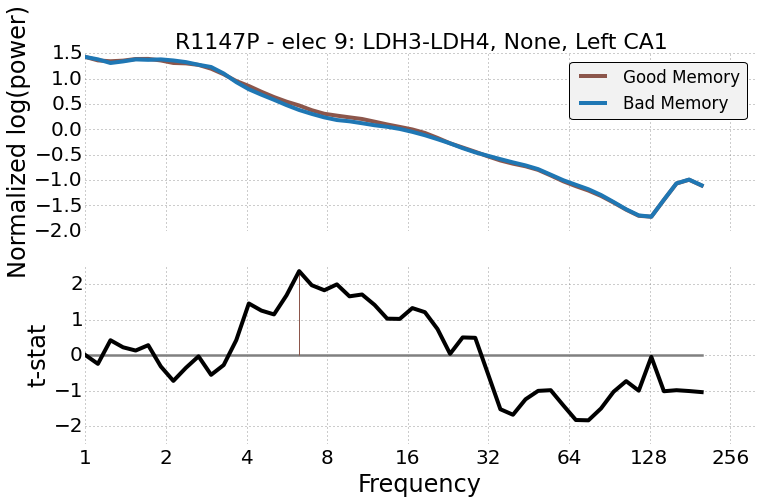

R1154D: Input data already exists, loading.


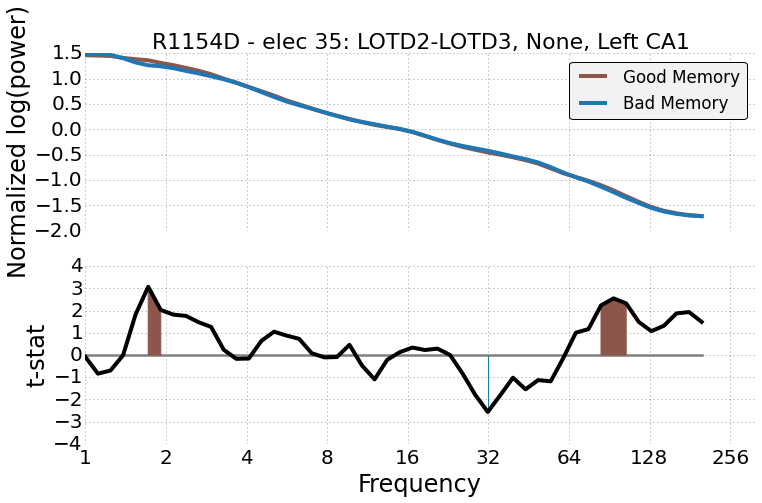

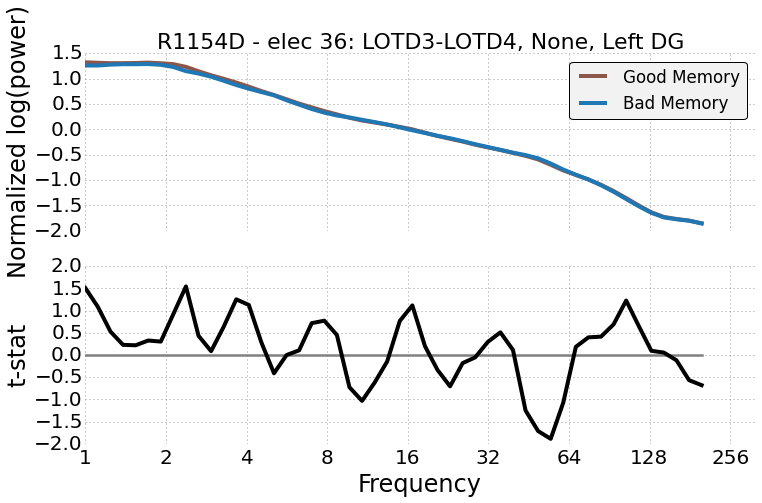

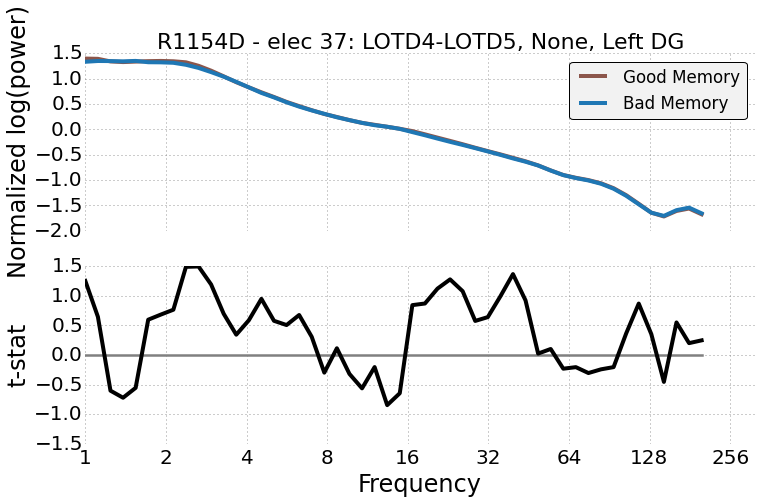

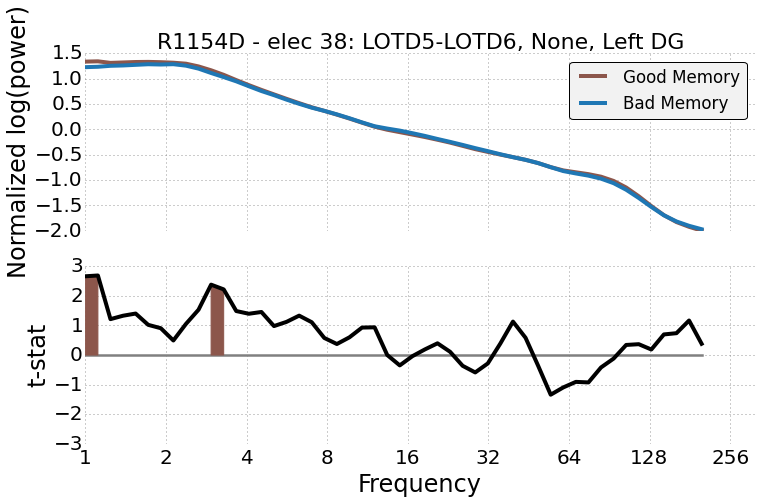

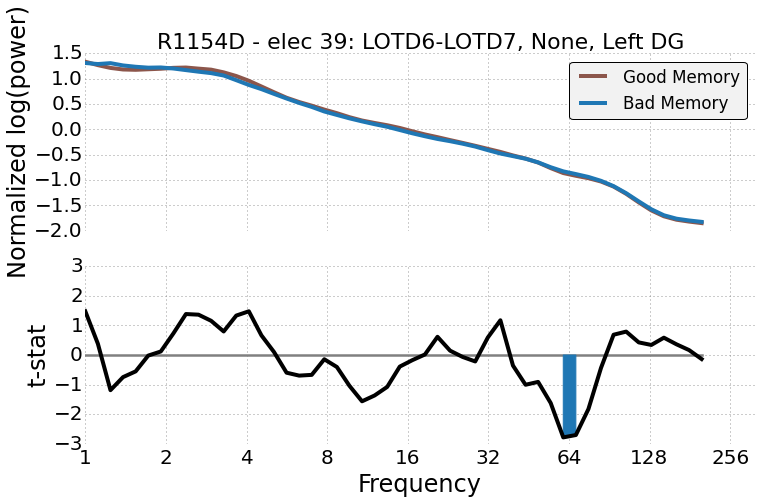

R1157C: Input data already exists, loading.


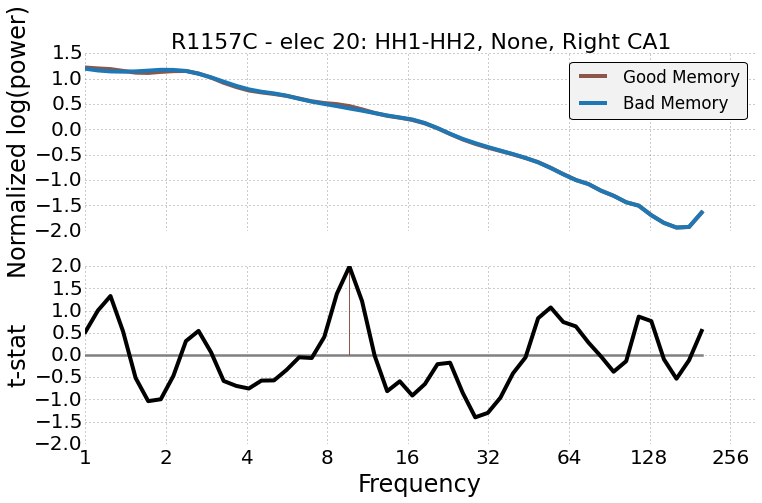

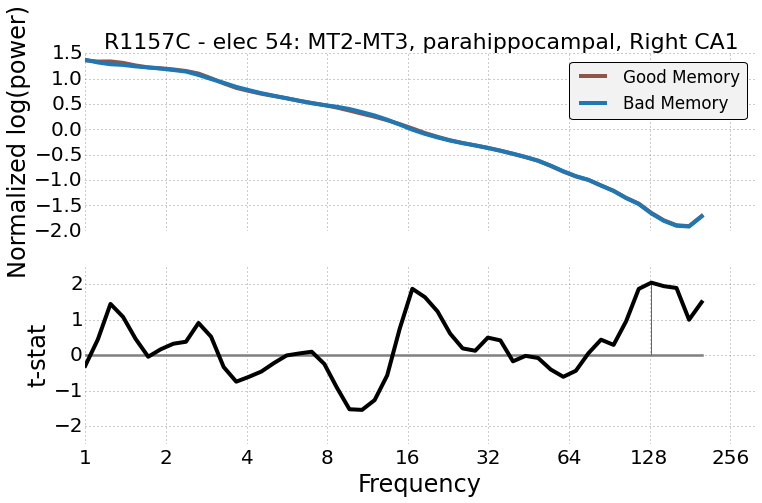

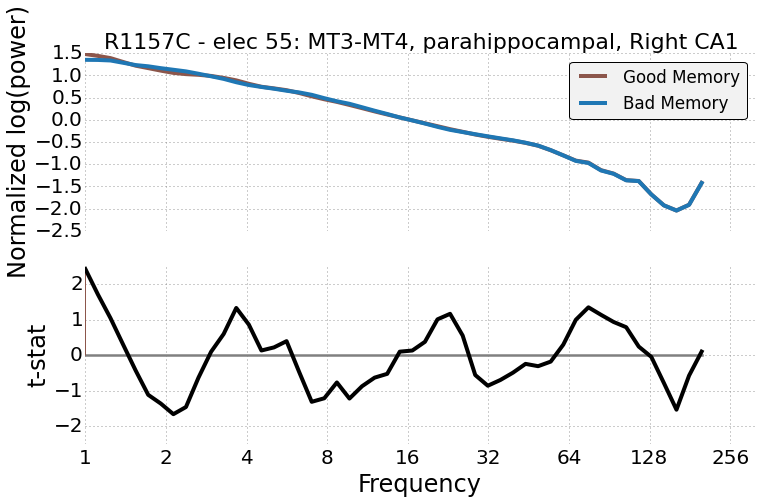

R1163T: Input data already exists, loading.


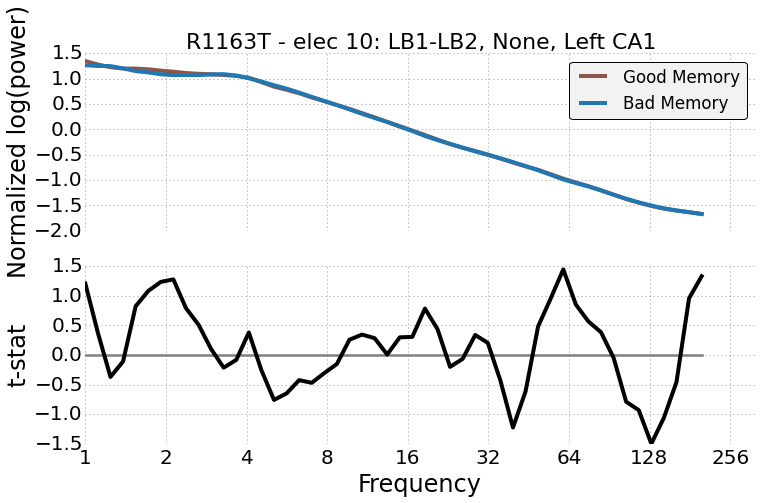

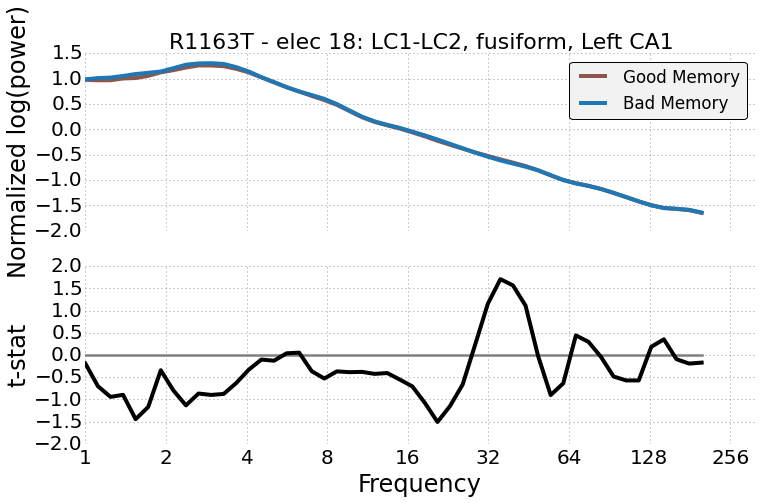

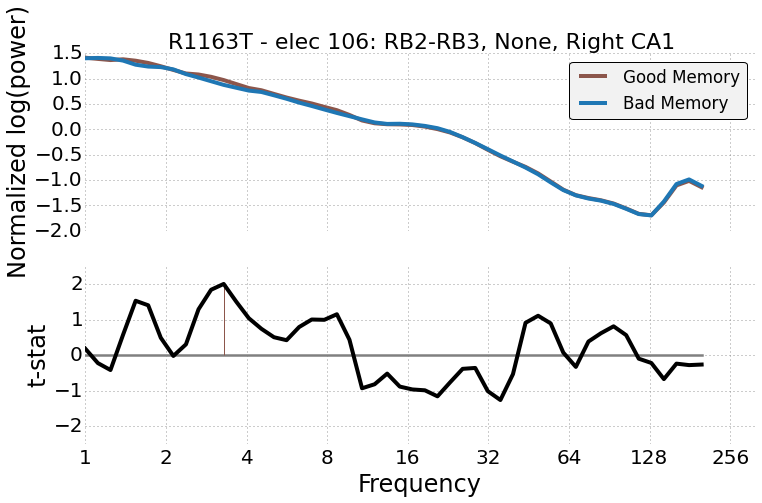

R1167M: Input data already exists, loading.


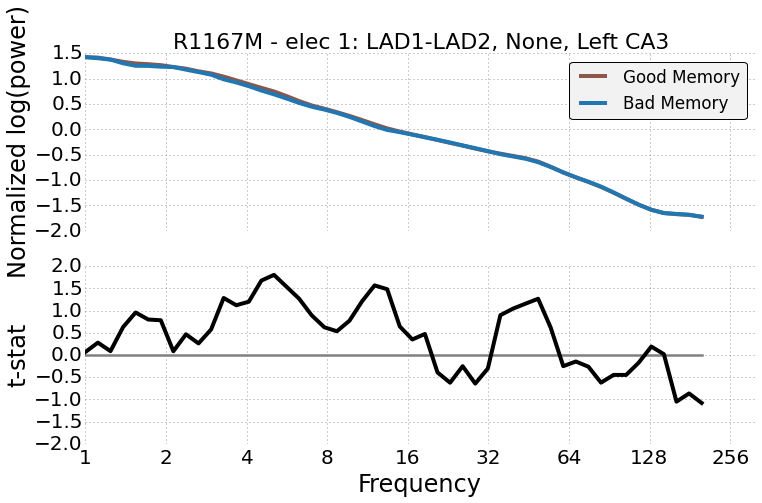

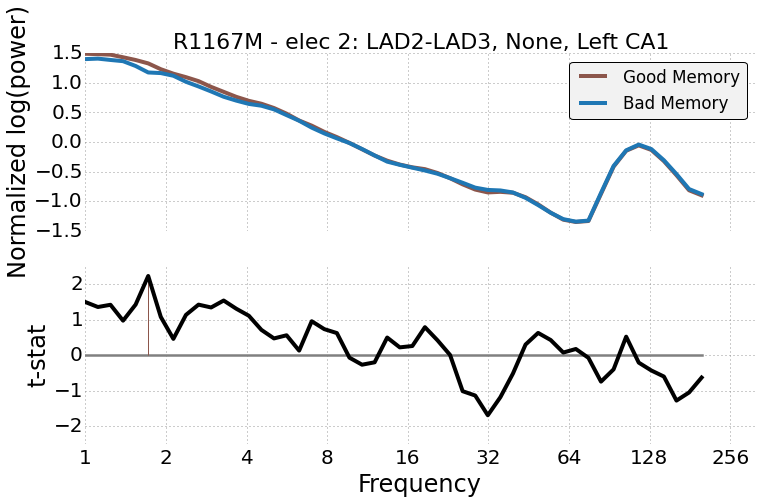

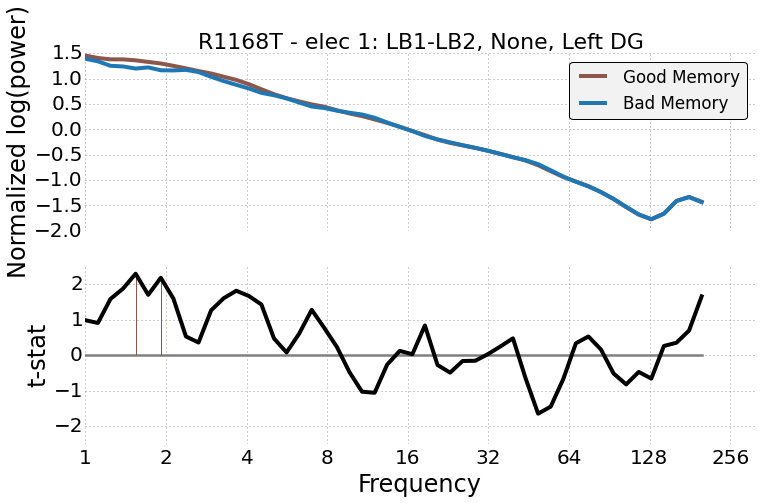

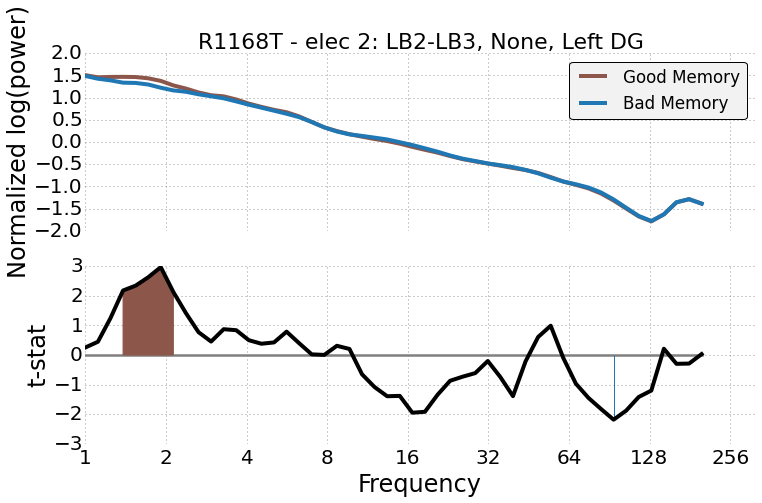

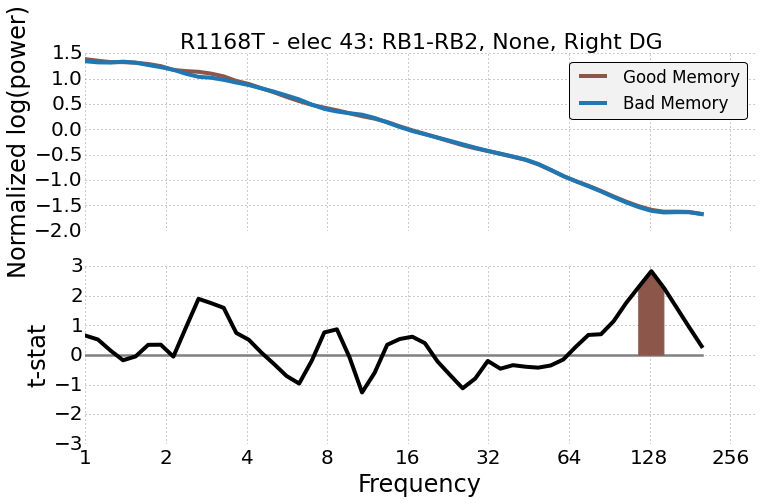

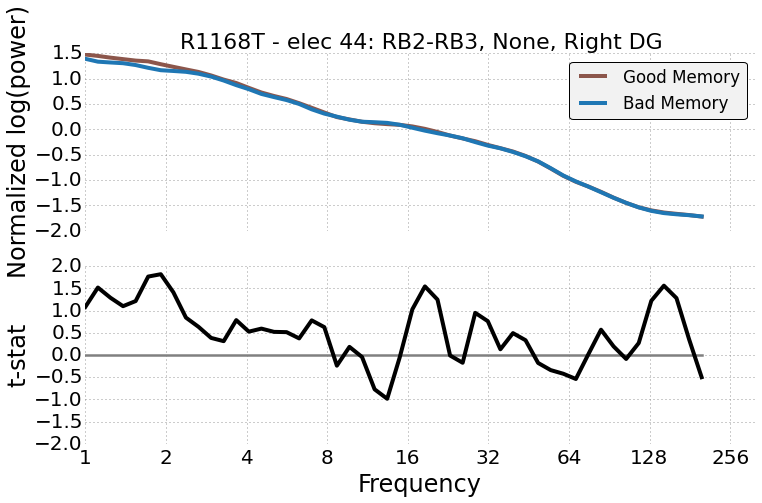

R1171M: Input data already exists, loading.


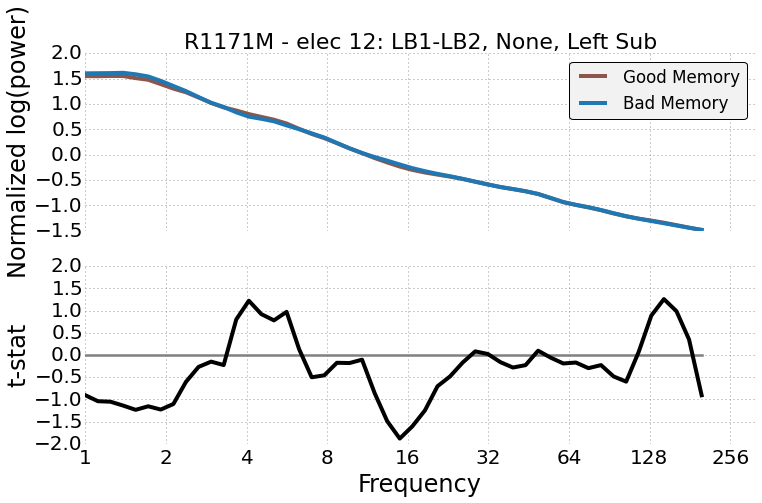

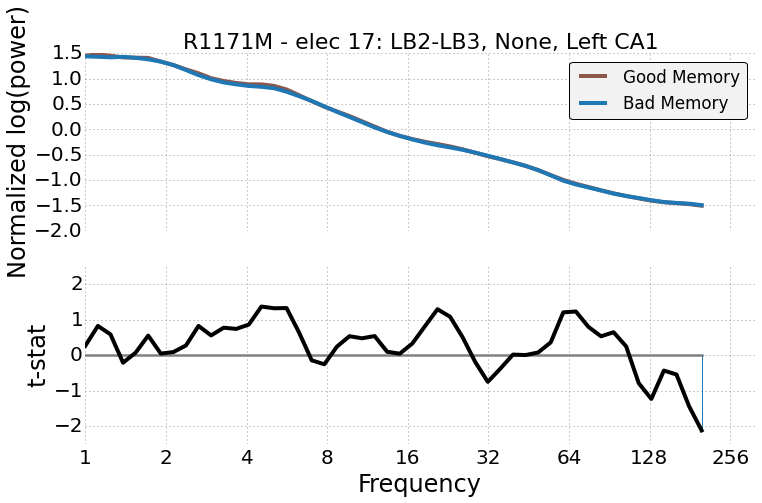

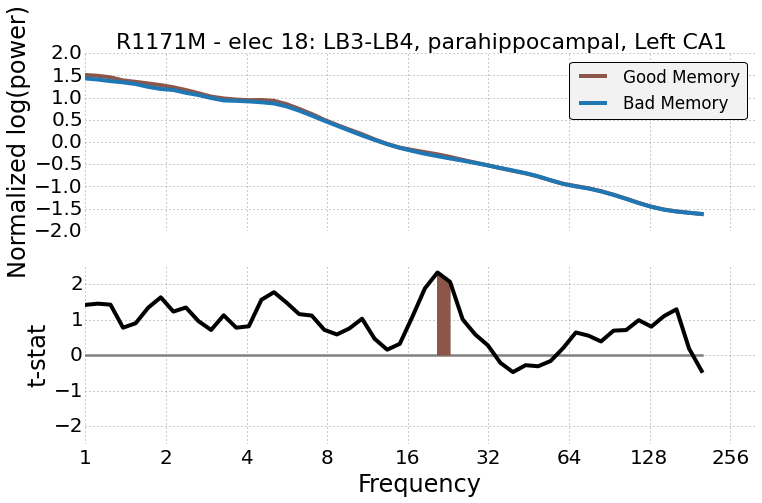

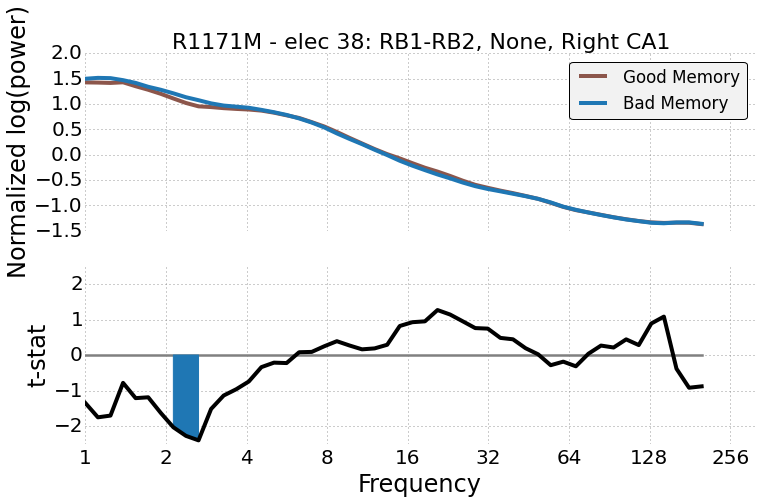

R1172E: Input data already exists, loading.


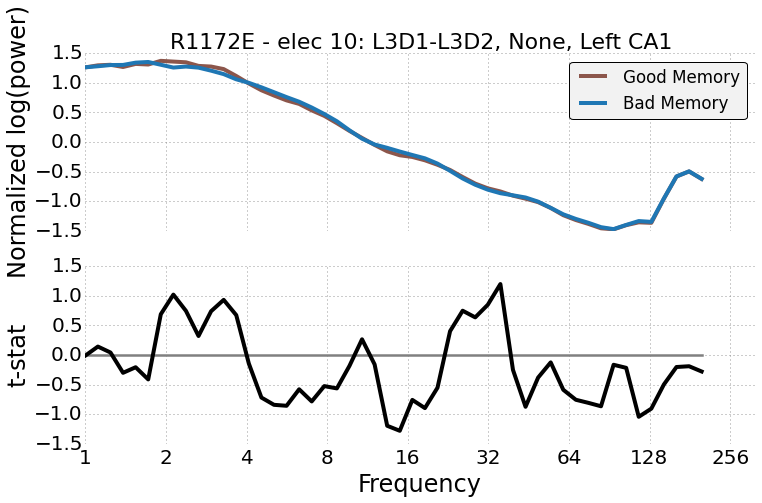

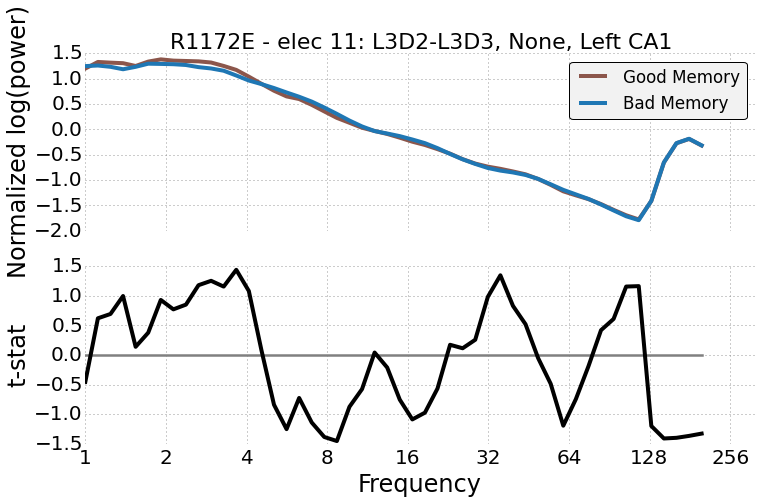

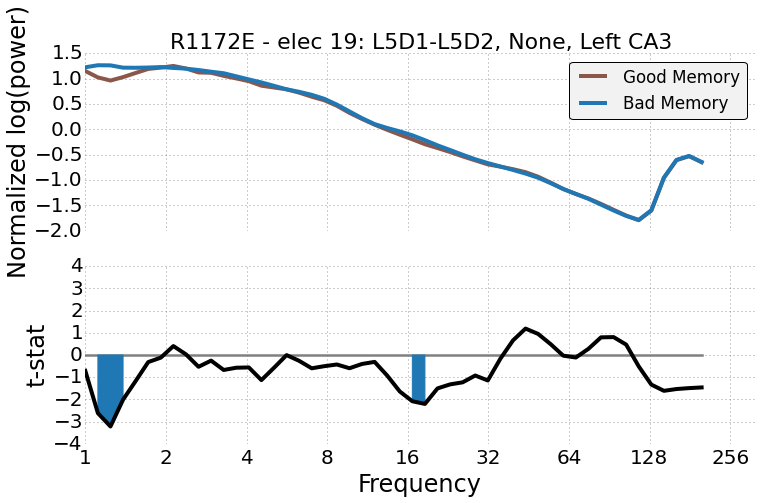

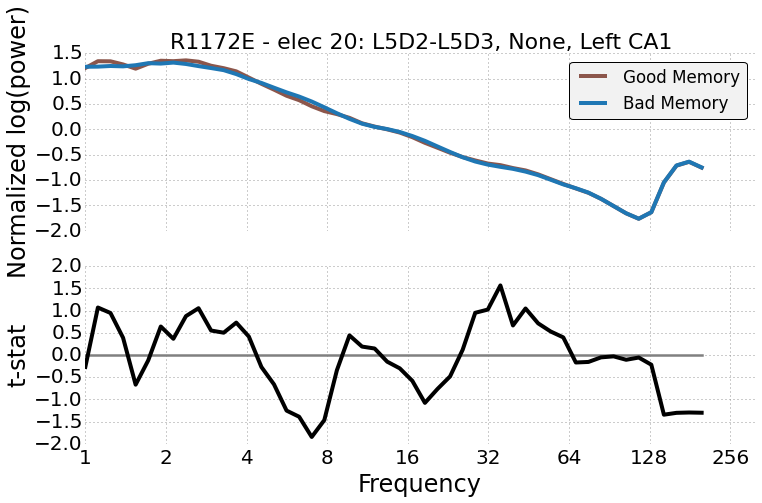

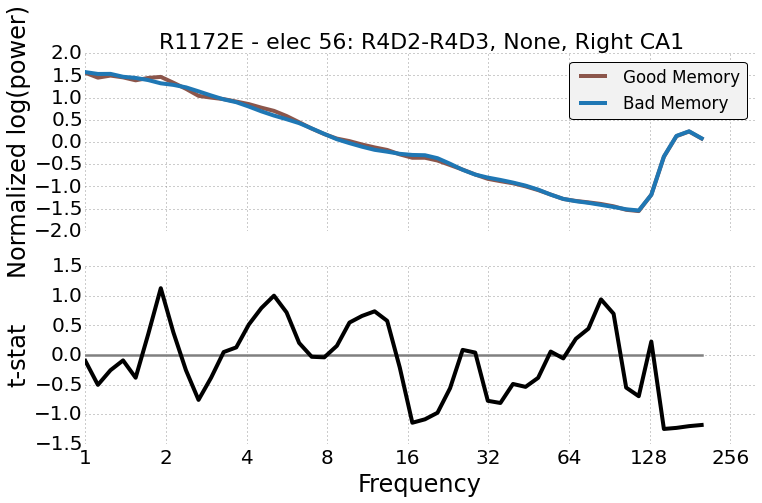

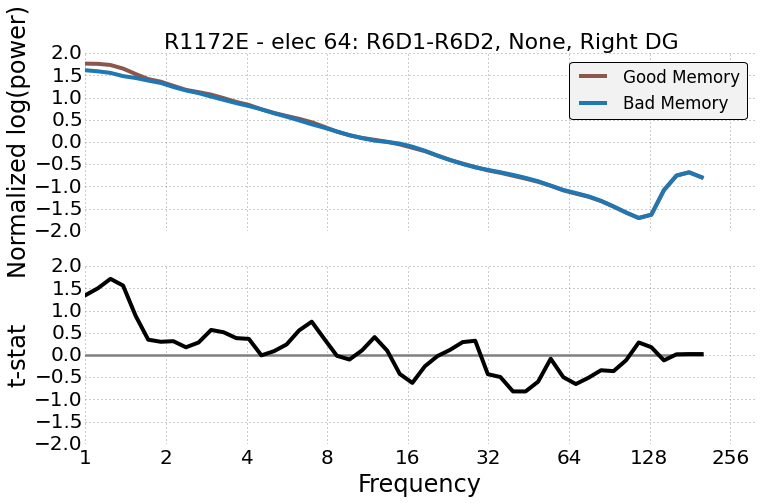

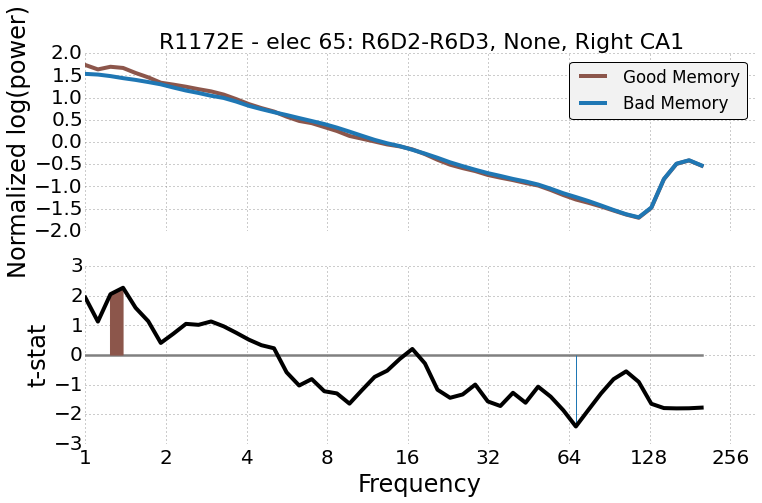

R1180C: Input data already exists, loading.


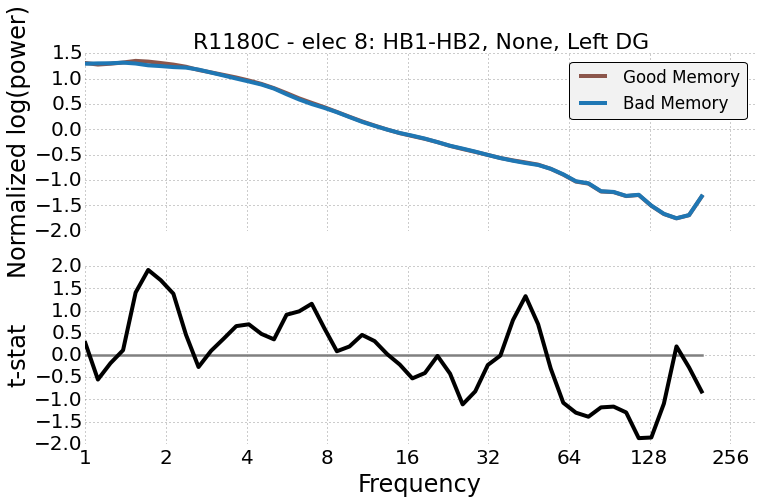

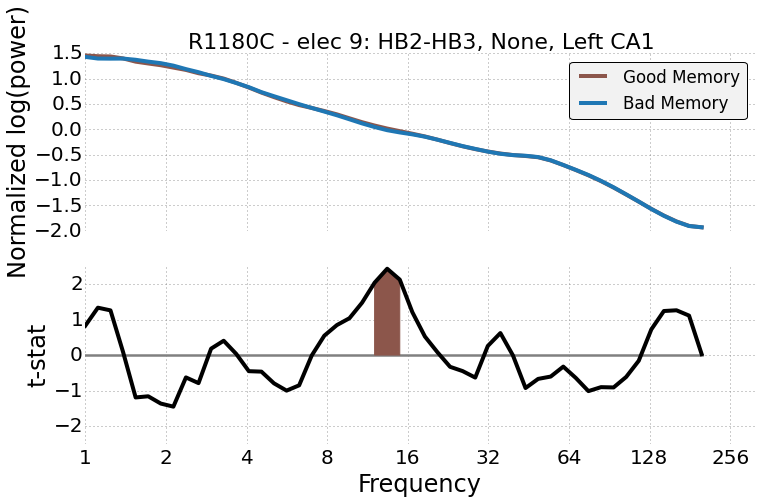

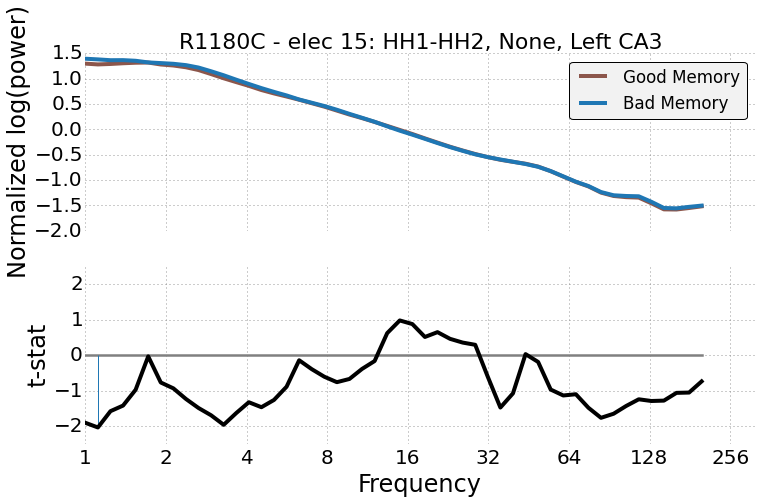

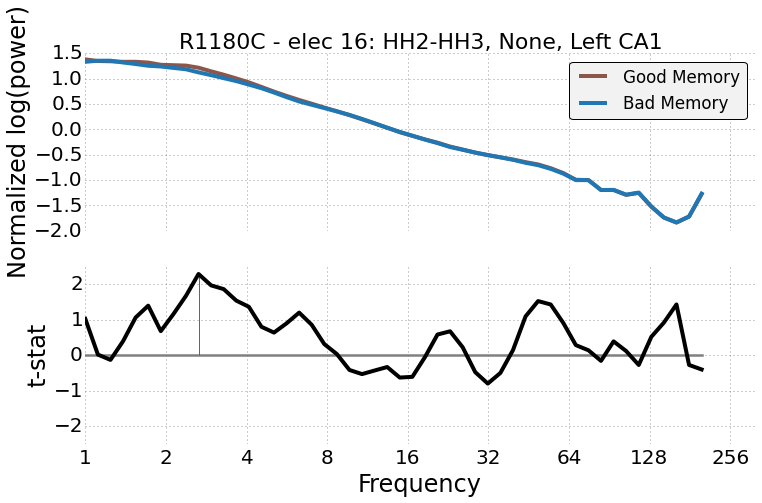

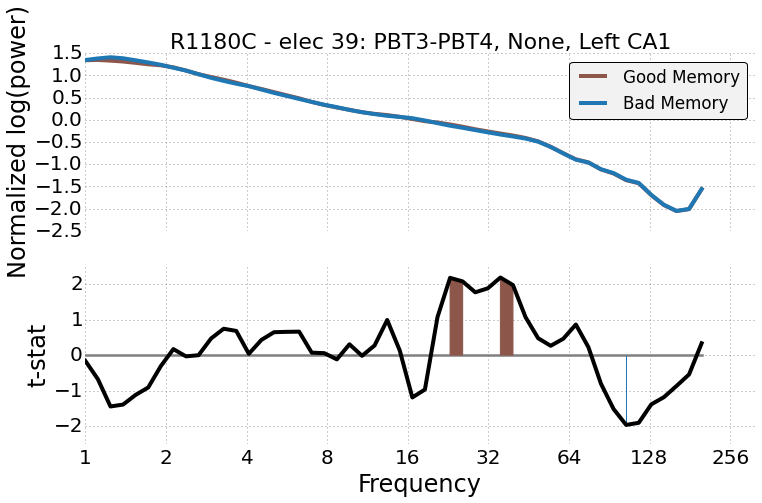

R1188C: Input data already exists, loading.


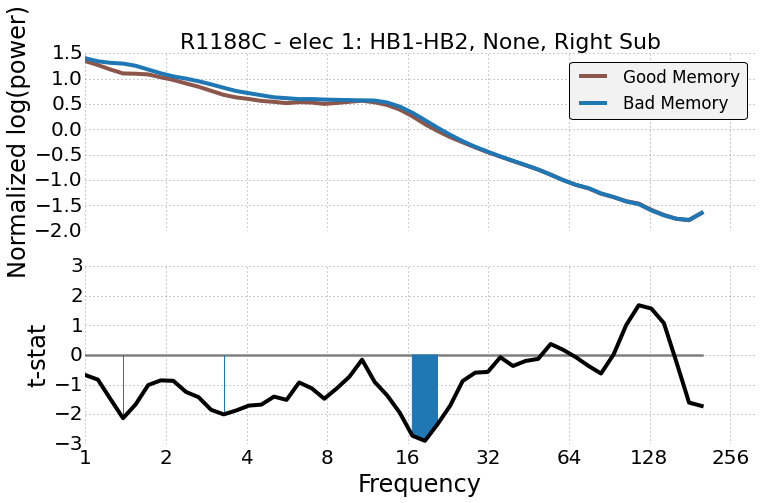

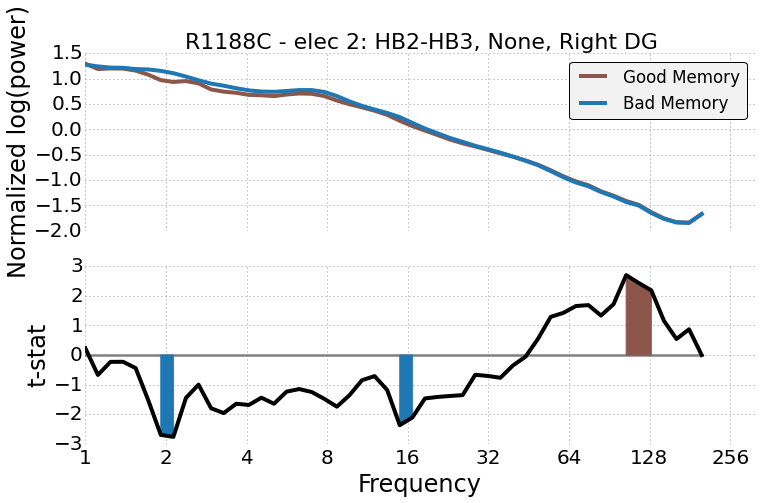

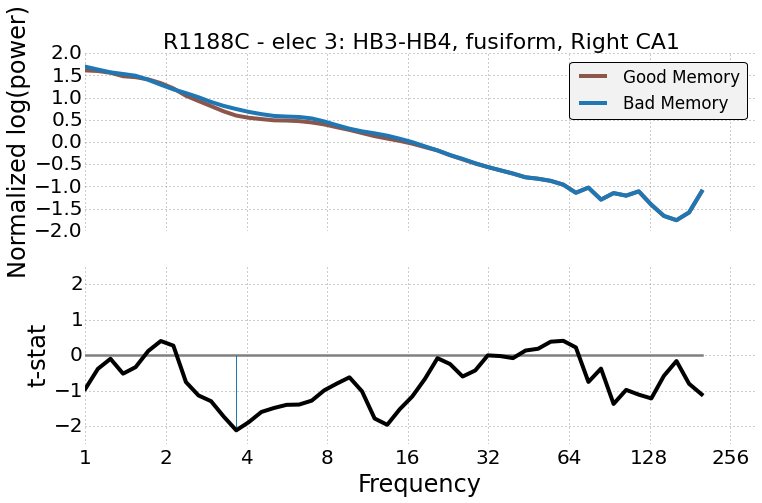

R1190P: Input data already exists, loading.


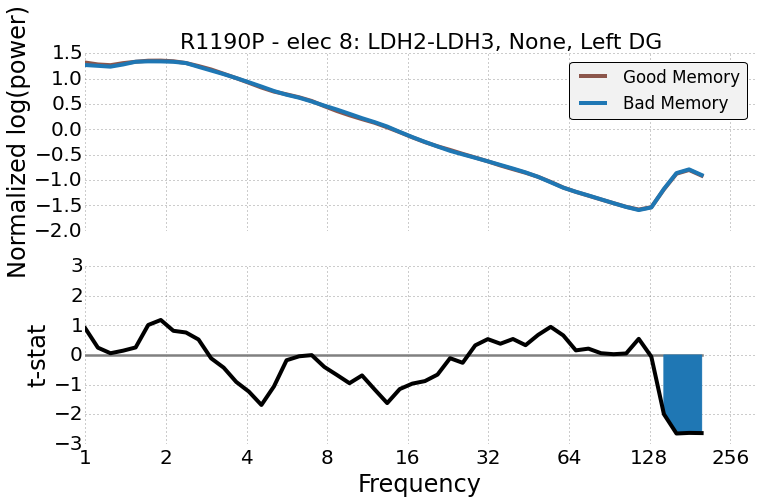

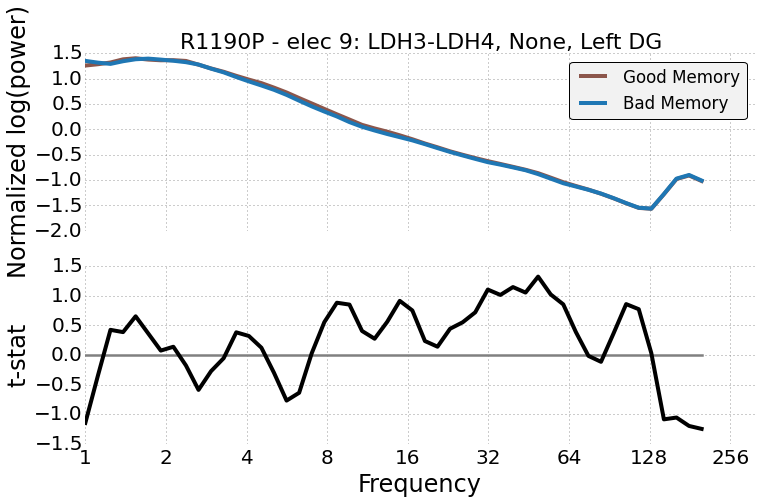

R1191J: Input data already exists, loading.


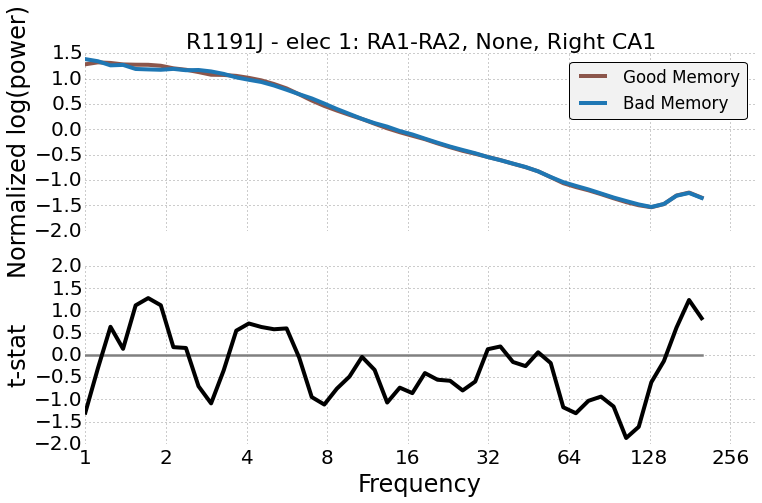

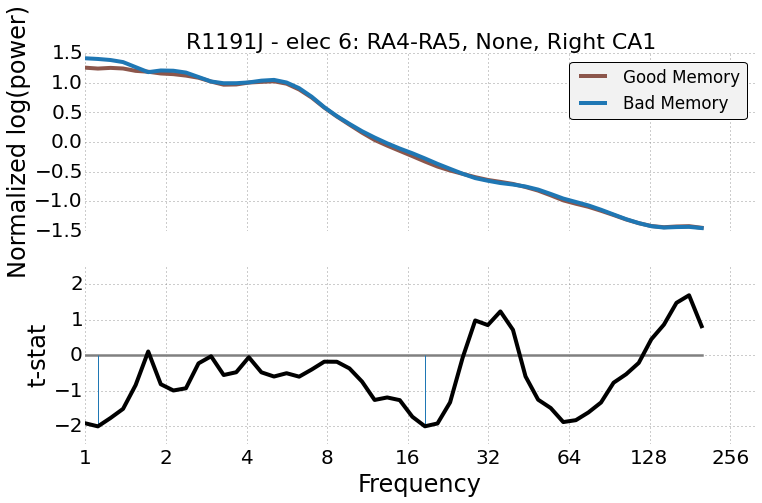

R1192C: Input data already exists, loading.


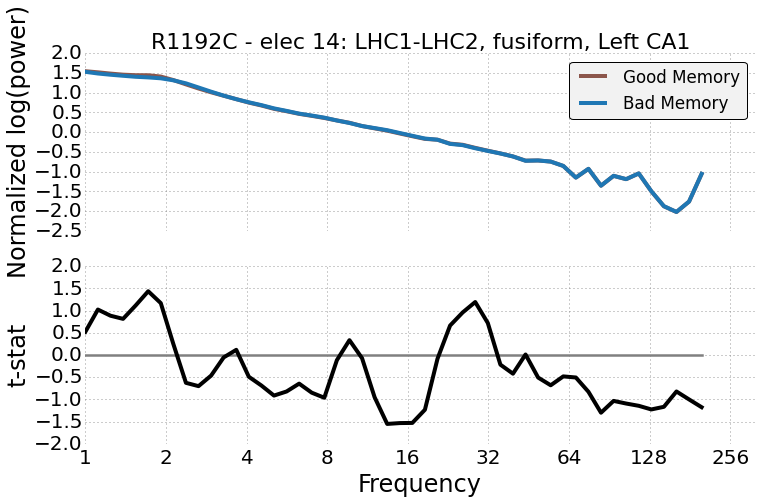

R1194E: Input data already exists, loading.


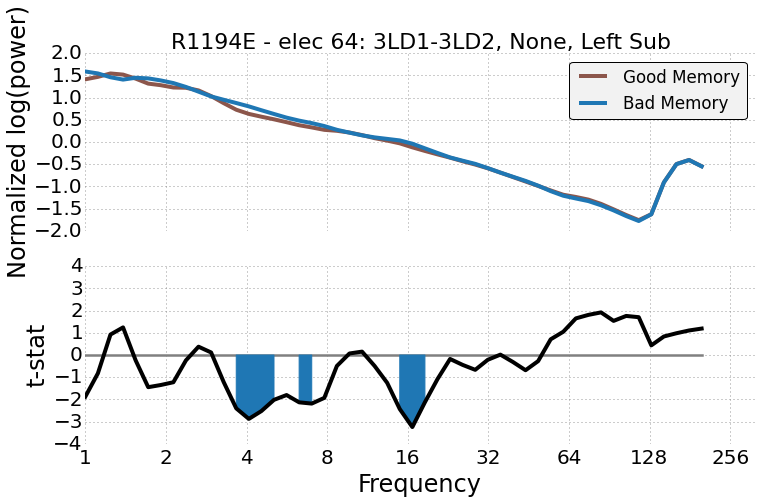

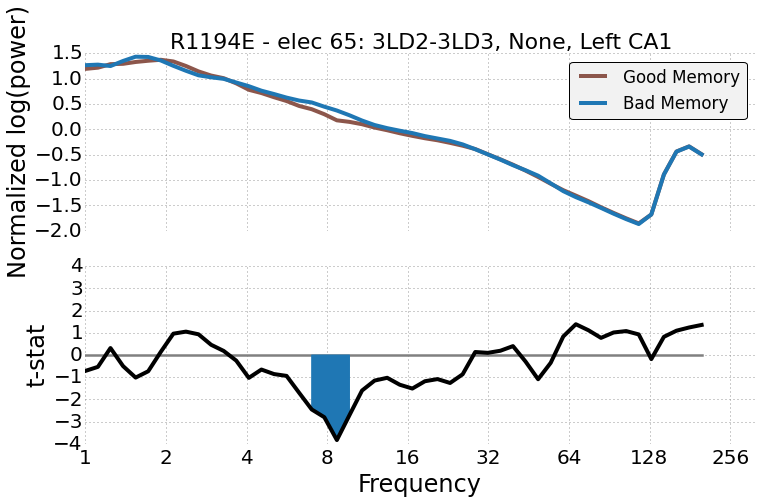

R1195E: Input data already exists, loading.


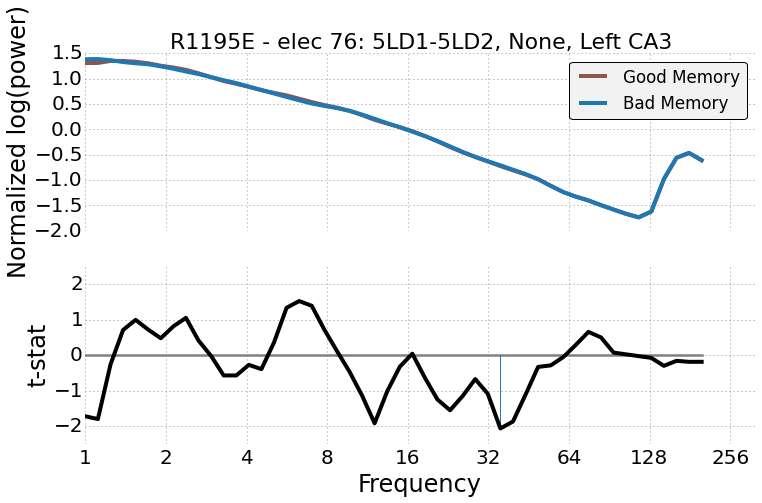

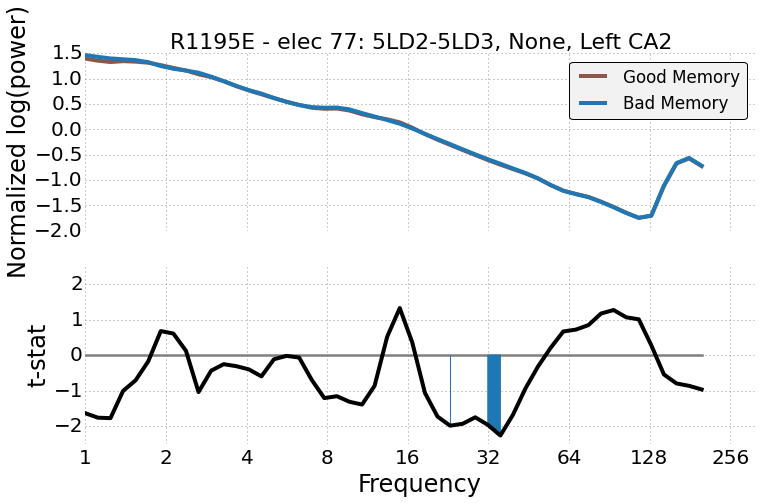

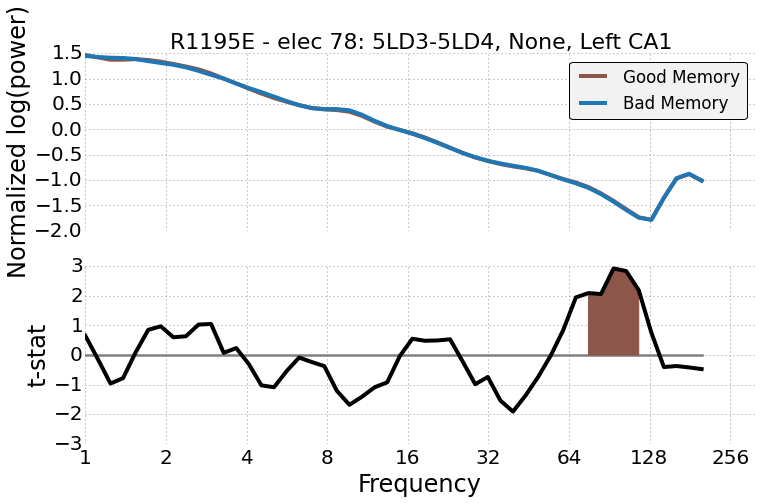

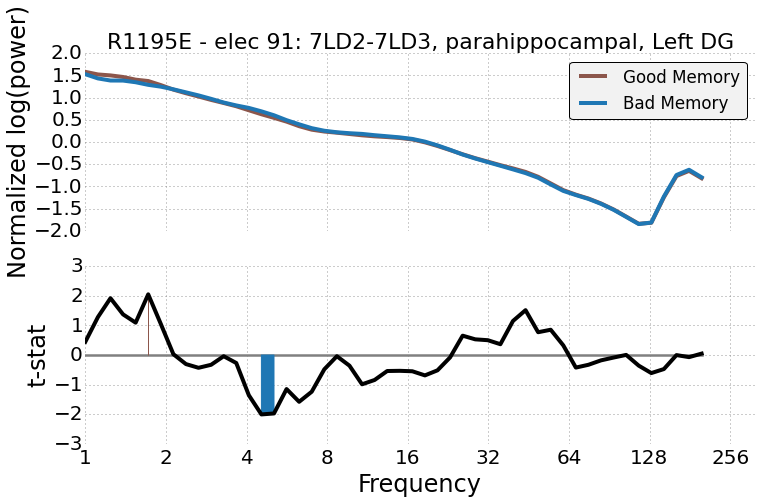

R1201P: Input data already exists, loading.


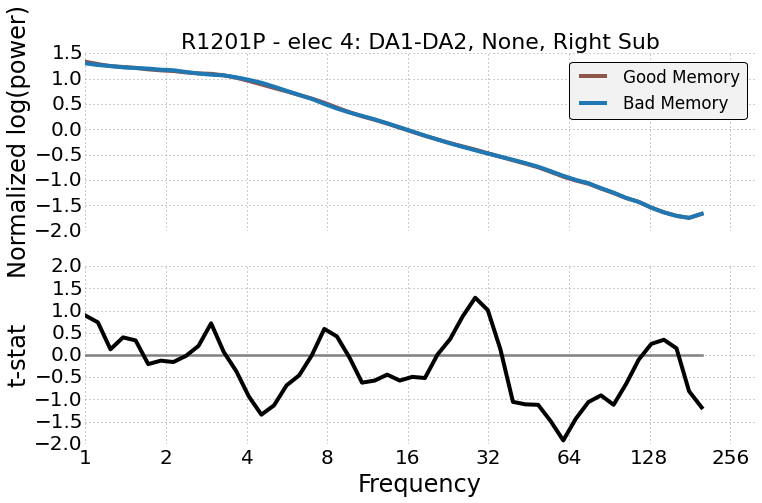

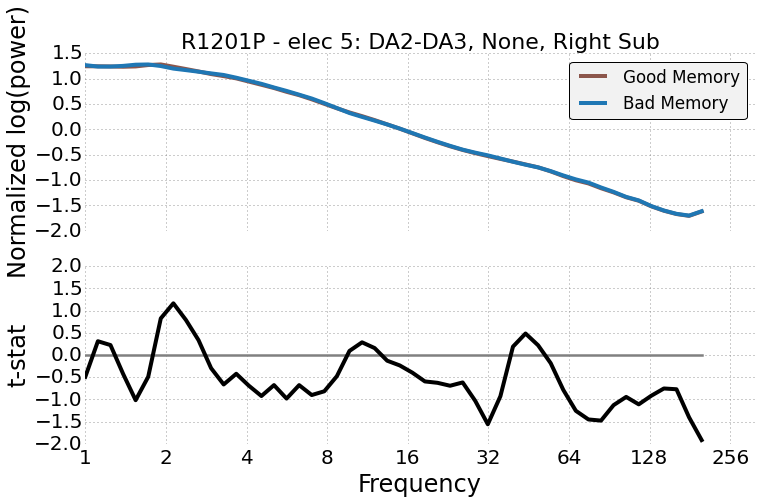

R1201P: Input data already exists, loading.


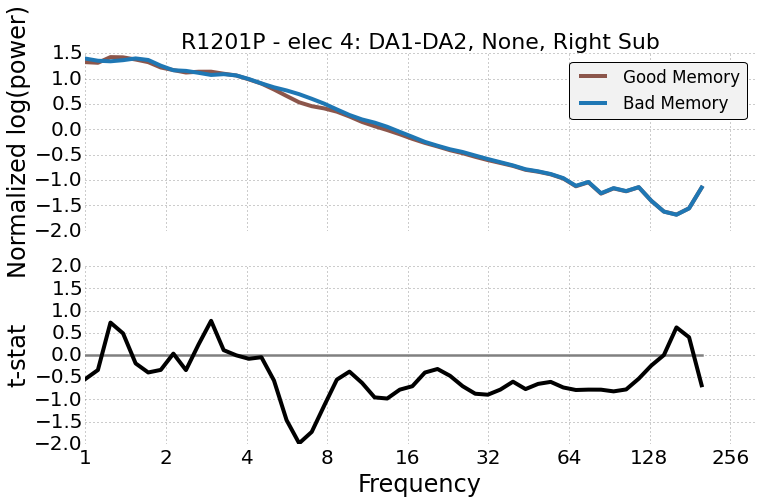

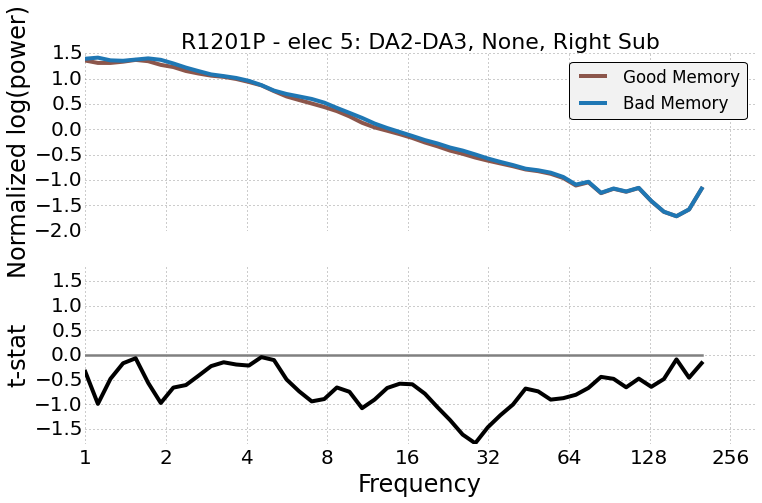

R1204T: Input data already exists, loading.


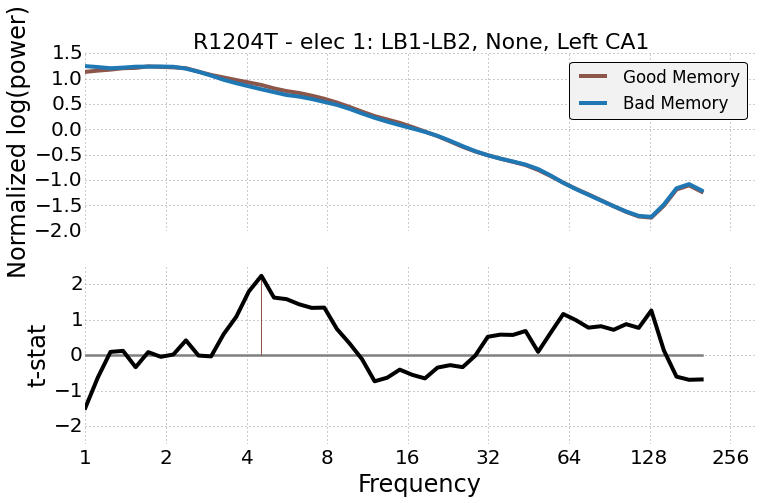

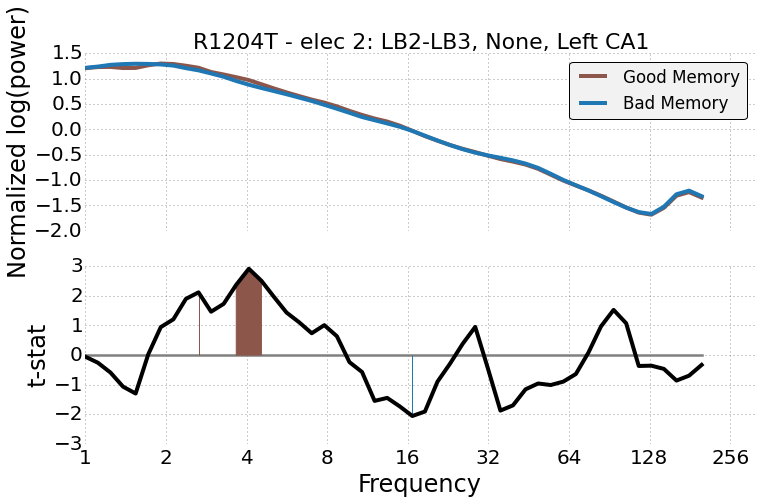

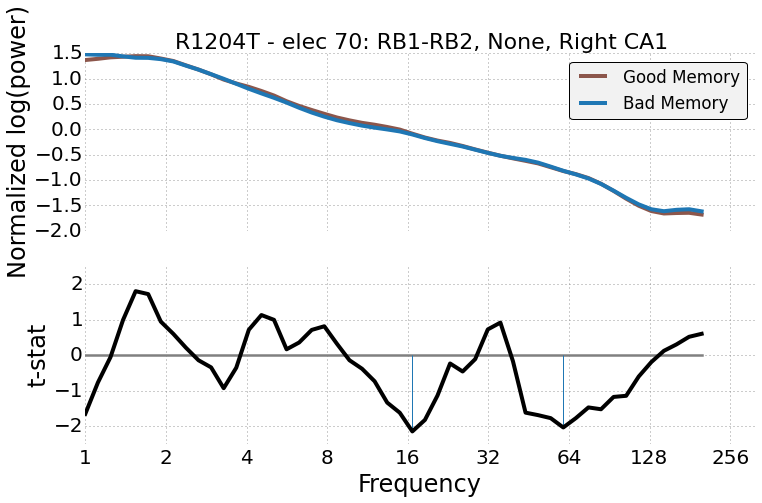

R1207J: Input data already exists, loading.


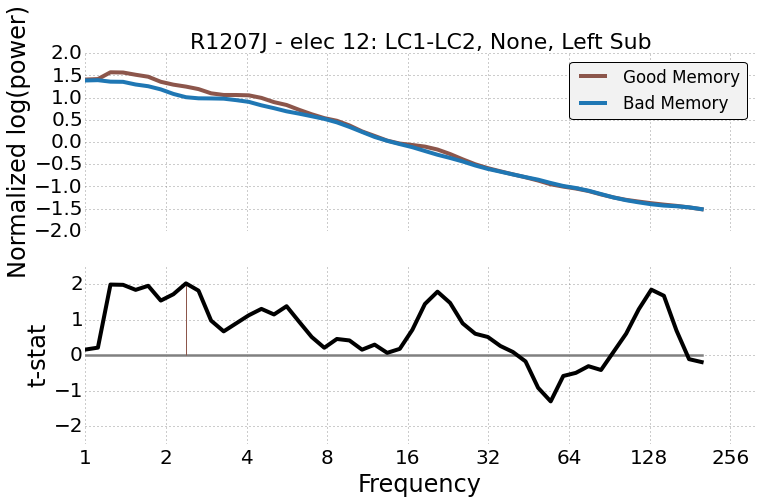

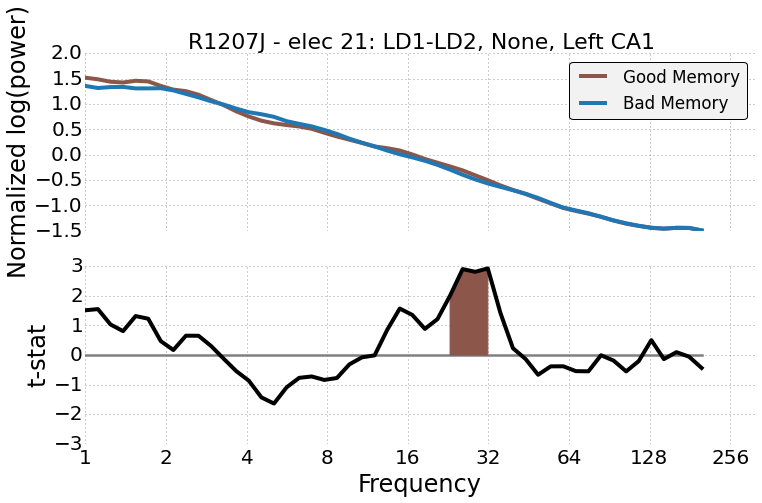

R1208C: Input data already exists, loading.


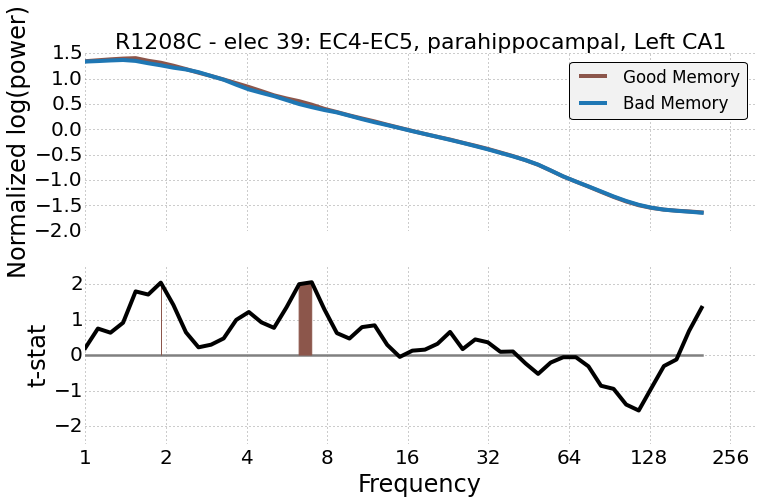

R1210E: Input data already exists, loading.


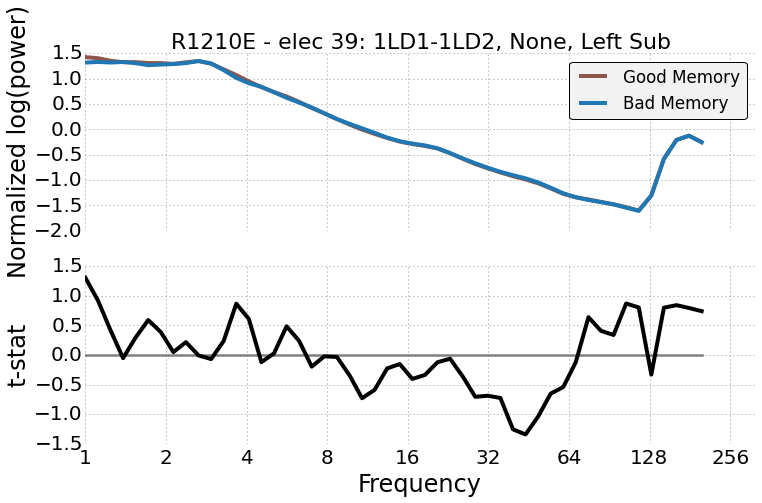

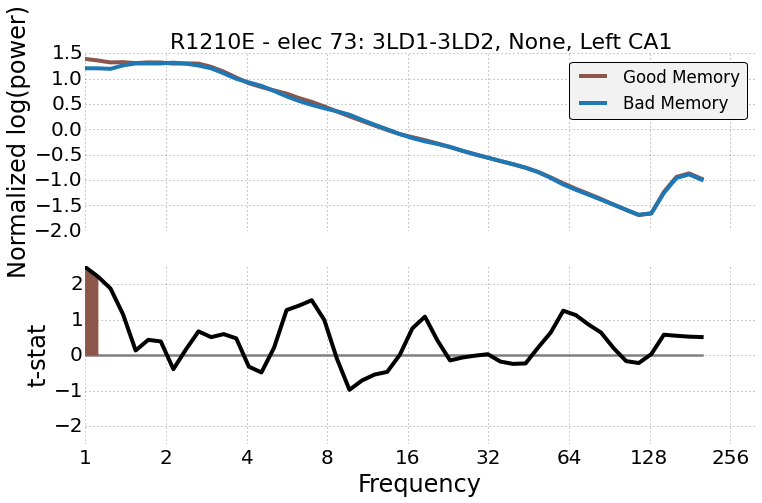

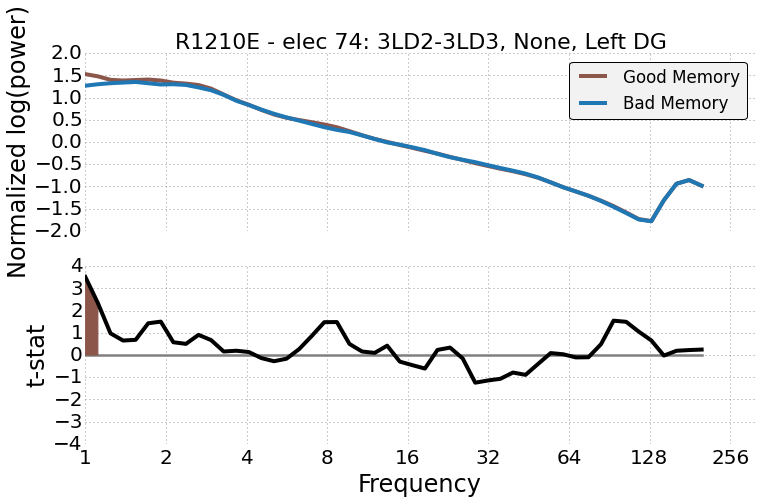

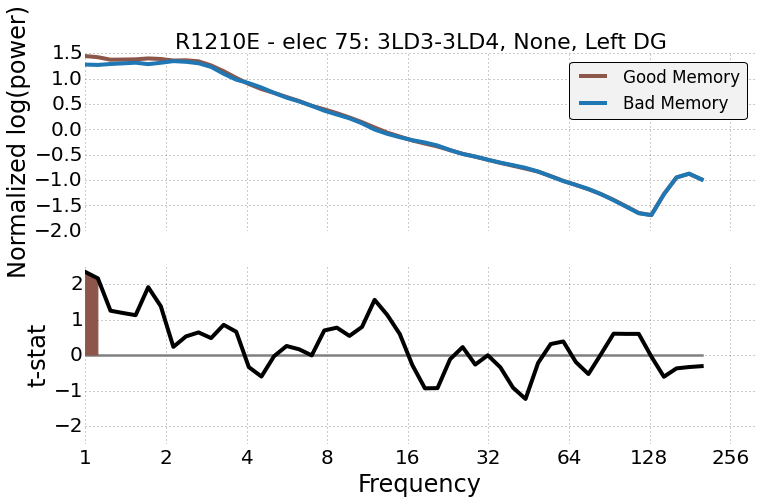

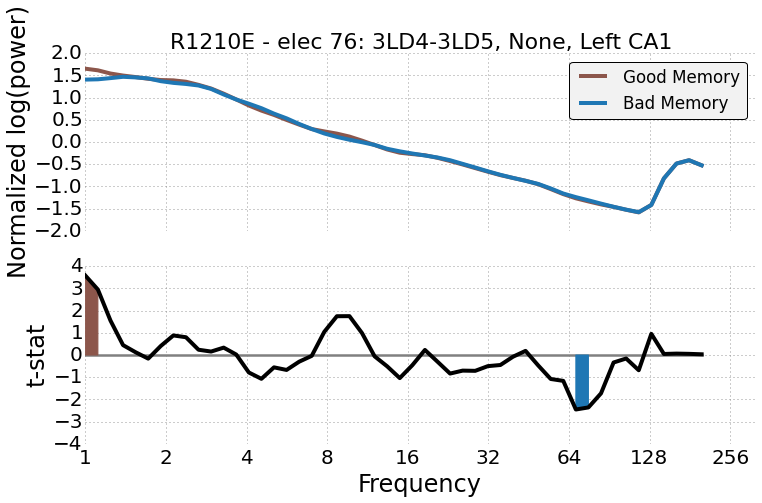

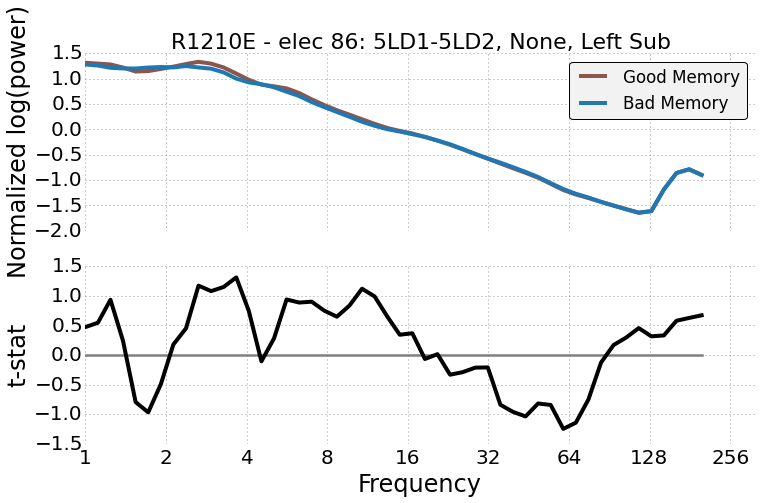

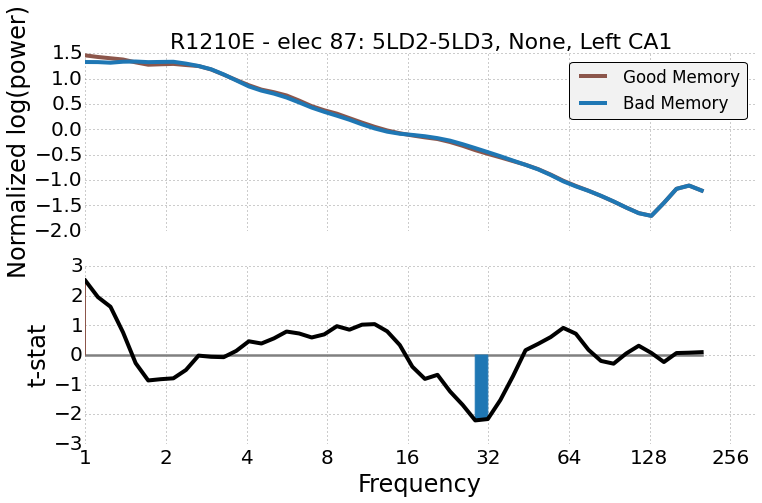

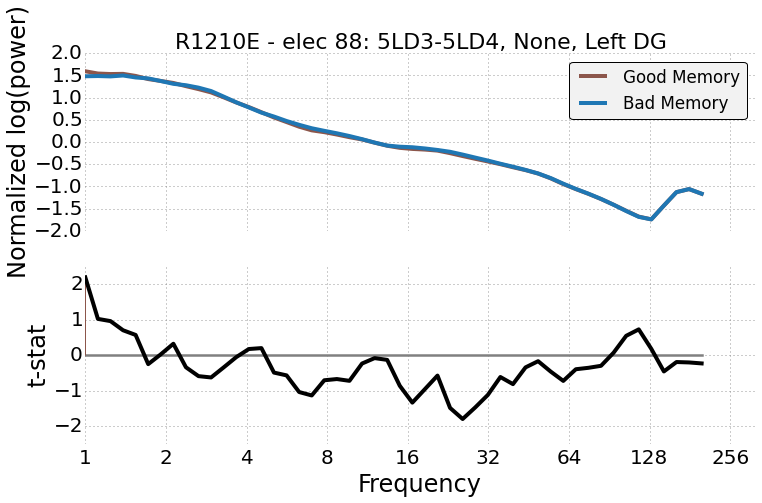

R1212P: Input data already exists, loading.


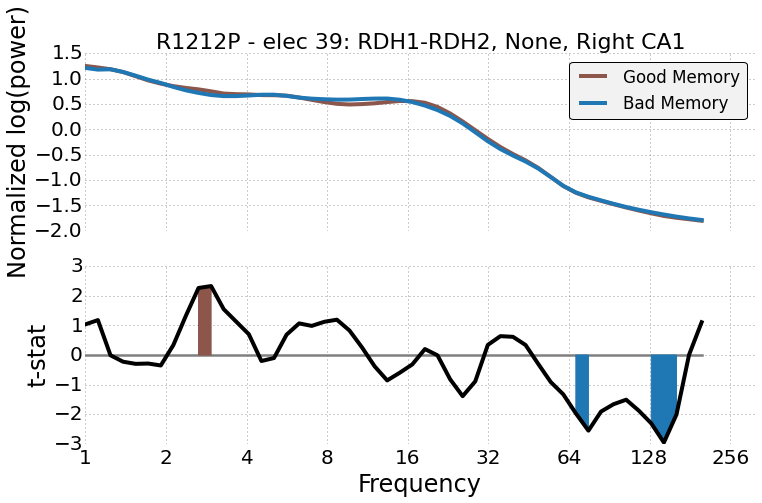

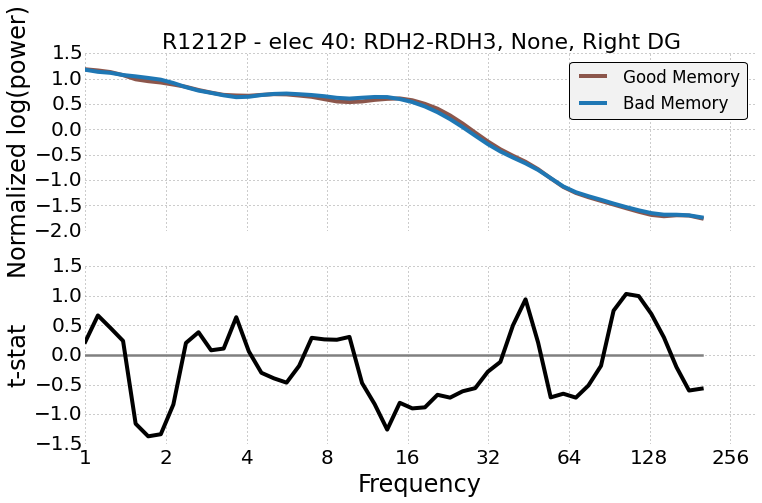

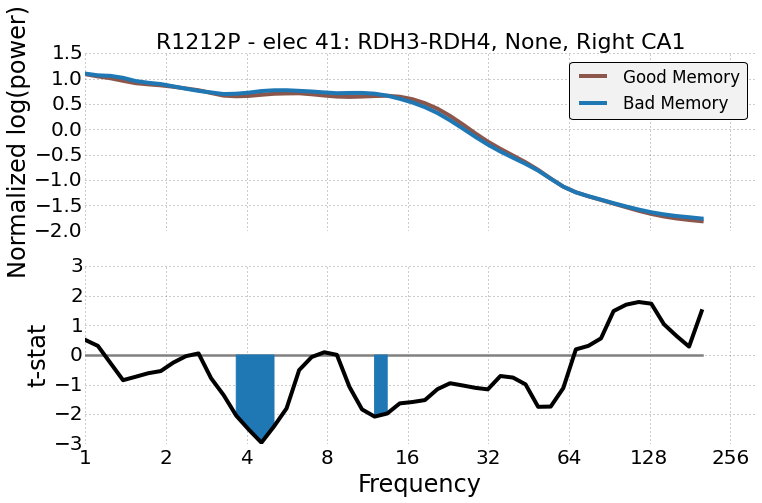

R1219C: Input data already exists, loading.


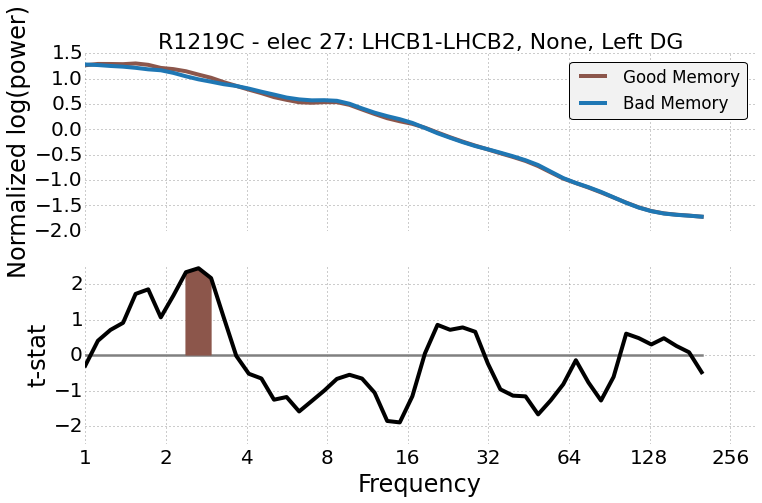

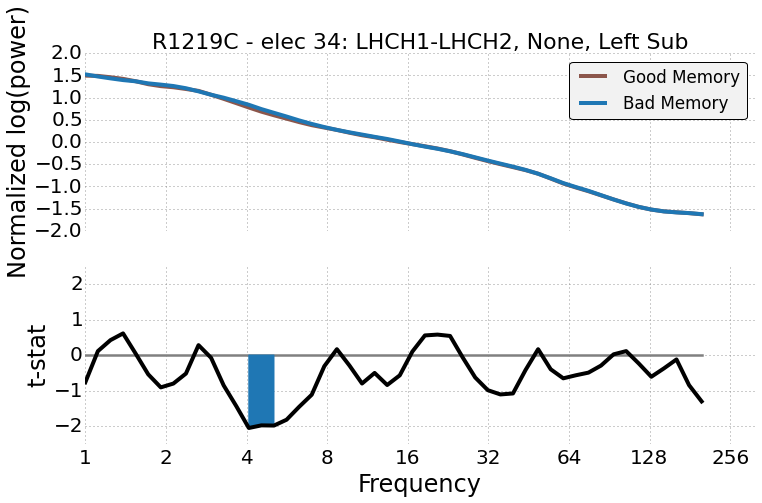

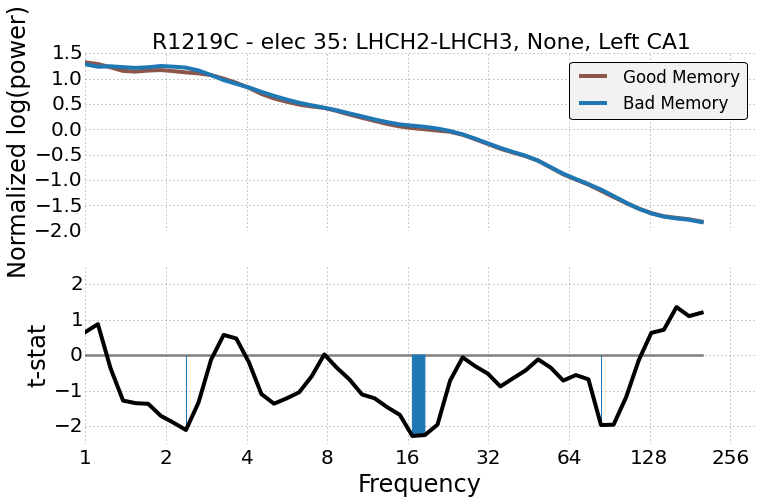

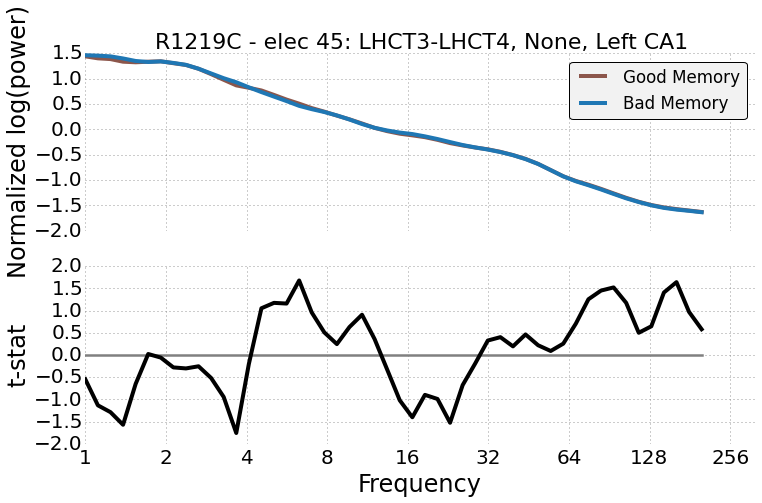

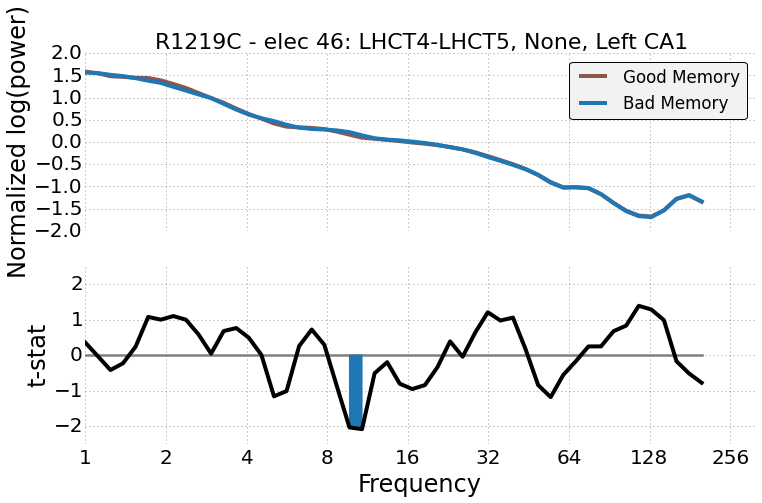

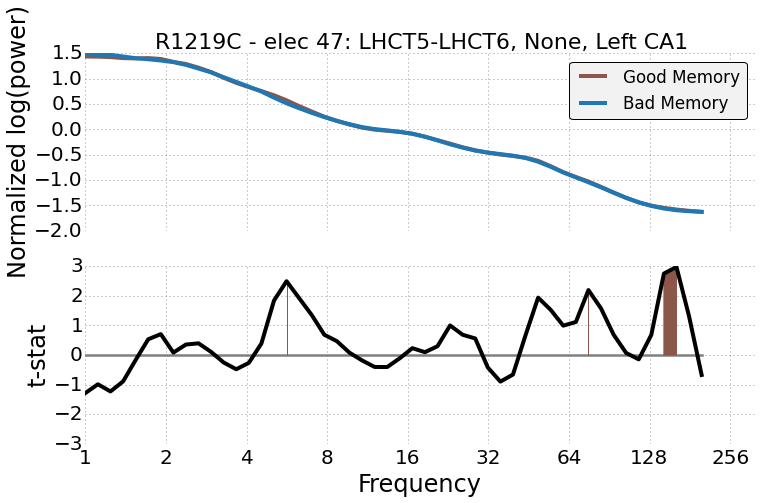

R1236J: Input data already exists, loading.


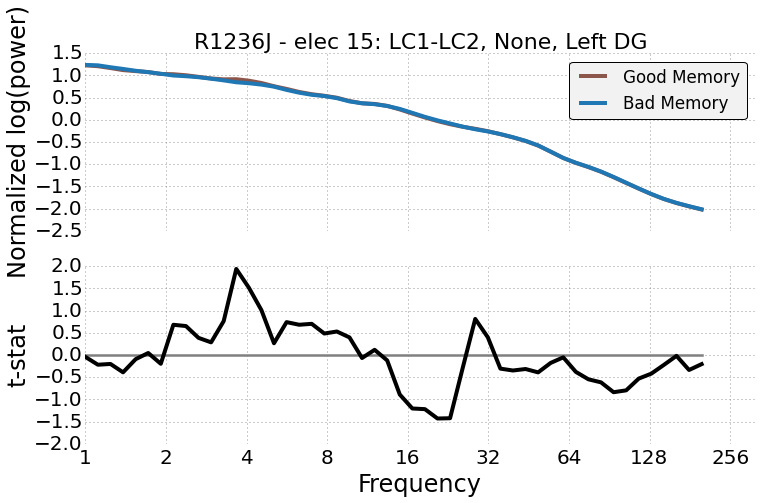

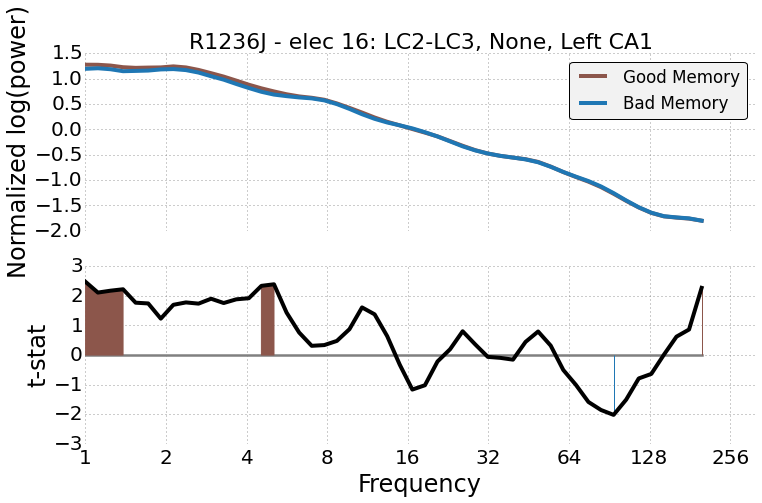

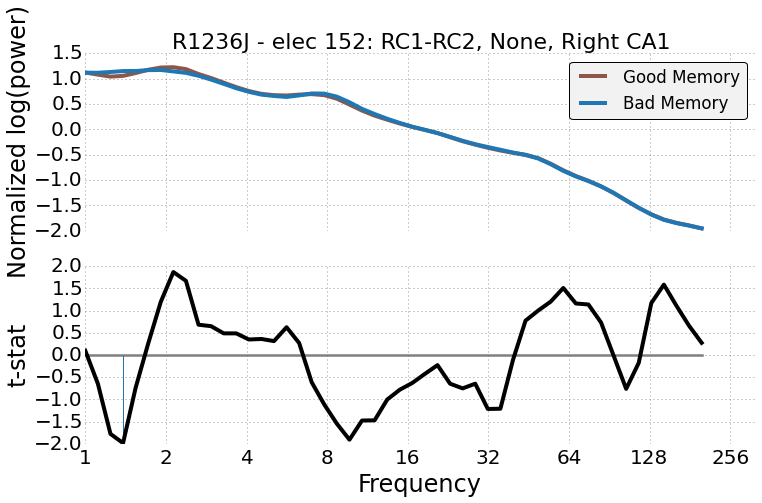

R1240T: Input data already exists, loading.


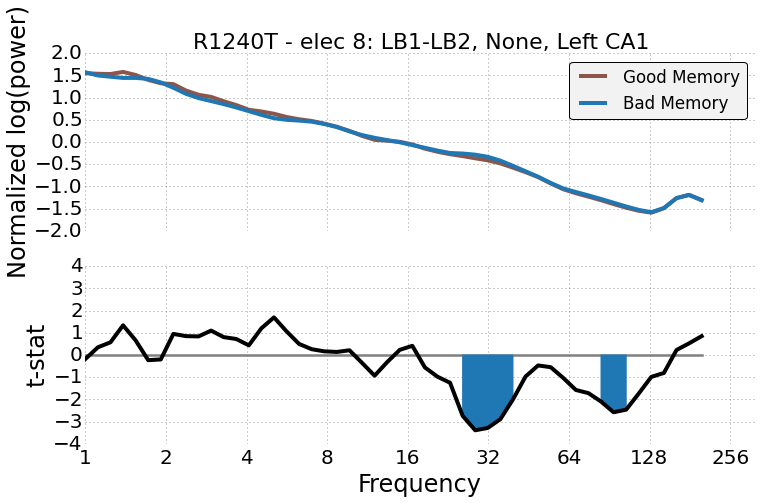

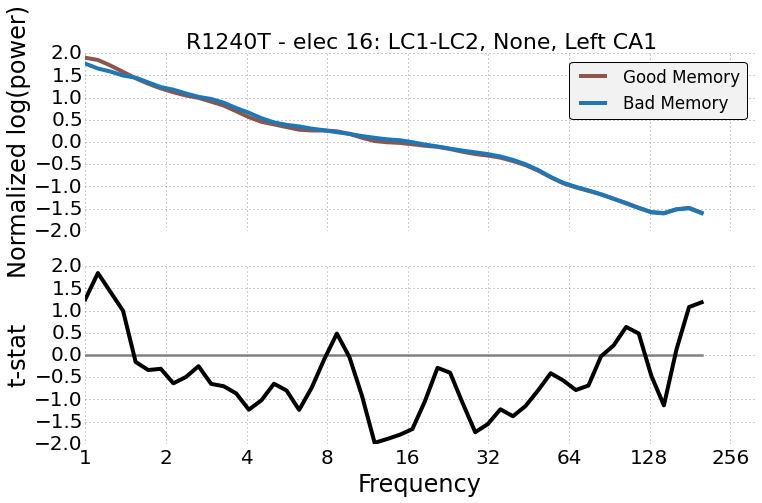

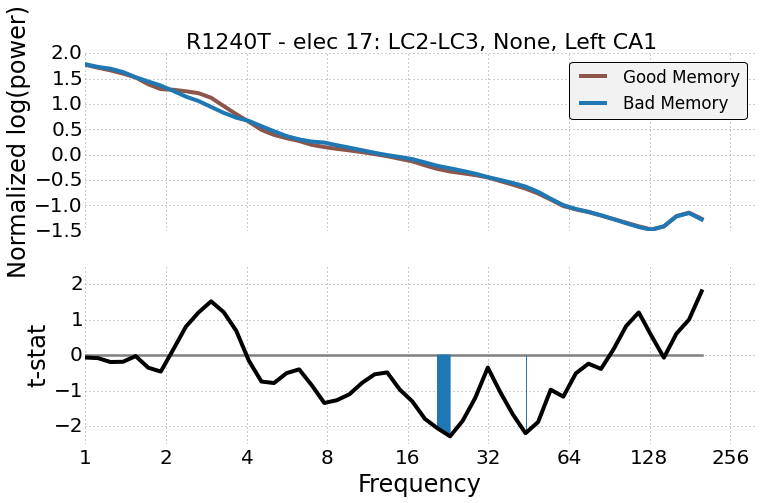

R1241J: Input data already exists, loading.


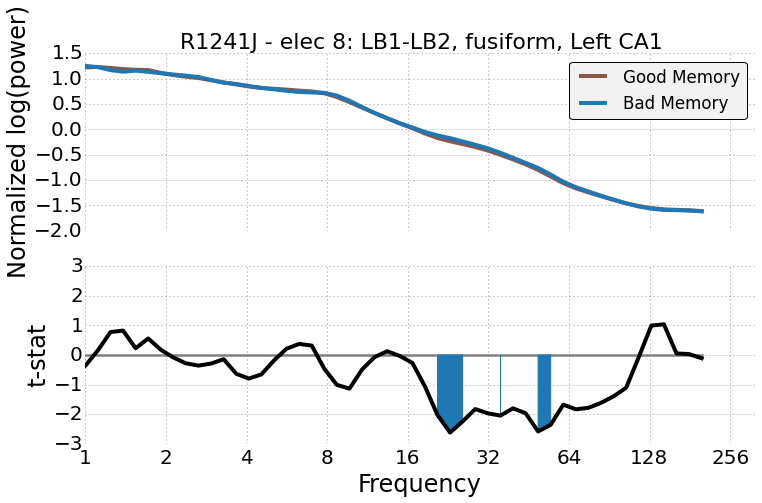

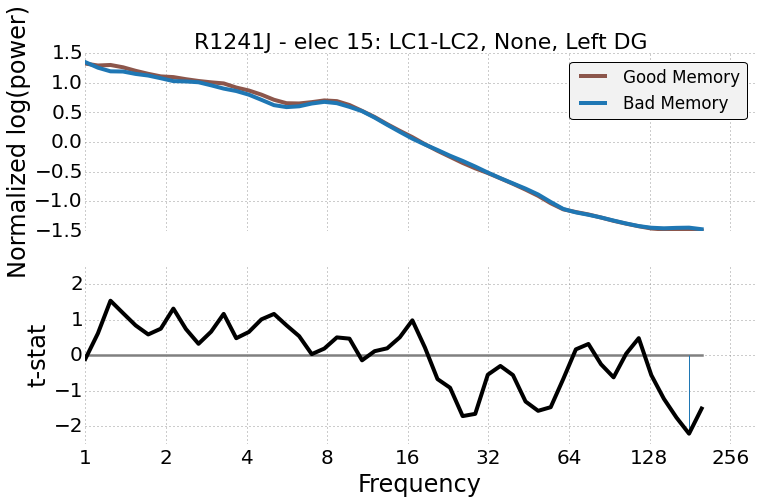

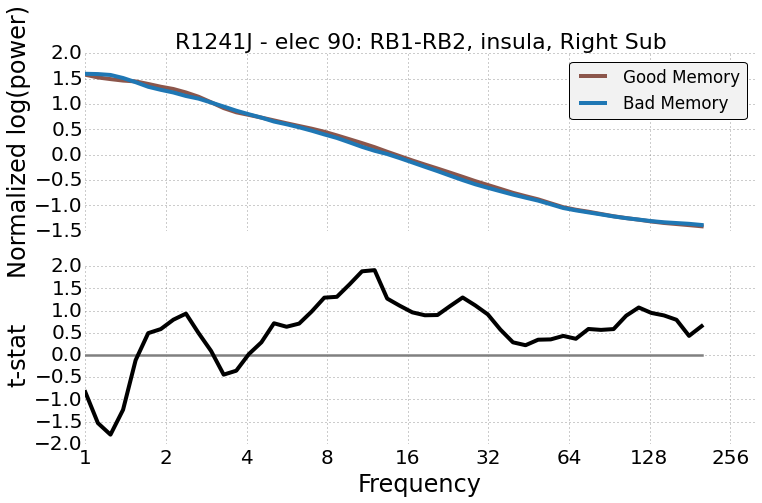

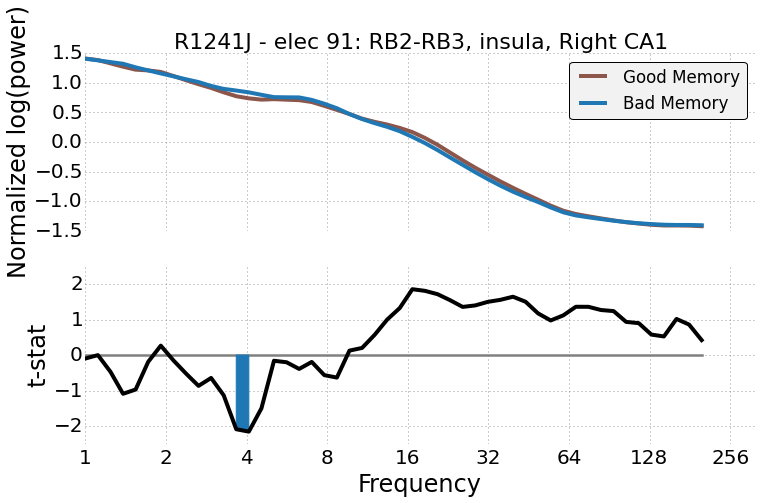

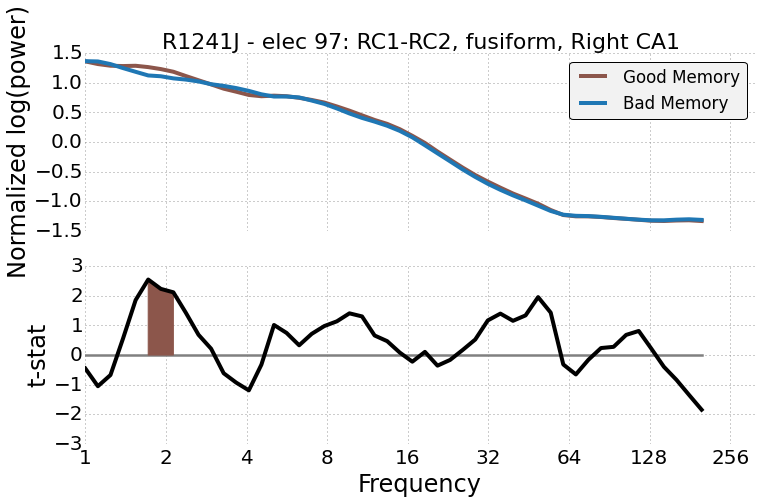

R1248P: Input data already exists, loading.


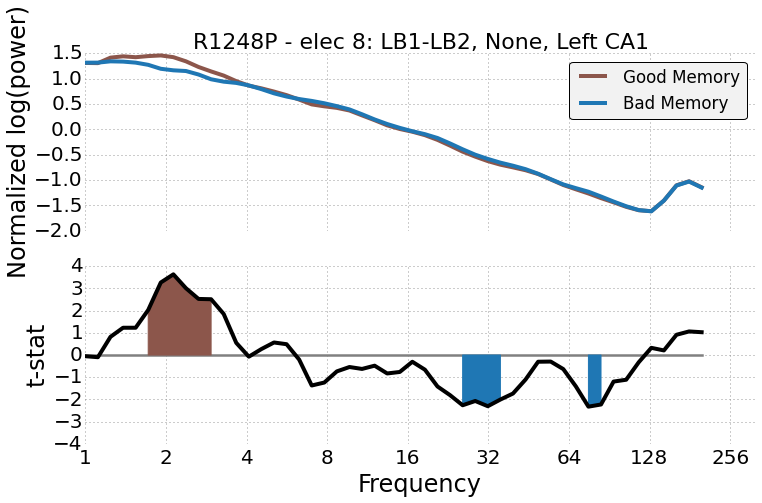

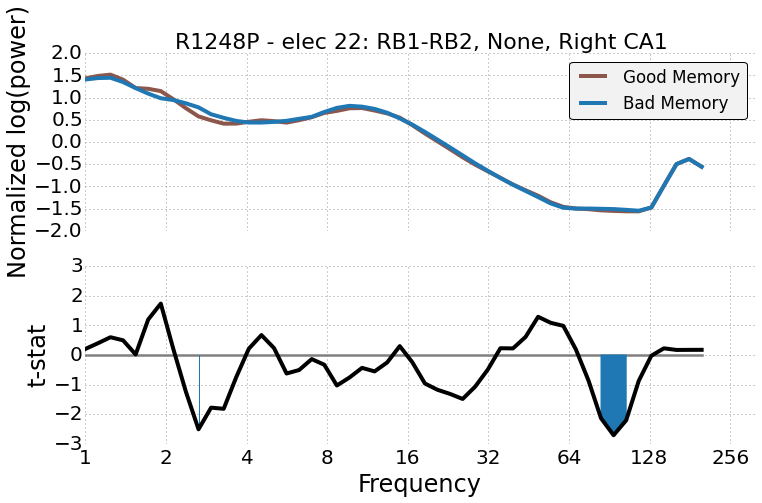

R1248P: Input data already exists, loading.


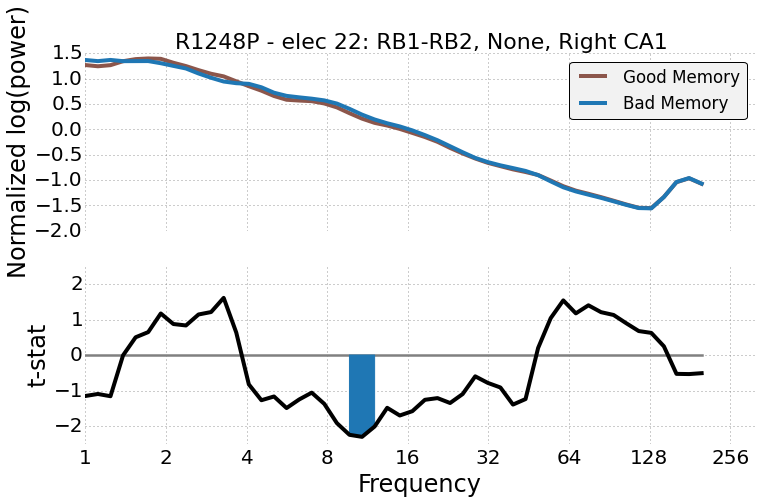

R1267J: Input data already exists, loading.


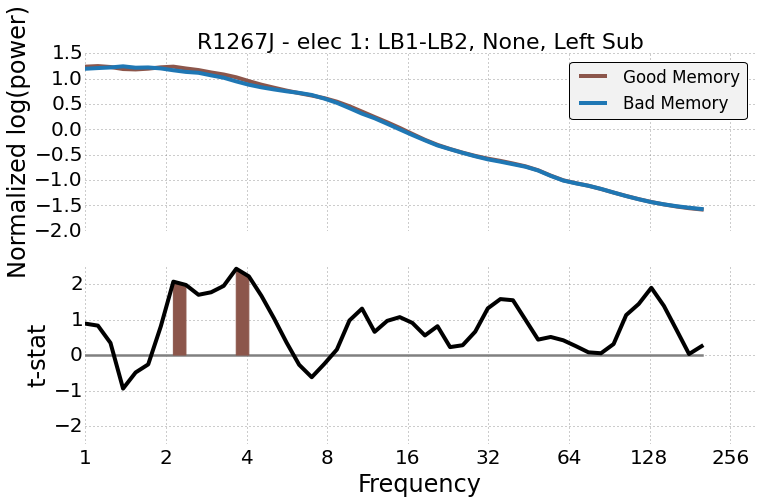

R1270J: Input data already exists, loading.


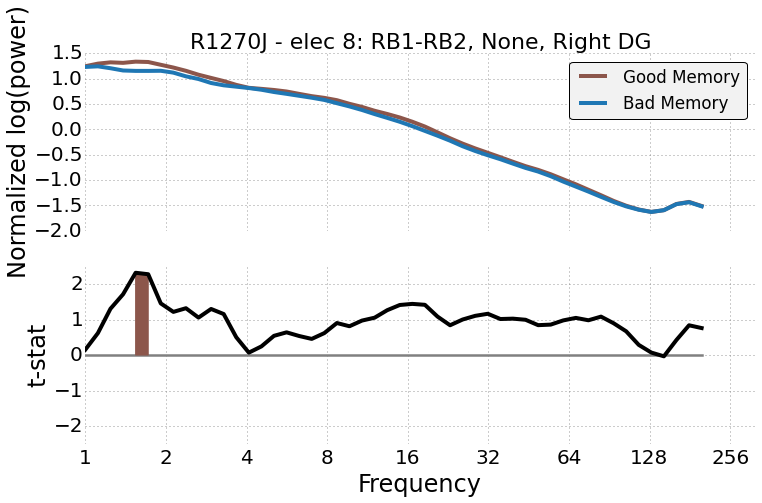

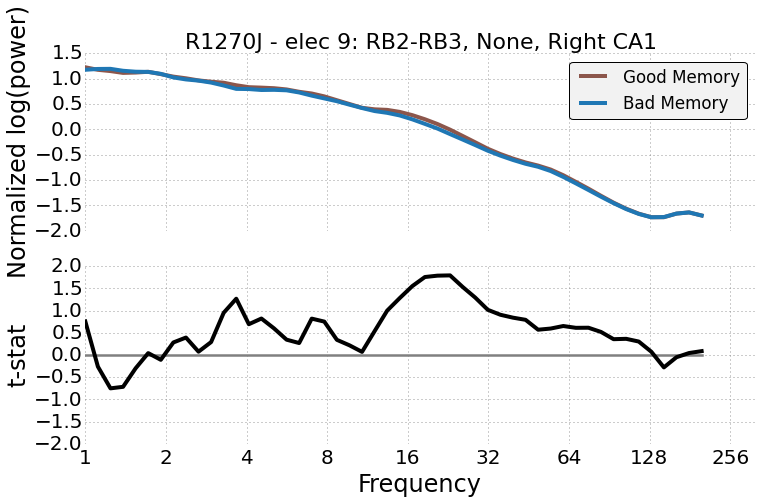

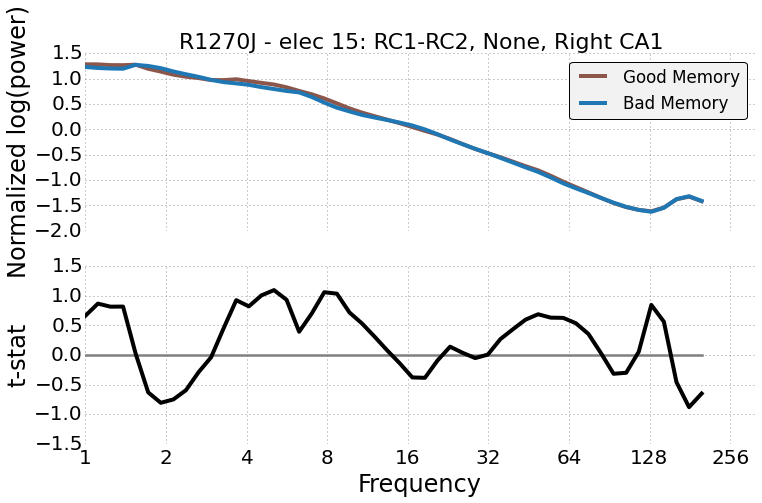

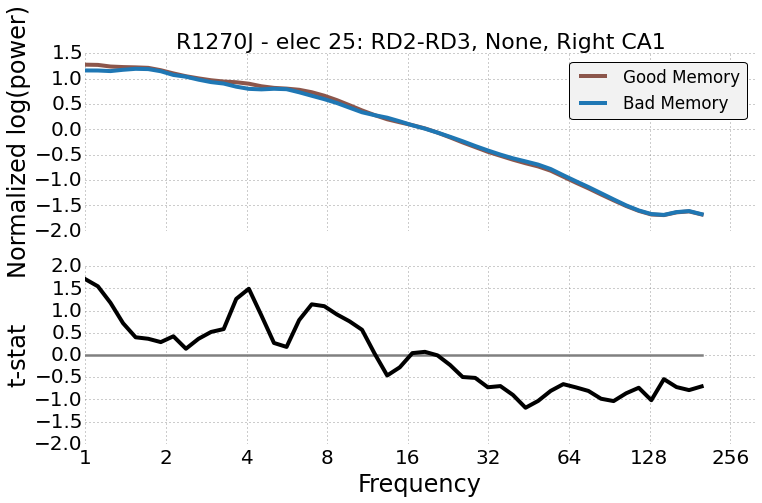

R1276D: Input data already exists, loading.


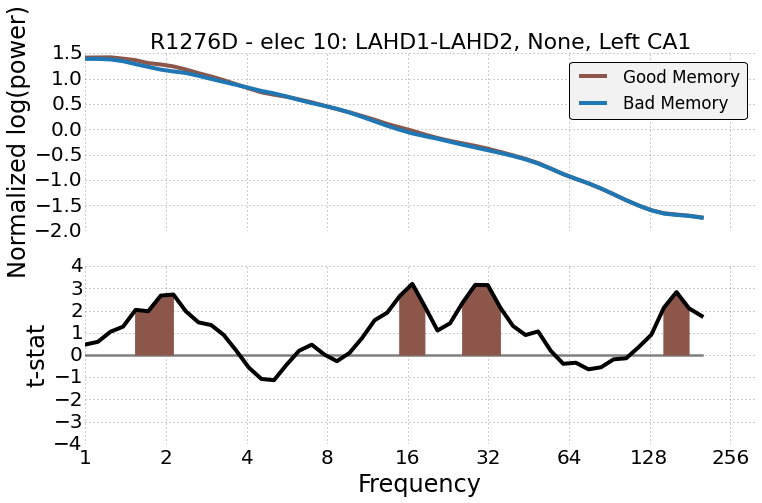

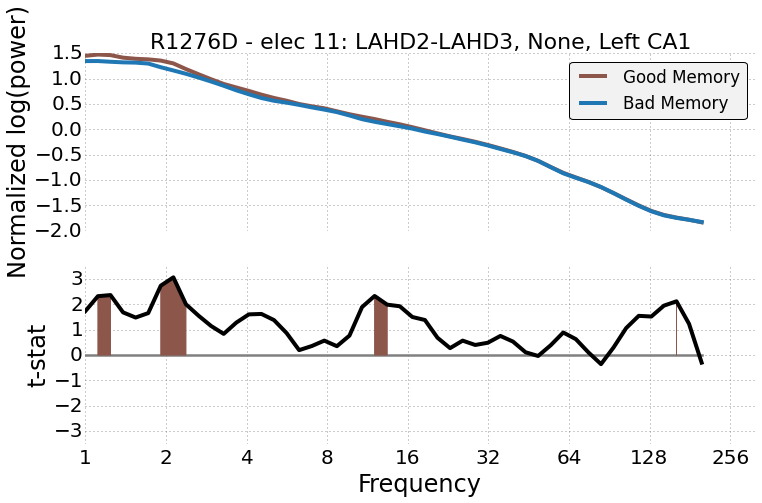

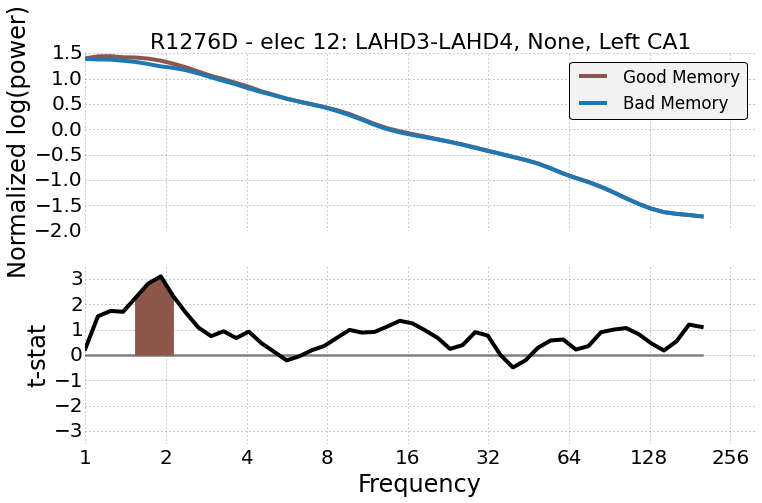

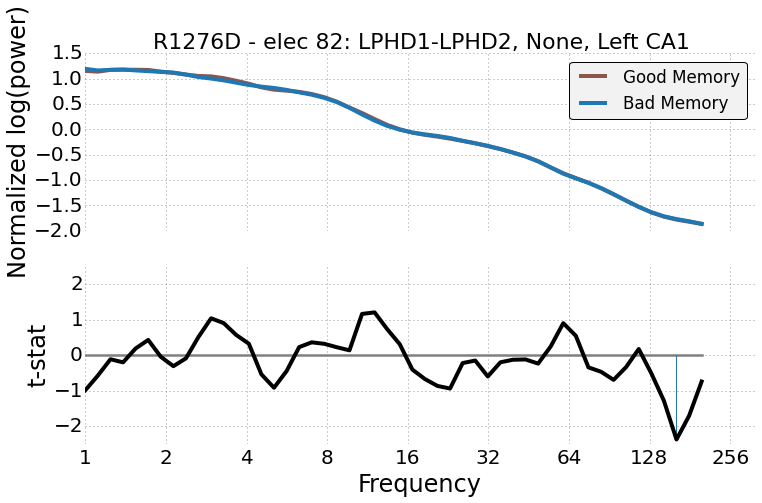

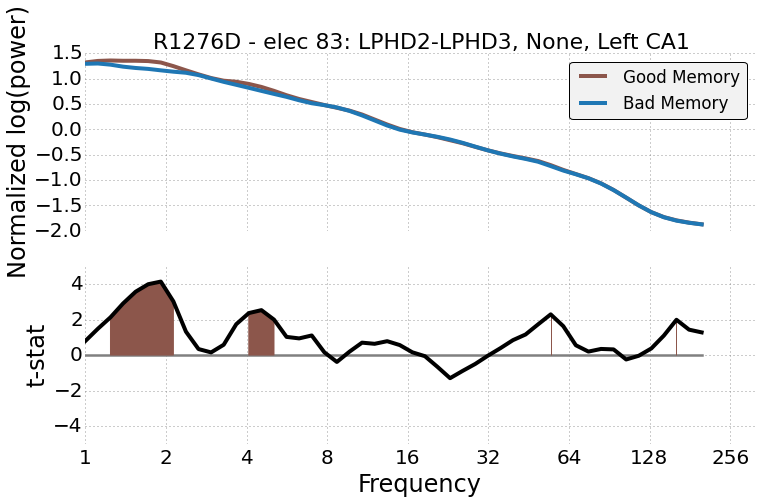

R1278E: Input data already exists, loading.


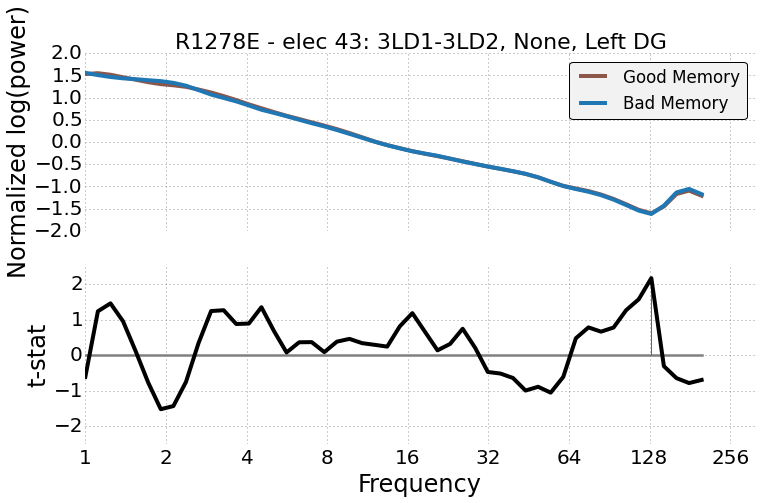

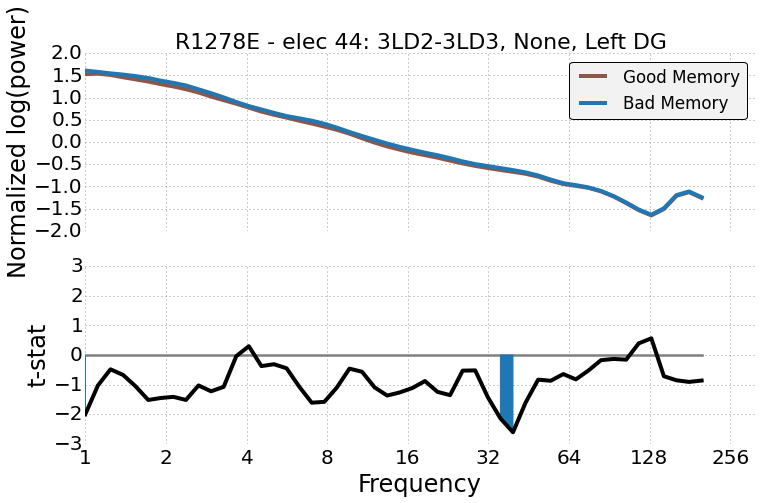

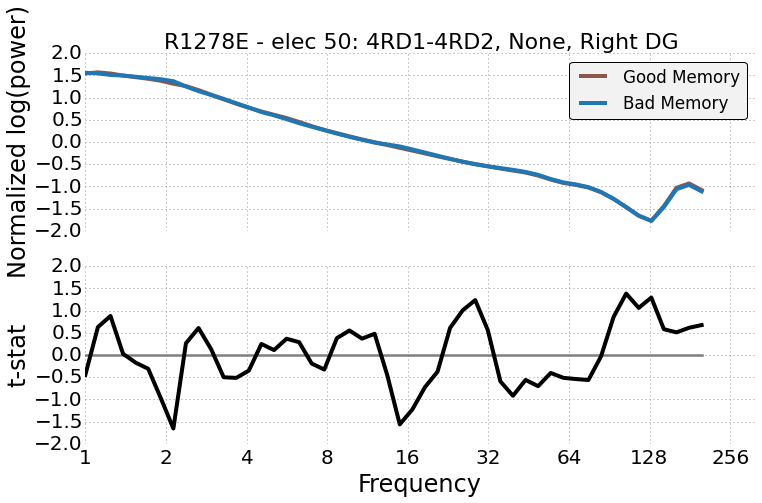

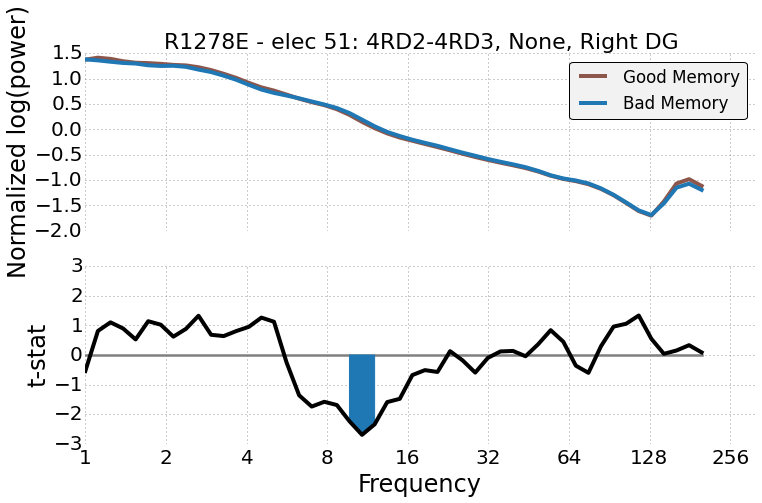

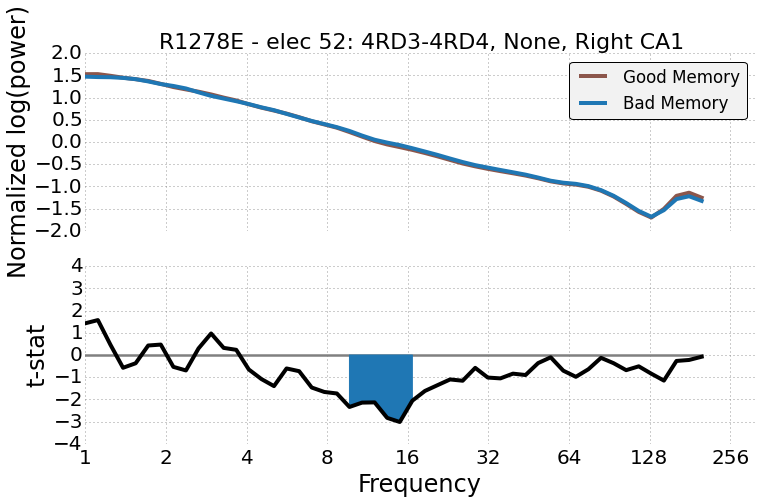

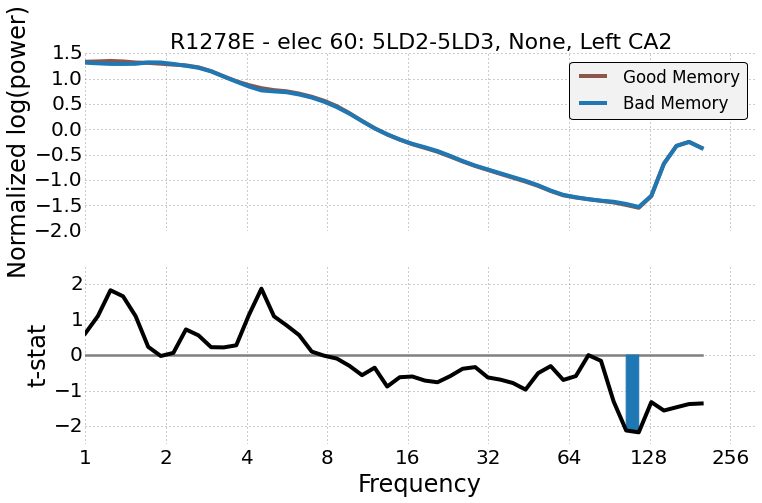

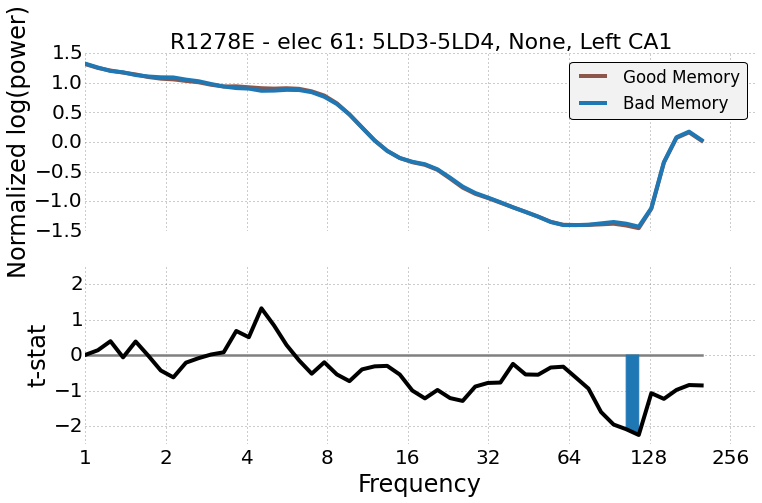

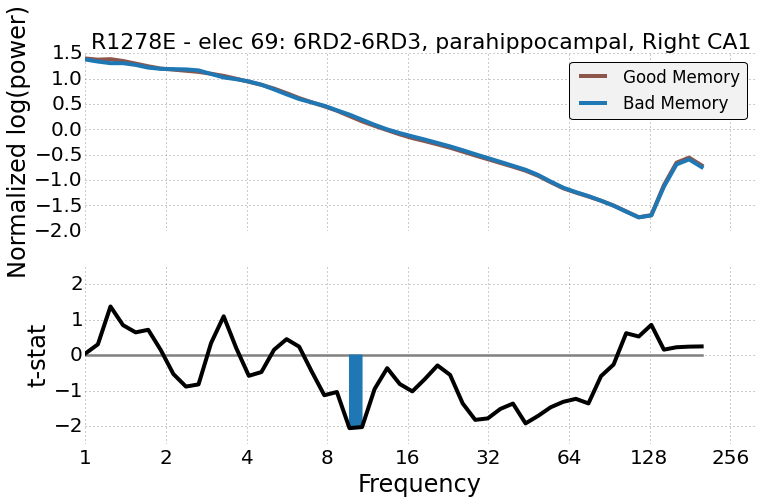

R1289C: Input data already exists, loading.


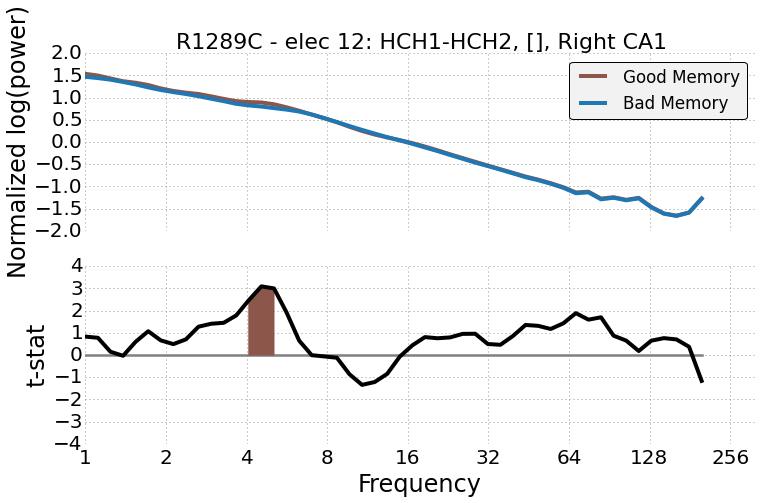

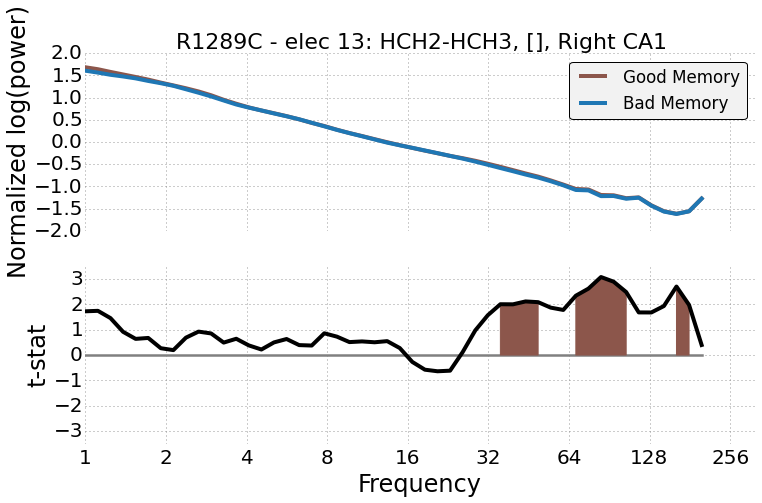

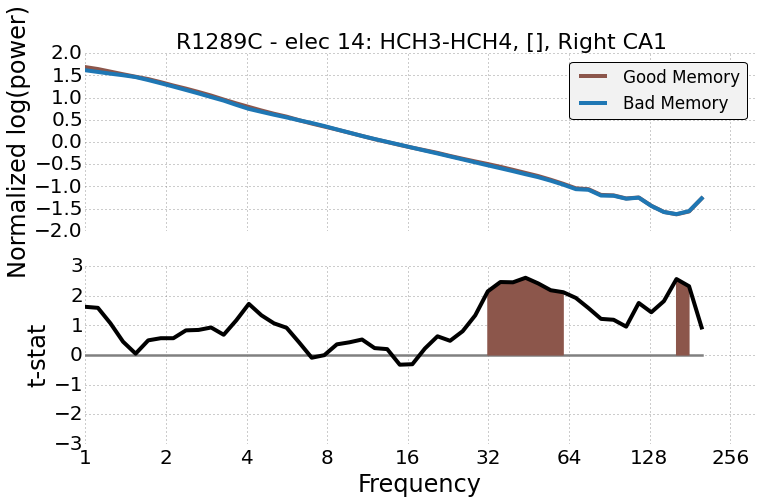

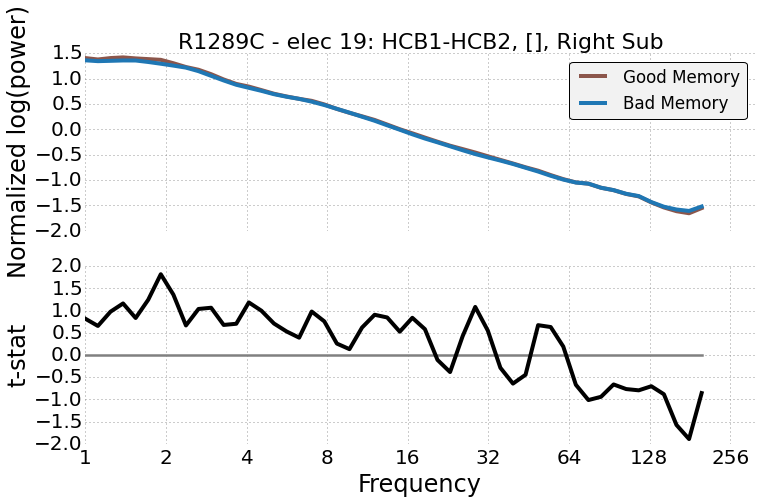

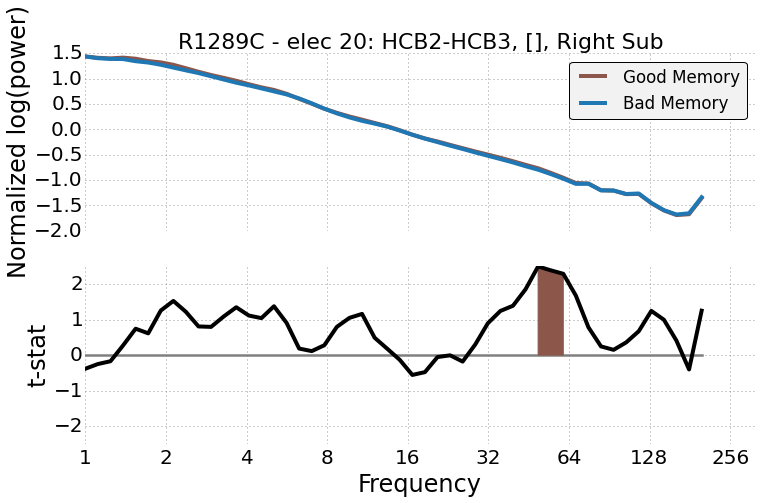

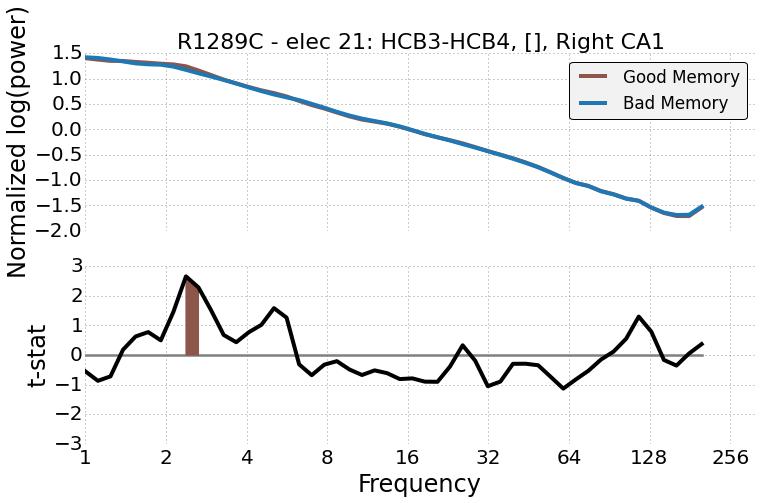

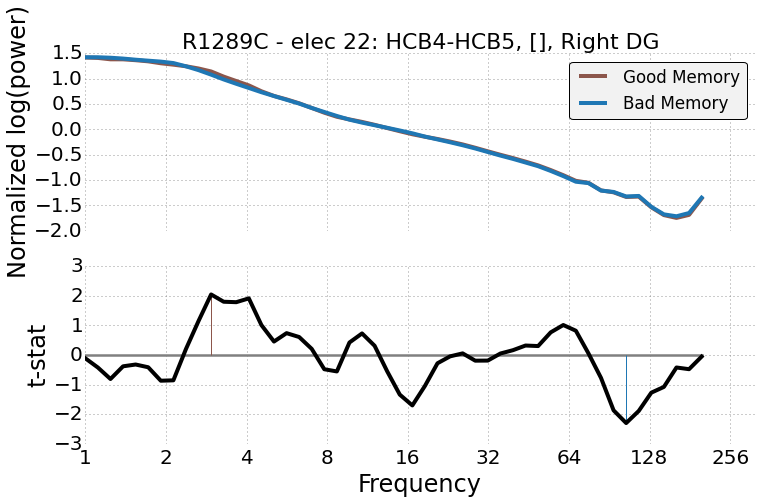

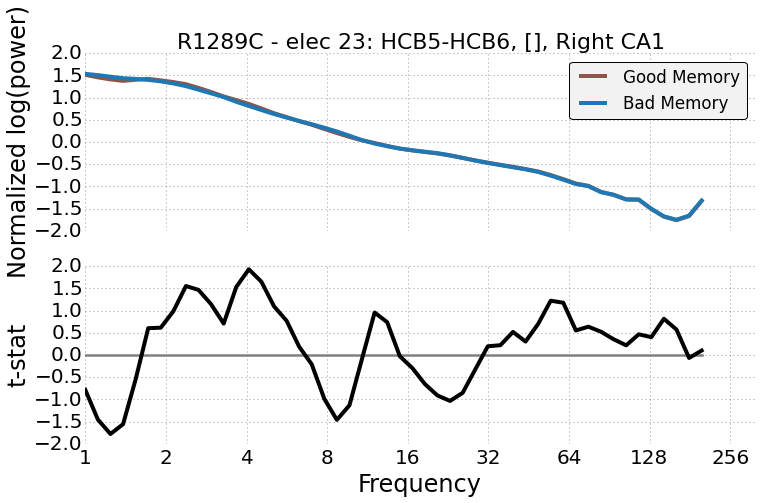

In [88]:
for subj in sme_th.subject_objs:
    hipp_elecs = np.where(subj.elec_locs['Hipp'])[0]
    for h in hipp_elecs:
        if subj.subject_data is None:
            subj.load_data()    
        subj.plot_spectra_average(h)
        ax_list = plt.gcf().axes
        for ax in ax_list:
            ax_list = fig.axes
            ax.set_axisbelow(True)
            ax.set_axis_bgcolor('w')
            ax.grid(color=(.5,.5,.5))
        plt.savefig('/Users/jmiller/Desktop/th1_hipp_pspects/%s_elec_%d.pdf' % (subj.subj, h))
        plt.show()
    subj.subject_data = None

In [25]:
# load data
sme_th = group_SME.GroupSME(load_data_if_file_exists=True, subject_settings='default_50_freqs',
                         load_res_if_file_exists=True, bipolar=True, use_json=True,
                         do_not_compute=True,start_time=[0.0],end_time=[1.5], subjs=th_subjs,
                           recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
sme_th.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: loading results.
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading results.
R1189M: loading results.
R1190P: loading results.
R1191J: loading results.
R1192C: loading results.
R1194E: loading results.
R1195E: loading results.
R1198M: No results to load.
R1198M: Input data a

In [12]:
move = group_move_vs_still.GroupMoveStill(subjs=th_subjs,
                                        load_data_if_file_exists=True,
                                        load_res_if_file_exists=True, use_json=True,
                                        do_not_compute=True)
move.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: loading results.
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: subject_data does not exist, not computing.
Data must be loaded before saving. Use .load_data()
ERROR PROCESSING [u'R1182C' u'0'].
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading results.
R1189M: loading results.
R1190P: loading results.
R1191J: loading results.
R1192C: loading results.
R1194E: loading results.
R1195E: loading

### Normalize encoding and movement/still events together

In [79]:
from SubjectLevel import subject_exclusions
from scipy.stats import ttest_ind
from copy import deepcopy

# zip timebins, movement, and encoding
for subj in zip(move.subject_objs, sme_th.subject_objs):
    do_ana = []
    for analysis in subj:
        analysis.load_data()
        analysis = subject_exclusions.remove_abridged_sessions(analysis)
        if analysis.subject_data is None:
            do_ana.append(False)
        else:
            do_ana.append(True)
    if False in do_ana:
        continue
        
    subj_move = subj[0]
    x1 = deepcopy(subj_move.subject_data.data)
    subj_sme = subj[1]
    x2 = deepcopy(subj_sme.subject_data.data)    

    sessions = np.concatenate([subj_move.subject_data.events.data['session'],
                               subj_sme.subject_data.events.data['session']])
    
    mean_over_time = np.concatenate([subj_move.subject_data.data,
                                     subj_sme.subject_data.data])
    
    uniq_sessions = np.unique(sessions)
    for sess in uniq_sessions:
        sess_event_mask = (sessions == sess)
        m = np.nanmean(mean_over_time[sess_event_mask], axis=0)
        st = np.nanstd(mean_over_time[sess_event_mask], axis=0)
        
        sess_event_mask_x1 = subj_move.subject_data.events.data['session'] == sess
        x1[sess_event_mask_x1] -= m
        x1[sess_event_mask_x1] /= st
        
        sess_event_mask_x2 = subj_sme.subject_data.events.data['session'] == sess
        x2[sess_event_mask_x2] -= m
        x2[sess_event_mask_x2] /= st        

    # recompute stats for move
    recalled = subj_move.subject_data.events.data['type'] == 'move'
    x1 = x1.reshape(subj_move.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x1[recalled], axis=0).reshape(subj_move.subject_data.shape[1:])
    nrec_mean = np.nanmean(x1[~recalled], axis=0).reshape(subj_move.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x1[recalled], x1[~recalled])
    subj_move.res['zs'] = delta_z
    subj_move.res['z_rec'] = rec_mean
    subj_move.res['z_nrec'] = nrec_mean    
    subj_move.res['ts'] = ts.reshape(subj_move.subject_data.shape[1:])
    subj_move.res['ps'] = ps.reshape(subj_move.subject_data.shape[1:])     
    subj_move.subject_data = None
    
    # recompute stats for sme
    recalled = subj_sme.recall_filter_func(subj_sme.task, 
                                           subj_sme.subject_data.events.data, 
                                           subj_sme.rec_thresh)
    x2 = x2.reshape(subj_sme.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x2[recalled], axis=0).reshape(subj_sme.subject_data.shape[1:])
    nrec_mean = np.nanmean(x2[~recalled], axis=0).reshape(subj_sme.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x2[recalled], x2[~recalled])
    subj_sme.res['zs'] = delta_z
    subj_sme.res['z_rec'] = rec_mean
    subj_sme.res['z_nrec'] = nrec_mean    
    subj_sme.res['z_all'] = np.nanmean(x2, axis=0).reshape(subj_sme.subject_data.shape[1:])
    subj_sme.res['ts'] = ts.reshape(subj_sme.subject_data.shape[1:])
    subj_sme.res['ps'] = ps.reshape(subj_sme.subject_data.shape[1:])    
    subj_sme.subject_data = None    

R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1145J: Input data already exists, loading.
R1145J: Removing sessions  (0 of 1)
R1145J: Input data already exists, loading.
R1145J: Removing sessions  (0 of 1)
R1147P: Input data already exists, loading.
R1147P: Removing sessions  (0 of 1)
R1147P: Input data already exists, loading.
R1147P: Removing sessions  (0 of 1)
R1154D: Input data already exists, loading.
R1154D: Removing sessions  (0 of 4)
R1154D: Input data already exists, loading.
R1154D: Removing sessions  (0 of 4)
R1155D: Input data already exists, loadi

In [13]:
def hipp_anova(sme, move, lf, hf):
    freqs_inds = (sme.subject_objs[0].freqs >= lf) & (sme.subject_objs[0].freqs <= hf)
    left_sme = np.stack([np.nanmean(x.res['ts'][freqs_inds].mean(axis=0)[(x.elec_locs['Hipp']) & (~x.elec_locs['is_right'])]) for
                     x in sme.subject_objs], axis=0)
    right_sme = np.stack([np.nanmean(x.res['ts'][freqs_inds].mean(axis=0)[(x.elec_locs['Hipp']) & (x.elec_locs['is_right'])]) for
                     x in sme.subject_objs], axis=0)
    left_move = np.stack([np.nanmean(x.res['ts'][freqs_inds].mean(axis=0)[(x.elec_locs['Hipp']) & (~x.elec_locs['is_right'])]) for
                     x in move.subject_objs], axis=0)
    right_move = np.stack([np.nanmean(x.res['ts'][freqs_inds].mean(axis=0)[(x.elec_locs['Hipp']) & (x.elec_locs['is_right'])]) for
                     x in move.subject_objs], axis=0)    
    return left_sme, right_sme, left_move, right_move

                    sum_sq  df         F    PR(>F)
C(cond)           1.630944   1  1.925736  0.168811
C(hemi)           0.274386   1  0.323981  0.570709
C(cond):C(hemi)   6.804234   1  8.034094  0.005720
Residual         72.835109  86       NaN       NaN
Ttest_indResult(statistic=2.4511848964008176, pvalue=0.018378989230237463)
Ttest_1sampResult(statistic=4.0732956650863859, pvalue=0.00043775040402636178)
Ttest_1sampResult(statistic=0.22403071727727156, pvalue=0.82512479260594285)
Ttest_indResult(statistic=-1.9189673706412966, pvalue=0.06164156519544587)
Ttest_1sampResult(statistic=1.184498558576996, pvalue=0.24781382698248108)
Ttest_1sampResult(statistic=3.2389420716163779, pvalue=0.0043197220458518447)


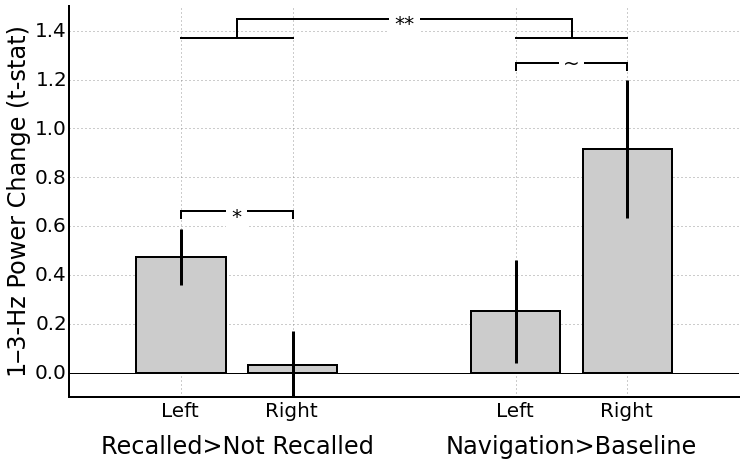

In [438]:
left_sme, right_sme, left_move, right_move = hipp_anova(sme_th, move, 1,3)
cond = [0,0,1,1]
hemi = [0,1,0,1]
ts = []
conds = []
hemis = []
interactions = []
for cond_hemi in zip([left_sme, right_sme, left_move, right_move], cond, hemi):
    for t in cond_hemi[0]:
        if ~np.isnan(t):
            ts.append(t)
            conds.append(cond_hemi[1])
            hemis.append(cond_hemi[2])    
df = pd.DataFrame(data=np.stack([ts,conds,hemis], axis=-1), columns=['t', 'cond', 'hemi']) 
formula = 't ~ C(cond) + C(hemi) + C(cond):C(hemi)'
lm = ols(formula, df).fit()
table = sm.stats.anova_lm(lm, typ=2)
print(table)
print(scipy.stats.ttest_ind(left_sme, right_sme, nan_policy='omit'))
print(scipy.stats.ttest_1samp(left_sme,0, nan_policy='omit'))
print(scipy.stats.ttest_1samp(right_sme,0, nan_policy='omit'))
print(scipy.stats.ttest_ind(left_move, right_move, nan_policy='omit'))
print(scipy.stats.ttest_1samp(left_move,0, nan_policy='omit'))
print(scipy.stats.ttest_1samp(right_move,0, nan_policy='omit'))

e = df.groupby(['hemi','cond']).sem().values[[0,2,1,3]] 
m = df.groupby(['hemi','cond']).mean().values[[0,2,1,3]]
# print(e)
# print(scipy.stats.sem(left_sme, nan_policy='omit')) * 1.96
fig, ax = plt.subplots()
ax.bar([1,2,4,5], m, yerr=e, color=[.8,.8,.8],
        align='center', zorder=1, lw=2,
        error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
plt.plot([0,6],[0,0],'-k',lw=1)

from matplotlib.markers import TICKDOWN
y=m+e+.07
plt.plot([1,2],[y[0]]*2,'-',color='k', lw=2,marker=TICKDOWN,
         markeredgewidth=2,markersize=8)
plt.text(0.5*(1+2),y[0]-.02,'*',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 20)

plt.plot([4,5],[y[3]]*2,'-',color='k', lw=2,marker=TICKDOWN,
         markeredgewidth=2,markersize=8)
plt.text(0.5*(4+5),y[3],u"~",ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size =20)

plt.plot([1.5,4.5],[1.45]*2,'-',color='k', lw=2,marker=TICKDOWN,
         markeredgewidth=2,markersize=20)
plt.plot([1,2],[1.37]*2,'-',color='k', lw=2,
         markeredgewidth=2,markersize=8)
plt.plot([4,5],[1.37]*2,'-',color='k', lw=2,
         markeredgewidth=2,markersize=8)
plt.text(0.5*(1+5),1.43,'**',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 20)

# props = {'connectionstyle':'bar','arrowstyle':'-','shrinkA':90,'shrinkB':90,'lw':3}
# y = .6
# ax.annotate('*', xy=(.5,.62), zorder=10, fontsize=25)
# ax.annotate('', xy=(0,y), xytext=(2,y), arrowprops=props)

# yerr=this_bar[1],align='center',
#                error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
ax.set_axisbelow(True)
ax.set_axis_bgcolor('w')
ax.grid(color=(.5,.5,.5))
#     ax2.grid()
ax.spines['left'].set_linewidth(2)    
ax.spines['bottom'].set_linewidth(2)  
ax.set_ylim(-0.1,1.5)
# ax2.set_yticklabels([])
# ax2.set_xticks([0,1])
# ax2.set_xticklabels(['Nav','Enc'], rotation=0)
# ax2.set_xlim(-0.5,1.5)
# ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)

plt.xticks([1,2,4,5], ['Left', 'Right', 'Left', 'Right'])
plt.text(1.5,-.3,u'Recalled>Not Recalled',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 24)

plt.text(4.5,-.3,'Navigation>Baseline',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 24)


# plt.grid()
plt.ylabel(u'1–3-Hz Power Change (t-stat)', fontdict={'fontsize': 24})
plt.xlabel('')
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/Hipp_MemNav.pdf') 

                    sum_sq  df         F    PR(>F)
C(cond)           1.313233   1  1.526670  0.219978
C(hemi)           0.390174   1  0.453589  0.502442
C(cond):C(hemi)   6.368506   1  7.403566  0.007877
Residual         73.976711  86       NaN       NaN
Ttest_indResult(statistic=2.2208368784532446, pvalue=0.031680551507121492)
Ttest_1sampResult(statistic=4.1914947065588715, pvalue=0.00032443189642536864)
Ttest_1sampResult(statistic=0.6473640598688627, pvalue=0.52514163499156685)
Ttest_indResult(statistic=-1.9125369448397422, pvalue=0.062483172573043907)
Ttest_1sampResult(statistic=1.207051233776429, pvalue=0.23917494843080511)
Ttest_1sampResult(statistic=3.2639719061622223, pvalue=0.0040834175589696941)


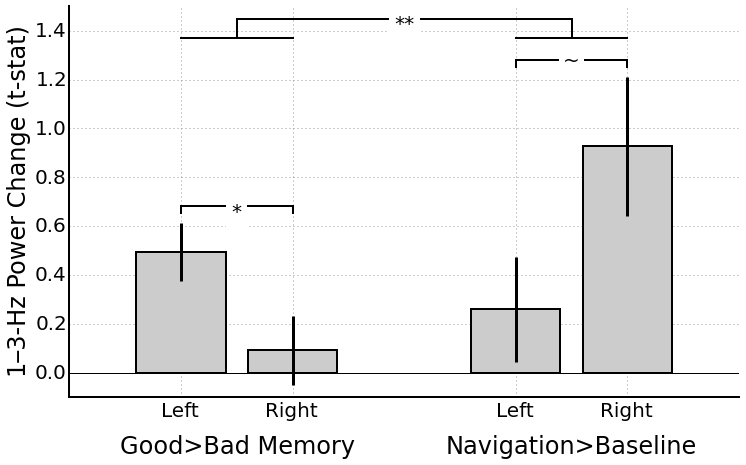

In [450]:
left_sme, right_sme, left_move, right_move = hipp_anova(sme_th, move, 1,3)
cond = [0,0,1,1]
hemi = [0,1,0,1]
ts = []
conds = []
hemis = []
interactions = []
for cond_hemi in zip([left_sme, right_sme, left_move, right_move], cond, hemi):
    for t in cond_hemi[0]:
        if ~np.isnan(t):
            ts.append(t)
            conds.append(cond_hemi[1])
            hemis.append(cond_hemi[2])    
df = pd.DataFrame(data=np.stack([ts,conds,hemis], axis=-1), columns=['t', 'cond', 'hemi']) 
formula = 't ~ C(cond) + C(hemi) + C(cond):C(hemi)'
lm = ols(formula, df).fit()
table = sm.stats.anova_lm(lm, typ=2)
print(table)
print(scipy.stats.ttest_ind(left_sme, right_sme, nan_policy='omit'))
print(scipy.stats.ttest_1samp(left_sme,0, nan_policy='omit'))
print(scipy.stats.ttest_1samp(right_sme,0, nan_policy='omit'))
print(scipy.stats.ttest_ind(left_move, right_move, nan_policy='omit'))
print(scipy.stats.ttest_1samp(left_move,0, nan_policy='omit'))
print(scipy.stats.ttest_1samp(right_move,0, nan_policy='omit'))

e = df.groupby(['hemi','cond']).sem().values[[0,2,1,3]] 
m = df.groupby(['hemi','cond']).mean().values[[0,2,1,3]]
# print(e)
# print(scipy.stats.sem(left_sme, nan_policy='omit')) * 1.96
fig, ax = plt.subplots()
ax.bar([1,2,4,5], m, yerr=e, color=[.8,.8,.8],
        align='center', zorder=1, lw=2,
        error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
plt.plot([0,6],[0,0],'-k',lw=1)

from matplotlib.markers import TICKDOWN
y=m+e+.07
plt.plot([1,2],[y[0]]*2,'-',color='k', lw=2,marker=TICKDOWN,
         markeredgewidth=2,markersize=8)
plt.text(0.5*(1+2),y[0]-.02,'*',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 20)

plt.plot([4,5],[y[3]]*2,'-',color='k', lw=2,marker=TICKDOWN,
         markeredgewidth=2,markersize=8)
plt.text(0.5*(4+5),y[3],u"~",ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size =20)

plt.plot([1.5,4.5],[1.45]*2,'-',color='k', lw=2,marker=TICKDOWN,
         markeredgewidth=2,markersize=20)
plt.plot([1,2],[1.37]*2,'-',color='k', lw=2,
         markeredgewidth=2,markersize=8)
plt.plot([4,5],[1.37]*2,'-',color='k', lw=2,
         markeredgewidth=2,markersize=8)
plt.text(0.5*(1+5),1.43,'**',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 20)

# props = {'connectionstyle':'bar','arrowstyle':'-','shrinkA':90,'shrinkB':90,'lw':3}
# y = .6
# ax.annotate('*', xy=(.5,.62), zorder=10, fontsize=25)
# ax.annotate('', xy=(0,y), xytext=(2,y), arrowprops=props)

# yerr=this_bar[1],align='center',
#                error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
ax.set_axisbelow(True)
ax.set_axis_bgcolor('w')
ax.grid(color=(.5,.5,.5))
#     ax2.grid()
ax.spines['left'].set_linewidth(2)    
ax.spines['bottom'].set_linewidth(2)  
ax.set_ylim(-0.1,1.5)
# ax2.set_yticklabels([])
# ax2.set_xticks([0,1])
# ax2.set_xticklabels(['Nav','Enc'], rotation=0)
# ax2.set_xlim(-0.5,1.5)
# ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)

plt.xticks([1,2,4,5], ['Left', 'Right', 'Left', 'Right'])
plt.text(1.5,-.3,u'Good>Bad Memory',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 24)

plt.text(4.5,-.3,'Navigation>Baseline',ha = 'center',
         va='center',
         bbox=dict(facecolor='1.', edgecolor='none',
                   boxstyle='Square,pad='+str(.3)),size = 24)


# plt.grid()
plt.ylabel(u'1–3-Hz Power Change (t-stat)', fontdict={'fontsize': 24})
plt.xlabel('')
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/Hipp_MemNav.pdf') 

In [462]:
stats.t.sf(1.9125369448397422, 43) * 2

0.06248317257304406

### Just Bilat subjects

                    sum_sq  df         F    PR(>F)
C(cond)           1.246510   1  1.474446  0.233531
C(hemi)           0.048751   1  0.057666  0.811755
C(cond):C(hemi)   0.963695   1  1.139915  0.293659
Residual         27.053096  32       NaN       NaN
Ttest_indResult(statistic=1.1766462982050188, pvalue=0.25654606057311297)
Ttest_relResult(statistic=1.215467980931934, pvalue=0.25883696490092334)
Ttest_1sampResult(statistic=2.2944727900274939, pvalue=0.050908175467012831)
Ttest_1sampResult(statistic=0.59102889641517975, pvalue=0.57081799006259237)


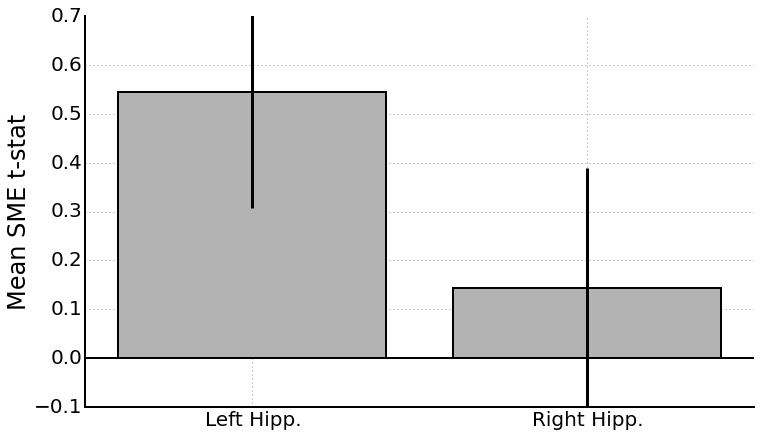

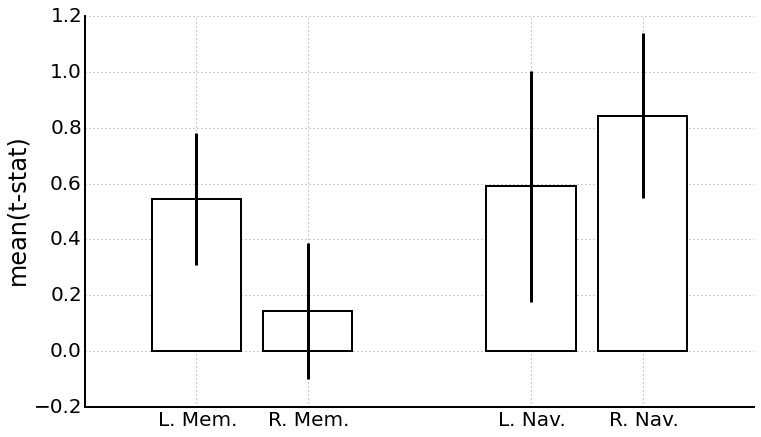

In [39]:
bilat=np.sum(~np.isnan(np.stack([left_sme,right_sme,left_move,right_move],axis=-1)),axis=1)==4
left_sme = left_sme[bilat]
right_sme = right_sme[bilat]
left_move = left_move[bilat]
right_move = right_move[bilat]
cond = [0,0,1,1]
hemi = [0,1,0,1]
ts = []
conds = []
hemis = []
interactions = []
for cond_hemi in zip([left_sme, right_sme, left_move, right_move], cond, hemi):
    for t in cond_hemi[0]:
        if ~np.isnan(t):
            ts.append(t)
            conds.append(cond_hemi[1])
            hemis.append(cond_hemi[2])    
df = pd.DataFrame(data=np.stack([ts,conds,hemis], axis=-1), columns=['t', 'cond', 'hemi']) 
formula = 't ~ C(cond) + C(hemi) + C(cond):C(hemi)'
lm = ols(formula, df).fit()
table = sm.stats.anova_lm(lm, typ=2)
print(table)

# sme_ts_left = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (~x.elec_locs['is_right'])], axis=0) for x in sme_th.subject_objs], axis=0) 
# sme_ts_right = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (x.elec_locs['is_right'])], axis=0) for x in sme_th.subject_objs], axis=0) 

print(scipy.stats.ttest_ind(left_sme, right_sme, nan_policy='omit'))
print(scipy.stats.ttest_rel(left_sme, right_sme, nan_policy='omit'))
print(scipy.stats.ttest_1samp(left_sme,0, nan_policy='omit'))
print(scipy.stats.ttest_1samp(right_sme,0, nan_policy='omit'))

e = df.groupby(['hemi','cond']).sem().values[[0,2,1,3]]
m = df.groupby(['hemi','cond']).mean().values[[0,2,1,3]]

fig, ax = plt.subplots()
ax.bar([1,2,4,5], m, yerr=e, color='w',
        align='center', zorder=1, lw=2,
        error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))

# yerr=this_bar[1],align='center',
#                error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
ax.set_axisbelow(True)
ax.set_axis_bgcolor('w')
ax.grid(color=(.5,.5,.5))
#     ax2.grid()
ax.spines['left'].set_linewidth(2)    
ax.spines['bottom'].set_linewidth(2)  
# ax2.set_yticklabels([])
# ax2.set_xticks([0,1])
# ax2.set_xticklabels(['Nav','Enc'], rotation=0)
# ax2.set_xlim(-0.5,1.5)
# ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)

plt.xticks([1,2,4,5], ['L. Mem.', 'R. Mem.', 'L. Nav.', 'R. Nav.'])
# plt.grid()
plt.ylabel('mean(t-stat)', fontdict={'fontsize': 24})
plt.xlabel('')

In [44]:
from scipy.stats import ttest_1samp, sem
def plot_tstat_sme(self, region=None, hemi='both'):
    """
    Plots mean t-statistics, across subjects, comparing remembered and not remembered items as a function of
    frequency.
    """

    regions = self.subject_objs[0].res['regions']
    if region is None:
        ts = np.stack([x.res['ts'].mean(axis=1) for x in self.subject_objs], axis=0)
        region = 'All'
    else:
        region_ind = regions == region
        if ~np.any(region_ind):
            print('Invalid region, please use: %s.' % ', '.join(regions))
            return
        if hemi=='both':
            ts = np.stack([x.res['ts_region'][:, region_ind].flatten() for x in self.subject_objs], axis=0)
        elif hemi=='l':
            ts = np.stack([np.nanmean(x.res['ts'][:,(x.elec_locs[region]) & (~x.elec_locs['is_right'])], axis=1) for
                           x in self.subject_objs], axis=0)   
        elif hemi=='r':
            ts = np.stack([np.nanmean(x.res['ts'][:,(x.elec_locs[region]) & (x.elec_locs['is_right'])], axis=1) for
                           x in self.subject_objs], axis=0) 
    
    t, p = ttest_1samp(ts, 0, axis=0, nan_policy='omit')

    y_mean = np.nanmean(ts, axis=0)
    y_sem = sem(ts, axis=0, nan_policy='omit') * 1.96

    x = np.log10(self.subject_objs[0].freqs)
    x_label = np.round(self.subject_objs[0].freqs * 10) / 10

    with plt.style.context('myplotstyle.mplstyle'):

        # fig, ax = plt.subplots()
        fig = plt.figure()
        ax = plt.subplot2grid((2, 5), (0, 0), colspan=5)
        ax.plot(x, y_mean, '-k', linewidth=4, zorder=6)
        ax.fill_between(x, y_mean - y_sem, y_mean + y_sem, facecolor=[.5, .5, .5, .5], edgecolor=[.5, .5, .5, .5], zorder=5)
        ax.plot([x[0], x[-1]], [0, 0], '-k', linewidth=2)

        new_x = self.compute_pow_two_series()
        ax.xaxis.set_ticks(np.log10(new_x))
        ax.xaxis.set_ticklabels(new_x, rotation=0)
        plt.ylim(-1, 1)

        ax.set_xlabel('Frequency', fontsize=24)
        ax.set_ylabel('Average t-stat', fontsize=24)

        # ax.fill_between(x, [0]*50, y_mean, where=(p<.05)&(t>0),facecolor='#8c564b', edgecolor='#8c564b')
        # ax.fill_between(x, [0]*50, y_mean, where=(p<.05)&(t<0),facecolor='#1f77b4', edgecolor='#1f77b4')

        plt.title('%s SME, N=%d' % (region, np.sum(~np.isnan(ts), axis=0)[0]))

## Figure 1: behavioral

In [75]:
# med_errs = behavioral.TH_beh_summary_plots.median_dist_err_by_subj(sme_th.subject_objs)
from scipy.stats import ttest_1samp
med_errs = np.zeros(len(sme_th.subject_objs))
med_errs[:] = np.nan

num_sess = np.zeros(len(sme_th.subject_objs))
num_sess[:] = np.nan

acc_by_conf_all = np.zeros((len(sme_th.subject_objs), 3), dtype=float)
acc_by_conf_all[:] = np.nan
perc_by_conf_all = np.zeros((len(sme_th.subject_objs), 3), dtype=float)
perc_by_conf_all[:] = np.nan

hist_by_conf_all = np.zeros((11, 3, len(sme_th.subject_objs)), dtype=float)
hist_by_conf_all[:] = np.nan

p_vals = np.zeros(len(sme_th.subject_objs))
p_vals[:] = np.nan
err_field = 'distErr'
err_field = 'norm_err'
for i, subj in enumerate(sme_th.subject_objs):
    subj.load_data()
    subj = subject_exclusions.remove_abridged_sessions(subj)
    med_errs[i] = np.mean(subj.subject_data.events.data[err_field])
    num_sess[i] = np.unique(subj.subject_data.events.data['session']).shape[0]
    t, p = ttest_1samp(subj.subject_data.events.data[err_field], .5)
    p_vals[i] = p
    for conf in xrange(3):
        acc_by_conf_all[i, conf] = np.mean(subj.subject_data.events.data[err_field][subj.subject_data.events.data['confidence'] == conf])
        perc_by_conf_all[i, conf] = np.mean(subj.subject_data.events.data['confidence'] == conf)
        [hist, b] = np.histogram(subj.subject_data.events.data[err_field][subj.subject_data.events.data['confidence'] == conf], bins=11, range=(0, 1))
        hist = hist / float(np.sum(hist))
        hist_by_conf_all[:, conf, i] = hist    
    subj.subject_data = None

R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1145J: Input data already exists, loading.
R1145J: Removing sessions  (0 of 1)
R1147P: Input data already exists, loading.
R1147P: Removing sessions  (0 of 1)
R1154D: Input data already exists, loading.
R1154D: Removing sessions  (0 of 4)
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 3)
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 1)
R1156D: Input data already exists, loading.
R1156D: Removing sessions  (0 of 1)
R1157C: Input data already exists, loading.
R1157C: Removing sessions  (0 of 3)
R1163T: Input data already exists, loading.
R1163T: Removing sessions  (0 of 2)
R1167M: Input data already exists, loading.
R1167M: Removing sessions  (0 of 2)
R1168T: Input data already exists, loadi

In [78]:
np.median(num_sess)

2.0

In [44]:
scipy.stats.sem(med_errs)

0.017153501611522577

In [45]:
1-np.mean(med_errs)

0.69513851399854698

In [152]:
x = 1-acc_by_conf_all
confs = np.array([[0,1,2]] * x.shape[0])
bad = np.any(np.isnan(x), axis=1)
x = x[~bad]
x[:,2]

array([ 0.86577078,  0.824707  ,  0.77279206,  0.70857792,  0.49053213,
        0.8231525 ,  0.84810467,  0.86670909,  0.80305863,  0.89908825,
        0.88006091,  0.88781903,  0.50782632,  0.5239128 ,  0.58282676,
        0.69682133,  0.75747699,  0.80118889,  0.88087545,  0.80612526,
        0.73629935,  0.94158157,  0.82625392,  0.72831727,  0.68721167,
        0.88134774,  0.59652667,  0.42272667,  0.98386   ,  0.80832702,
        0.45480846,  0.87975   ,  0.86955683,  0.72519731,  0.78048812,
        0.65982995,  0.61533375,  0.598284  ,  0.59190314,  0.59827259,
        0.93229359,  0.73450468,  0.92257929,  0.88010804,  0.95912697,
        0.88822522])

In [161]:
from scipy.stats import ttest_rel
ttest_rel(x[:,1],x[:,2])

Ttest_relResult(statistic=-4.5851365176355916, pvalue=3.6099685762904952e-05)

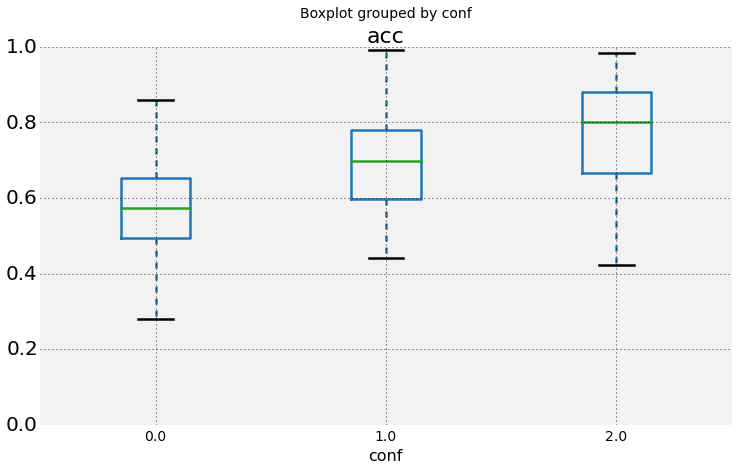

In [108]:
df.boxplot('acc', by='conf')

In [132]:
from scipy import stats

In [133]:
F, p = stats.f_oneway(df[df['conf']==0]['acc'],df[df['conf']==1]['acc'], df[df['conf']==2]['acc'])

In [134]:
F

18.348596003948689

In [135]:
p

8.9333401610209916e-08

In [142]:
x = 1-acc_by_conf_all
confs = np.array([[0,1,2]] * x.shape[0])
bad = np.any(np.isnan(x), axis=1)
x = x[~bad]
confs = confs[~bad]

data = np.stack([x.flatten(), confs.flatten()],-1)

df = pd.DataFrame(data=data, columns=['acc', 'conf']) 
formula = 'acc ~ conf'
lm = ols( 'acc ~ conf', data=df).fit()
table = sm.stats.anova_lm(lm, typ=2)
print(table)
# print(lm)


            sum_sq   df          F        PR(>F)
conf      0.796044    1  36.883396  1.181220e-08
Residual  2.935249  136        NaN           NaN


In [143]:
k = len(pd.unique(df.conf))  # number of conditions
N = len(df.values)  # conditions times participants
n = df.groupby('conf').size()[0] #Participants in each condition

In [147]:
DFbetween = k - 1
DFwithin = N - k
DFtotal = N - 1

In [151]:
DFwithin

135

## Behavioral figures using norm error (accuracy)

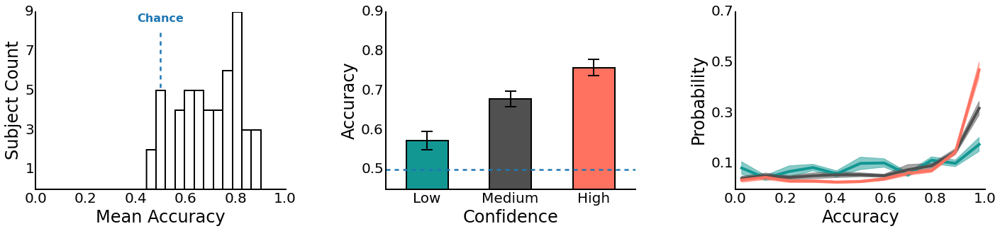

In [468]:
import scipy
fig, (ax1, ax2, ax3) = plt.subplots(1,3)
# _=plt.hist(med_errs,bins=16,  zorder=5, color='#1F77B4')
_=ax1.hist(1-med_errs,bins=12,  zorder=3, color='w', lw=2)
_=ax1.set_xlabel('Mean Accuracy',fontsize=24)
_=ax1.set_ylabel('Subject Count',fontsize=24)

# plt.ylim(0,7)
ax1.set_ylim(0,9)
ax1.set_yticks(ax1.get_yticks()[1::2])
# plt.yticks(range(8))
# ax1.set_xticks(range(0,40,5))
ax1.set_xlim(0,1)
# fig.set_size_inches(6,4.1)
ax1.set_axis_bgcolor('w')
ax1.spines['left'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.grid(color=(.5,.5,.5))
ax1.plot([.5, .5], [0,8], '--')
props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
ax1.text(.5, 8.5, 'Chance', horizontalalignment='center', fontsize=16, color='#1f77b4', weight='bold',
       family='sans-serif', bbox=None)
# plt.show()
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/MedDistHist.pdf') 


acc_mean = np.nanmean(1-acc_by_conf_all, axis=0)
perc_mean = np.nanmean(1-perc_by_conf_all, axis=0)
yerr=scipy.stats.sem(1-acc_by_conf_all, axis=0, nan_policy='omit')
colors  = np.array([[18., 151., 147.],[80., 80., 80.],[255., 114., 96.]])/255
# ax.grid()
ax2.set_axisbelow(True)
for conf in xrange(3):
    ax2.bar(conf,acc_mean[conf],.5,color=colors[conf],linewidth=2,yerr=yerr[conf], align='center',
          error_kw=dict(elinewidth=2, ecolor='k',capsize=8,capthick=2))
ax2.set_xlabel('Confidence',fontsize=24)
ax2.set_ylabel('Accuracy',fontsize=24)
ax2.set_xticks(range(3))
ax2.set_xticklabels(('Low', 'Medium','High'))
# plt.xticks(range(0,3), ('Low', 'Medium','High'),fontsize=14)
# plt.setp(ax.get_yticklabels(), fontsize=14)
# l=ax2.plot([-.5,2.5], [31.66329563018401, 31.66329563018401], '--')

# props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
# ax2.text(2.25, 32.8, 'Chance', horizontalalignment='center', fontsize=16, color='#1f77b4', weight='bold',
#        family='sans-serif', bbox=None)

ax2.set_ylim(.45,.9)
ax2.plot([-.5, 2.5], [.5,.5], '--')
ax2.set_yticks([.5, .6, .7, .8, .9])
# plt.xlim(-.5,2.5)
# fig.set_size_inches(6,4)
ax2.set_axis_bgcolor('w')
ax2.spines['left'].set_linewidth(2)
ax2.spines['bottom'].set_linewidth(2)
ax2.grid(color=(.5,.5,.5))

# print(l[0].get_color())
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/ErrByConfBar.pdf') 

# fig, ax = plt.subplots()
colors  = np.array([[18., 151., 147.],[80., 80., 80.],[255., 114., 96.]])/255
# ax.grid()
ax3.set_axisbelow(True)
ax3.set_xlabel('Accuracy',fontsize=24)
ax3.set_ylabel('Probability',fontsize=24)

hists = np.nanmean(hist_by_conf_all,axis=2)
yerr=scipy.stats.sem(hist_by_conf_all, axis=2, nan_policy='omit')
# bins=np.linspace(2.25,87.75,50)
bins=np.linspace(.025,.975,11)
colors  = np.array([[18., 151., 147.],[80., 80., 80.],[255., 114., 96.]])/255
hists = hists[::-1]
yerr = yerr[::-1]
for i in range(3):
    ax3.plot(bins,hists[:,i], linewidth=4, color=colors[i])
    ax3.fill_between(bins,hists[:,i]-yerr[:,i],hists[:,i]+yerr[:,i], color=colors[i], alpha=.5)
# plt.setp(ax.get_yticklabels(), fontsize=14)
# plt.setp(ax.get_xticklabels(), fontsize=14)
# ax3.set_ylim(0,.3)
# fig.set_size_inches(6,4.4)
ax3.set_axis_bgcolor('w')
ax3.spines['left'].set_linewidth(2)
ax3.spines['bottom'].set_linewidth(2)
ax3.grid(color=(.5,.5,.5))
ax3.set_yticks(ax3.get_yticks()[1::2])
ax3.set_xticks([0, .2, .4, .6, .8, 1])
# ax3.set_xticks(ax3.get_xticks()[0::2])
ax3.grid()
ax2.grid()
ax1.grid()

plt.setp(ax1.get_yticklabels(), fontsize=20)
plt.setp(ax1.get_xticklabels(), fontsize=20)
plt.setp(ax2.get_yticklabels(), fontsize=20)
plt.setp(ax2.get_xticklabels(), fontsize=20)
plt.setp(ax3.get_yticklabels(), fontsize=20)
plt.setp(ax3.get_xticklabels(), fontsize=20)

fig.subplots_adjust(wspace=.4)
# fig.tight_layout()
fig.set_size_inches(24,4.5)
plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/beh_all.pdf') 
# ax.invert_xaxis()
# plt.show()
# ax.set_axis_bgcolor('white')
# fig.set_facecolor('white')

## Using distance error

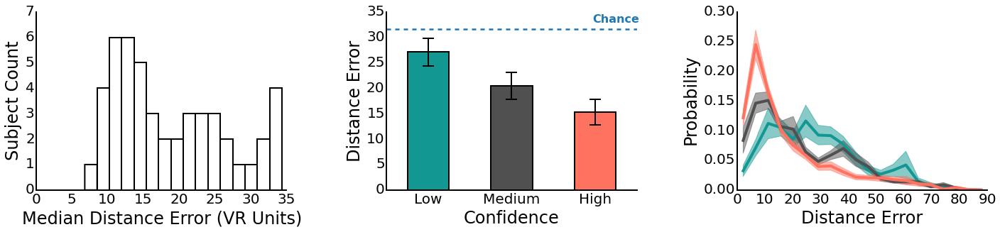

In [159]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3)
# _=plt.hist(med_errs,bins=16,  zorder=5, color='#1F77B4')
_=ax1.hist(med_errs,bins=16,  zorder=3, color='w', lw=2)
_=ax1.set_xlabel('Median Distance Error (VR Units)',fontsize=24)
_=ax1.set_ylabel('Subject Count',fontsize=24)

# plt.ylim(0,7)
ax1.set_ylim(0,7)
# plt.yticks(range(8))
ax1.set_xticks(range(0,40,5))
# plt.xlim(0,40)
# fig.set_size_inches(6,4.1)
ax1.set_axis_bgcolor('w')
ax1.spines['left'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.grid(color=(.5,.5,.5))
# plt.show()
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/MedDistHist.pdf') 


acc_mean = np.nanmean(acc_by_conf_all, axis=0)
perc_mean = np.nanmean(perc_by_conf_all, axis=0)
yerr=scipy.stats.sem(acc_by_conf_all, axis=0, nan_policy='omit') * 1.96
colors  = np.array([[18., 151., 147.],[80., 80., 80.],[255., 114., 96.]])/255
# ax.grid()
ax2.set_axisbelow(True)
for conf in xrange(3):
    ax2.bar(conf,acc_mean[conf],.5,color=colors[conf],linewidth=2,yerr=yerr[conf], align='center',
          error_kw=dict(elinewidth=2, ecolor='k',capsize=8,capthick=2))
ax2.set_xlabel('Confidence',fontsize=24)
ax2.set_ylabel('Distance Error',fontsize=24)
ax2.set_xticks(range(3))
ax2.set_xticklabels(('Low', 'Medium','High'))
# plt.xticks(range(0,3), ('Low', 'Medium','High'),fontsize=14)
# plt.setp(ax.get_yticklabels(), fontsize=14)
l=ax2.plot([-.5,2.5], [31.66329563018401, 31.66329563018401], '--')

props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
ax2.text(2.25, 32.8, 'Chance', horizontalalignment='center', fontsize=16, color='#1f77b4', weight='bold',
       family='sans-serif', bbox=None)

# plt.ylim(.5,.9)
# plt.xlim(-.5,2.5)
# fig.set_size_inches(6,4)
ax2.set_axis_bgcolor('w')
ax2.spines['left'].set_linewidth(2)
ax2.spines['bottom'].set_linewidth(2)
ax2.grid(color=(.5,.5,.5))
# print(l[0].get_color())
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/ErrByConfBar.pdf') 

# fig, ax = plt.subplots()
colors  = np.array([[18., 151., 147.],[80., 80., 80.],[255., 114., 96.]])/255
# ax.grid()
ax3.set_axisbelow(True)
ax3.set_xlabel('Distance Error',fontsize=24)
ax3.set_ylabel('Probability',fontsize=24)

hists = np.nanmean(hist_by_conf_all,axis=2)
yerr=scipy.stats.sem(hist_by_conf_all, axis=2, nan_policy='omit')
bins=np.linspace(2.25,87.75,20)
colors  = np.array([[18., 151., 147.],[80., 80., 80.],[255., 114., 96.]])/255
for i in range(3):
    ax3.plot(bins,hists[:,i], linewidth=4, color=colors[i])
    ax3.fill_between(bins,hists[:,i]-yerr[:,i],hists[:,i]+yerr[:,i], color=colors[i], alpha=.5)
# plt.setp(ax.get_yticklabels(), fontsize=14)
# plt.setp(ax.get_xticklabels(), fontsize=14)
ax3.set_ylim(0,.3)
# fig.set_size_inches(6,4.4)
ax3.set_axis_bgcolor('w')
ax3.spines['left'].set_linewidth(2)
ax3.spines['bottom'].set_linewidth(2)
ax3.grid(color=(.5,.5,.5))
ax3.grid()
ax2.grid()
ax1.grid()

plt.setp(ax1.get_yticklabels(), fontsize=20)
plt.setp(ax1.get_xticklabels(), fontsize=20)
plt.setp(ax2.get_yticklabels(), fontsize=20)
plt.setp(ax2.get_xticklabels(), fontsize=20)
plt.setp(ax3.get_yticklabels(), fontsize=20)
plt.setp(ax3.get_xticklabels(), fontsize=20)

fig.subplots_adjust(wspace=.4)
# fig.tight_layout()
fig.set_size_inches(24,4.5)
plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/beh_all.pdf') 
# ax.invert_xaxis()
# plt.show()
# ax.set_axis_bgcolor('white')
# fig.set_facecolor('white')

## Figure 2: electrode coverage

### 2A

In [8]:
%gui qt
brain_plots.coverage_brain(sme_th,
                          base_dir='/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels')

R1076D: finding valid vertices.
R1124J: finding valid vertices.
R1133C: finding valid vertices.
R1145J: finding valid vertices.
R1147P: finding valid vertices.
R1154D: finding valid vertices.
R1155D: finding valid vertices.
R1155D: finding valid vertices.
R1156D: finding valid vertices.
R1157C: finding valid vertices.
R1163T: finding valid vertices.
R1167M: finding valid vertices.
R1168T: finding valid vertices.
R1170J: finding valid vertices.
R1170J: finding valid vertices.
R1171M: finding valid vertices.
R1172E: finding valid vertices.
R1180C: finding valid vertices.
R1188C: finding valid vertices.
R1189M: finding valid vertices.
R1190P: finding valid vertices.
R1191J: finding valid vertices.
R1192C: finding valid vertices.
R1194E: finding valid vertices.
R1195E: finding valid vertices.
R1201P: finding valid vertices.
R1201P: finding valid vertices.
R1202M: finding valid vertices.
R1204T: finding valid vertices.
R1207J: finding valid vertices.
R1208C: finding valid vertices.
R1210E: 

/Users/jmiller/anaconda2/envs/brain/lib/python2.7/site-packages/mayavi/tools/camera.py:288: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Max subject count: 31


### 2B (maybe not included if not doing ROIs)

In [161]:
def count_subjs_and_elecs(subject_objs):
    
    regions = np.array(['IFG', 'MFG', 'SFG', 'MTL', 'Hipp', 'TC', 'IPC', 'SPC', 'OC'])
    elec_count = np.zeros((len(subject_objs), len(regions)), dtype=int)

    for i, subj in enumerate(subject_objs):
        elec_count[i] = [np.sum(subj.elec_locs[x]) for x in regions]
    return elec_count, regions

In [49]:
total_elecs = 0
for subj in sme_th.subject_objs:
    total_elecs += len(subj.elec_xyz_avg)
print(total_elecs)

5807


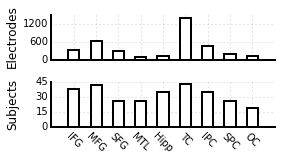

In [176]:
%matplotlib inline
elec_count, regions = count_subjs_and_elecs(sme_th.subject_objs)
f, ax = plt.subplots(2, sharex=True)
# _=ax[0].bar(np.arange(regions.shape[0]), elec_count.sum(axis=0), align='center', zorder=5,
#          color='#1F77B4', lw=1, width=.5)
_=ax[0].bar(np.arange(regions.shape[0]), elec_count.sum(axis=0), align='center', zorder=5,
         color='w', lw=2, width=.5)
ax[0].set_ylabel('Electrodes', fontsize=12)
ax[0].set_ylim(0,1500)
ax[0].set_yticks(ax[0].get_yticks()[::3])
ax[0].set_yticklabels(np.array(ax[0].get_yticks().astype(int)), fontsize=10)
# ax[0].set_xticks(range(len(regions)))
# ax[0].set_xticklabels(regions, fontsize=12)
ax[0].get_yaxis().set_label_coords(-0.14,0.5)

# _=ax[1].bar(np.arange(regions.shape[0]), np.sum(elec_count>0, axis=0), align='center', zorder=5,
#          color='#1F77B4', lw=1, width=.5)
_=ax[1].bar(np.arange(regions.shape[0]), np.sum(elec_count>0, axis=0), align='center', zorder=5,
         color='w', lw=2, width=.5)
ax[1].set_ylabel('Subjects', fontsize=12)
# ax[1].set_xlabel('Region', fontsize=12)
ax[1].set_yticks(ax[1].get_yticks()[::3])
ax[1].set_yticklabels(np.array(ax[1].get_yticks().astype(int)), fontsize=10)
# _=plt.xticks(np.arange(regions.shape[0]), regions, fontsize=12)
ax[1].set_xticks(range(len(regions)))
ax[1].set_xticklabels(regions, fontsize=10, rotation=-45)
ax[1].get_yaxis().set_label_coords(-0.14,0.5)
f.set_size_inches(4,2)
f.subplots_adjust(hspace=.5)

for this_ax in ax:
    this_ax.set_axis_bgcolor('w')
    this_ax.spines['left'].set_linewidth(2)
    this_ax.spines['bottom'].set_linewidth(2)
    this_ax.grid(color=(.5,.5,.5))
    this_ax.set_axisbelow(True)
    this_ax.grid(color=(.5,.5,.5), linestyle=':', lw=.5)
#     this_ax.grid()

plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/ElecBar.pdf')

## Figure 3: SME Freq x Region and Brain plots (maybe not Freq x Region)

### mean t-stat version

Ttest_1sampResult(statistic=masked_array(data = [4.1914947065588715 0.6473640598688627],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [  3.24431896e-04   5.25141635e-01],
             mask = False,
       fill_value = 1e+20)
)
Ttest_1sampResult(statistic=masked_array(data = [0.8867747040553853 -0.674922824232972],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.38400039  0.50785542],
             mask = False,
       fill_value = 1e+20)
)
Ttest_1sampResult(statistic=masked_array(data = [-2.0633352575740895 -0.4278701441804635],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.05005773  0.67355624],
             mask = False,
       fill_value = 1e+20)
)


/Users/jmiller/anaconda2/envs/brain/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



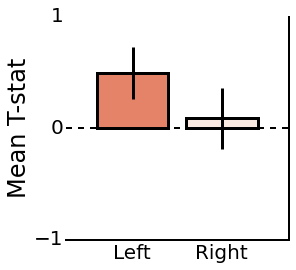

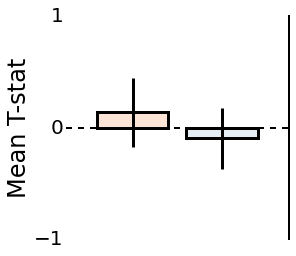

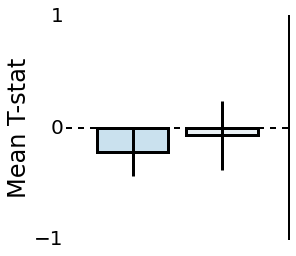

In [13]:
%matplotlib inline
from scipy.stats import ttest_1samp
bins = [[1,3],[3,10],[40,100]]
names = ['hipp_norm_low_theta', 'hipp_norm_high_theta', 'hipp_norm_hfa']
plot_labels = [True, False, False]
for fig_info in zip(bins,names, plot_labels):
    lf = fig_info[0][0]
    hf = fig_info[0][1]
    name = fig_info[1]
    plot_label = fig_info[2]
    plot_region_bilat_bar(sme_th,lf,hf,'Hipp','ts', plot_label)
#     plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/%s.pdf' % name)

In [11]:
import matplotlib.cm as cmx
import matplotlib.colors as clrs
def plot_region_bilat_bar(sme, lf, hf, region, plot_res_key='ts', plot_label=True):
    freqs_inds = (sme.subject_objs[0].freqs >= lf) & (sme.subject_objs[0].freqs <= hf)
    left = np.stack([np.nanmean(x.res[plot_res_key][freqs_inds].mean(axis=0)[(x.elec_locs[region]) & (~x.elec_locs['is_right'])]) for
                     x in sme.subject_objs], axis=0)
    right = np.stack([np.nanmean(x.res[plot_res_key][freqs_inds].mean(axis=0)[(x.elec_locs[region]) & (x.elec_locs['is_right'])]) for
                     x in sme.subject_objs], axis=0)
    res = ttest_1samp([left, right], 0, axis=1, nan_policy='omit')
    print(res)
    fig, ax = plt.subplots(1,1)
    yerr=scipy.stats.sem([left,right], axis=1, nan_policy='omit')*1.96
#     ax.set_ylabel('Mean T-stat', fontdict={'fontsize': 24})
#         ax2.bar(conf,acc_mean[conf],.5,color=colors[conf],linewidth=2,yerr=yerr[conf], align='center',
#           error_kw=dict(elinewidth=2, ecolor='k',capsize=8,capthick=2))
    ax.set_axisbelow(True)
    ax.set_axis_bgcolor('w')
    ax.grid(color=(.5,.5,.5))
    ax.grid()
    ax.set_ylim(-1,1)
    ax.set_xlim(.25,2.75)
    ax.set_xticks([1,2])
    ax.spines['right'].set_linewidth(2)    
    ax.set_yticks([-1,0,1])    
#     ax.set_xticklabels(['Left','Right'])
    if plot_label:
        ax.set_yticks([-1,0,1])
#         ax.spines['left'].set_linewidth(2)
        ax.spines['bottom'].set_linewidth(2)
        ax.set_ylabel('Mean T-stat', fontdict={'fontsize': 24})
        ax.set_xticklabels(['Left','Right'])
    else:
#         ax.set_yticks([])
#         ax.spines['left'].set_linewidth(2)        
        ax.set_xticklabels(['',''])
        ax.set_ylabel('Mean T-stat', fontdict={'fontsize': 24})

    cm = plt.get_cmap('RdBu_r')
    cNorm = clrs.Normalize(vmin=-1, vmax=1)
    scalarmap = cmx.ScalarMappable(norm=cNorm, cmap=cm)
#         colors = scalarmap.to_rgba(sme_by_elec) * 255
    for i, this_bar in enumerate(zip([np.nanmean(left), np.nanmean(right)], yerr)):
#         print this_bar[0]
        
        color = scalarmap.to_rgba(this_bar[0])
#         print color
        ax.bar(i+1, this_bar[0], zorder=1, color=color,linewidth=3,
               yerr=this_bar[1],align='center',
               error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
    ax.plot([.25,2.75],[0,0],'--k',lw=2)
    fig.set_size_inches(4,4)
    
    

### Group t-stat version

In [428]:
np.logspace(np.log10(1), np.log10(200), 50)

array([   1.        ,    1.11419138,    1.24142244,    1.38318219,
          1.54112968,    1.71711341,    1.91319296,    2.13166312,
          2.37508068,    2.64629443,    2.94847845,    3.28516929,
          3.66030732,    4.07828288,    4.54398764,    5.06287188,
          5.64100823,    6.28516277,    7.0028742 ,    7.8025421 ,
          8.69352518,    9.68625086,   10.79233725,   12.02472918,
         13.39784965,   14.92776865,   16.63239121,   18.53166699,
         20.64782369,   23.00562726,   25.63267168,   28.55970194,
         31.82097384,   35.45465489,   39.50327101,   44.01420421,
         49.04024711,   54.64022081,   60.87966325,   67.83159627,
         75.57738014,   84.20766579,   93.82345571,  104.53728599,
        116.47454337,  129.7749327 ,  144.5941119 ,  161.10551369,
        179.5023753 ,  200.        ])

Ttest_1sampResult(statistic=masked_array(data = [4.1914947065588715 0.6473640598688627],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [  3.24431896e-04   5.25141635e-01],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20
Ttest_1sampResult(statistic=masked_array(data = [0.8867747040553853 -0.674922824232972],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.38400039  0.50785542],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20
Ttest_1sampResult(statistic=masked_array(data = [-2.0633352575740895 -0.4278701441804635],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.05005773  0.67355624],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20


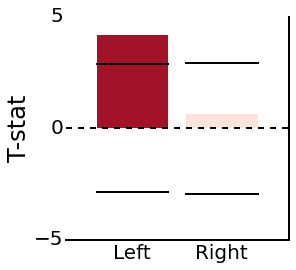

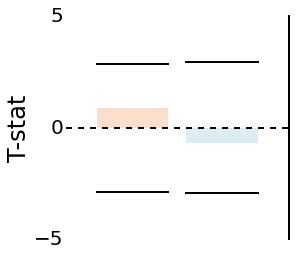

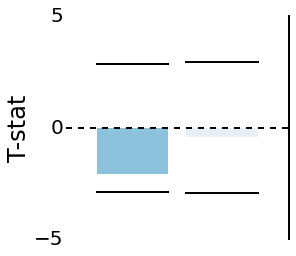

In [57]:
import scipy
from scipy.stats import ttest_1samp
bins = [[1,3],[3,10],[40,100]]
names = ['hipp_norm_low_theta', 'hipp_norm_high_theta', 'hipp_norm_hfa']
plot_labels = [True, False, False]
for fig_info in zip(bins,names, plot_labels):
    lf = fig_info[0][0]
    hf = fig_info[0][1]
    name = fig_info[1]
    plot_label = fig_info[2]
    plot_region_bilat_bar_t(sme_th,lf,hf,'Hipp','ts', plot_label)
    plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/%s.pdf' % name)

In [80]:
import matplotlib.cm as cmx
import pdb
import matplotlib.colors as clrs
def plot_region_bilat_bar_t(sme, lf, hf, region, plot_res_key='ts', plot_label=True):
    freqs_inds = (sme.subject_objs[0].freqs >= lf) & (sme.subject_objs[0].freqs <= hf)
    left = np.stack([np.nanmean(x.res[plot_res_key][freqs_inds].mean(axis=0)[(x.elec_locs[region]) & (~x.elec_locs['is_right'])]) for
                     x in sme.subject_objs], axis=0)
    right = np.stack([np.nanmean(x.res[plot_res_key][freqs_inds].mean(axis=0)[(x.elec_locs[region]) & (x.elec_locs['is_right'])]) for
                     x in sme.subject_objs], axis=0)
    res = ttest_1samp([left, right], 0, axis=1, nan_policy='omit')
    print(res)
#     pdb.set_trace()
    left_crit_t = scipy.stats.t.ppf(.05/12, np.sum(~np.isnan(left)))
    right_crit_t = scipy.stats.t.ppf(.05/12, np.sum(~np.isnan(right)))    
    print(left_crit_t)
    print(np.sum(~np.isnan(left)))
    print(right_crit_t)    
    print(np.sum(~np.isnan(right)))    
#     (scipy.stats.t.sf(1.98,100) < .05/6) or (scipy.stats.t.sf(1.98,100) > (1- .05/6))
    fig, ax = plt.subplots(1,1)

    ax.set_axisbelow(True)
    ax.set_axis_bgcolor('w')
    ax.grid(color=(.5,.5,.5))
    ax.grid()
    ax.set_ylim(-5,5)
    ax.set_xlim(.25,2.75)
    ax.set_xticks([1,2])
    ax.spines['right'].set_linewidth(2)    
    ax.set_yticks([-5,0,5])    

    if plot_label:
        ax.set_yticks([-5,0,5])
        ax.spines['bottom'].set_linewidth(2)
        ax.set_ylabel('T-stat', fontdict={'fontsize': 24})
        ax.set_xticklabels(['Left','Right'])
    else:       
        ax.set_xticklabels(['',''])
        ax.set_ylabel('T-stat', fontdict={'fontsize': 24})

    cm = plt.get_cmap('RdBu_r')
    cNorm = clrs.Normalize(vmin=-5, vmax=5)
    scalarmap = cmx.ScalarMappable(norm=cNorm, cmap=cm)
#         colors = scalarmap.to_rgba(sme_by_elec) * 255

    for i, this_bar in enumerate(zip(res[0], [left_crit_t, right_crit_t])):
        color = scalarmap.to_rgba(this_bar[0])
        ax.bar(i+1, this_bar[0], zorder=1, color=color,linewidth=0,align='center')
        ax.plot([i+.6, i+1.4], [this_bar[1], this_bar[1]], '-', color=[0,0,0], lw=2)
        ax.plot([i+.6, i+1.4], [-this_bar[1], -this_bar[1]],'-', color=[0,0,0], lw=2)        
    ax.plot([.25,2.75],[0,0],'--k',lw=2)
    fig.set_size_inches(4,4)
    
    

### calculating chance distance error

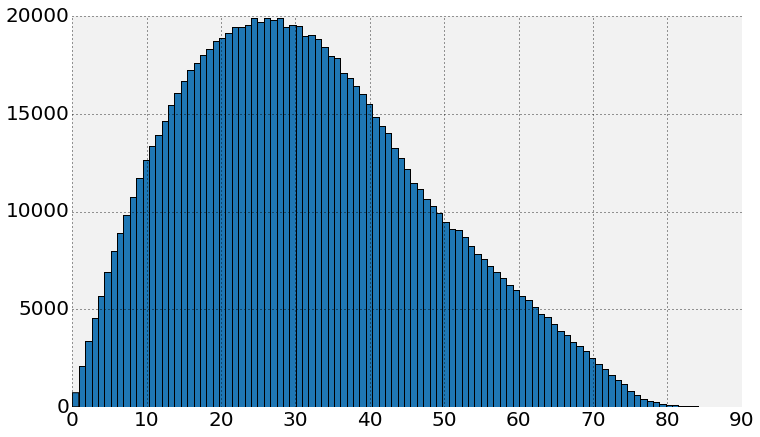

In [47]:
x1 = np.random.uniform(0,44,(1000000,2))
y1 = np.random.uniform(0,75.3,(1000000,2))
loc1 = np.stack([x1[:,0],y1[:,0]],-1)
loc2 = np.stack([x1[:,1],y1[:,1]],-1)
np.median(np.linalg.norm(loc1-loc2,axis=1))
_=plt.hist(np.linalg.norm(loc1-loc2,axis=1),bins=100)

In [262]:
reload(brain_plots)

<module 'Projects.TH_SME_Paper.brain_plots' from '/Users/jmiller/python/RAM_classify/Projects/TH_SME_Paper/brain_plots.py'>

### Brain Plots

In [14]:
%gui qt
inds = np.where((sme_th.subject_objs[0].freqs >= 1) & (sme_th.subject_objs[0].freqs <=3))[0]
brain_plots.sme_brain(sme_th, inds, res_key='ts', file_ext='low_theta_norm2', 
                      base_dir='/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels')
                      

R1076D: finding valid vertices.
R1124J: finding valid vertices.
R1133C: finding valid vertices.
R1145J: finding valid vertices.
R1147P: finding valid vertices.
R1154D: finding valid vertices.
R1155D: finding valid vertices.
R1155D: finding valid vertices.
R1156D: finding valid vertices.
R1157C: finding valid vertices.
R1163T: finding valid vertices.
R1167M: finding valid vertices.
R1168T: finding valid vertices.
R1170J: finding valid vertices.
R1170J: finding valid vertices.
R1171M: finding valid vertices.
R1172E: finding valid vertices.
R1180C: finding valid vertices.
R1188C: finding valid vertices.
R1189M: finding valid vertices.
R1190P: finding valid vertices.
R1191J: finding valid vertices.
R1192C: finding valid vertices.
R1194E: finding valid vertices.
R1195E: finding valid vertices.
R1201P: finding valid vertices.
R1201P: finding valid vertices.
R1202M: finding valid vertices.
R1204T: finding valid vertices.
R1207J: finding valid vertices.
R1208C: finding valid vertices.
R1210E: 

In [15]:
%gui qt
inds = np.where((sme_th.subject_objs[0].freqs >= 3) & (sme_th.subject_objs[0].freqs <=10))[0]
brain_plots.sme_brain(sme_th, inds, res_key='ts', file_ext='high_theta_norm2', 
                      base_dir='/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels')
                      

R1076D: finding valid vertices.
R1124J: finding valid vertices.
R1133C: finding valid vertices.
R1145J: finding valid vertices.
R1147P: finding valid vertices.
R1154D: finding valid vertices.
R1155D: finding valid vertices.
R1155D: finding valid vertices.
R1156D: finding valid vertices.
R1157C: finding valid vertices.
R1163T: finding valid vertices.
R1167M: finding valid vertices.
R1168T: finding valid vertices.
R1170J: finding valid vertices.
R1170J: finding valid vertices.
R1171M: finding valid vertices.
R1172E: finding valid vertices.
R1180C: finding valid vertices.
R1188C: finding valid vertices.
R1189M: finding valid vertices.
R1190P: finding valid vertices.
R1191J: finding valid vertices.
R1192C: finding valid vertices.
R1194E: finding valid vertices.
R1195E: finding valid vertices.
R1201P: finding valid vertices.
R1201P: finding valid vertices.
R1202M: finding valid vertices.
R1204T: finding valid vertices.
R1207J: finding valid vertices.
R1208C: finding valid vertices.
R1210E: 

In [16]:
hfa_inds = np.where((sme_th.subject_objs[0].freqs >= 40) & (sme_th.subject_objs[0].freqs <=100))[0]
brain_plots.sme_brain(sme_th, hfa_inds, res_key='ts', file_ext='hfa_norm',
                      base_dir='/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels')

R1076D: finding valid vertices.
R1124J: finding valid vertices.
R1133C: finding valid vertices.
R1145J: finding valid vertices.
R1147P: finding valid vertices.
R1154D: finding valid vertices.
R1155D: finding valid vertices.
R1155D: finding valid vertices.
R1156D: finding valid vertices.
R1157C: finding valid vertices.
R1163T: finding valid vertices.
R1167M: finding valid vertices.
R1168T: finding valid vertices.
R1170J: finding valid vertices.
R1170J: finding valid vertices.
R1171M: finding valid vertices.
R1172E: finding valid vertices.
R1180C: finding valid vertices.
R1188C: finding valid vertices.
R1189M: finding valid vertices.
R1190P: finding valid vertices.
R1191J: finding valid vertices.
R1192C: finding valid vertices.
R1194E: finding valid vertices.
R1195E: finding valid vertices.
R1201P: finding valid vertices.
R1201P: finding valid vertices.
R1202M: finding valid vertices.
R1204T: finding valid vertices.
R1207J: finding valid vertices.
R1208C: finding valid vertices.
R1210E: 

## Figure 4: TxF

In [64]:
starts = np.arange(-1.5, 2.0 - 0.5 + 0.01, 0.01)
ends = starts + 0.5
time_bins = np.stack([starts, ends], axis=-1)

In [65]:
sme_th_tbins = group_SME_timebins.GroupSMETimebins(load_data_if_file_exists=True, 
                                             subject_settings='default_50_freqs_timebins',
                                             load_res_if_file_exists=True, bipolar=True,
                                                   use_json=True,
                                             base_dir='/Users/jmiller/data/python',
                                             do_not_compute=True, subjs=th_subjs,
                                            save_res=True, time_bins=time_bins,
                                                  recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
sme_th_tbins.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: loading results.
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading results.
R1189M: loading results.
R1190P: loading results.
R1191J: loading results.
R1192C: loading results.
R1194E: loading results.
R1195E: loading results.
R1198M: No results to load.
R1198M: Input data a

stat_fun(H1): min=-4.107966 max=3.820352
Running initial clustering
Found 17 clusters
Permuting ...
[....................................... ] 99.20000 \    Computing cluster p-values
Done.


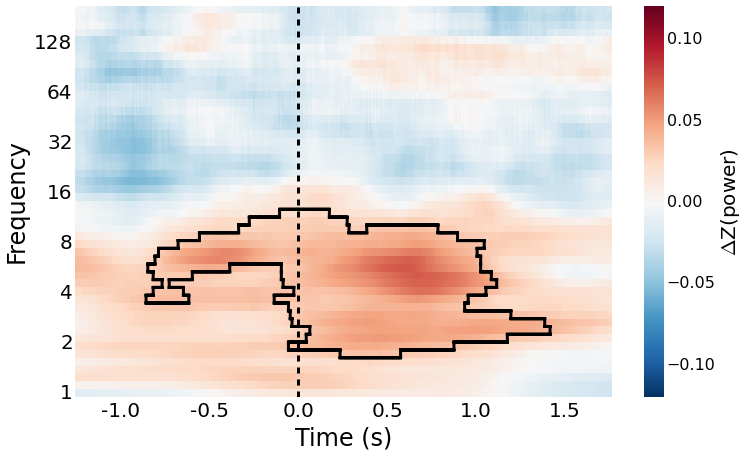

In [15]:
fig,ax,cb=sme_th_tbins.plot_feature_map(region='TC', plot_res_key='zs', alpha=0,
                                        cb_label=r'$\Delta$ Z(Power)', clim=.12,
                                       do_perm=True, hemi='l')
cb.set_ticks([-.15, -.1, -.05, 0, .05, .1, .15])
cb.ax.tick_params(labelsize=16)
cb.solids.set_rasterized(True)
cb.solids.set_edgecolor("face")
cb.set_label(label='$\Delta$Z(power)', size=20) 
stop = np.floor(sme_th_tbins.subject_objs[0].res['time_bins'][-1] * 100 / 50) * .5
start = np.ceil(sme_th_tbins.subject_objs[0].res['time_bins'][0] * 100 / 50) * .5
x_inds = np.arange(start, stop + .1, .5)
new_x = np.interp(x_inds, sme_th_tbins.subject_objs[0].res['time_bins'],
                  range(sme_th_tbins.subject_objs[0].res['time_bins'].shape[0]))
_ = plt.xticks(new_x, np.arange(start, stop + .1, .5), fontsize=20, rotation=0)
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/TxF_TC.pdf')

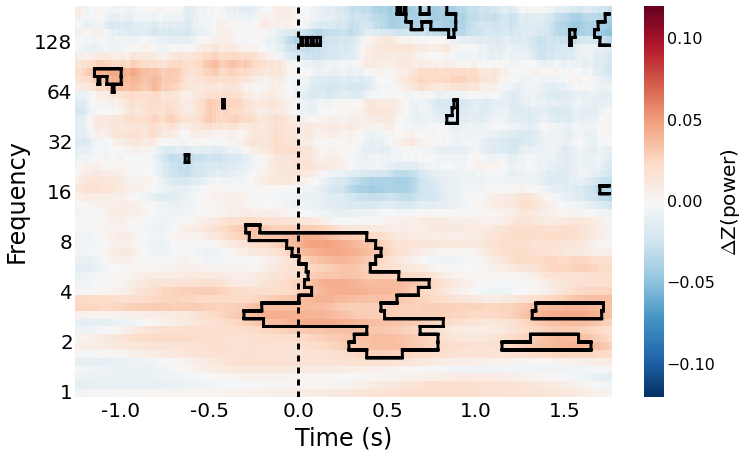

In [17]:
fig,ax,cb=sme_th_tbins.plot_feature_map(region='TC', plot_res_key='zs', alpha=0,
                                        cb_label=r'$\Delta$ Z(Power)', clim=.12,
                                       do_perm=False, hemi='r')
cb.set_ticks([-.15, -.1, -.05, 0, .05, .1, .15])
cb.ax.tick_params(labelsize=16)
cb.solids.set_rasterized(True)
cb.solids.set_edgecolor("face")
cb.set_label(label='$\Delta$Z(power)', size=20) 
stop = np.floor(sme_th_tbins.subject_objs[0].res['time_bins'][-1] * 100 / 50) * .5
start = np.ceil(sme_th_tbins.subject_objs[0].res['time_bins'][0] * 100 / 50) * .5
x_inds = np.arange(start, stop + .1, .5)
new_x = np.interp(x_inds, sme_th_tbins.subject_objs[0].res['time_bins'],
                  range(sme_th_tbins.subject_objs[0].res['time_bins'].shape[0]))
_ = plt.xticks(new_x, np.arange(start, stop + .1, .5), fontsize=20, rotation=0)
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/TxF_TC.pdf')

stat_fun(H1): min=-3.304704 max=4.500283
Running initial clustering
Found 16 clusters
Permuting ...
[....................................... ] 99.20000 \    Computing cluster p-values
Done.


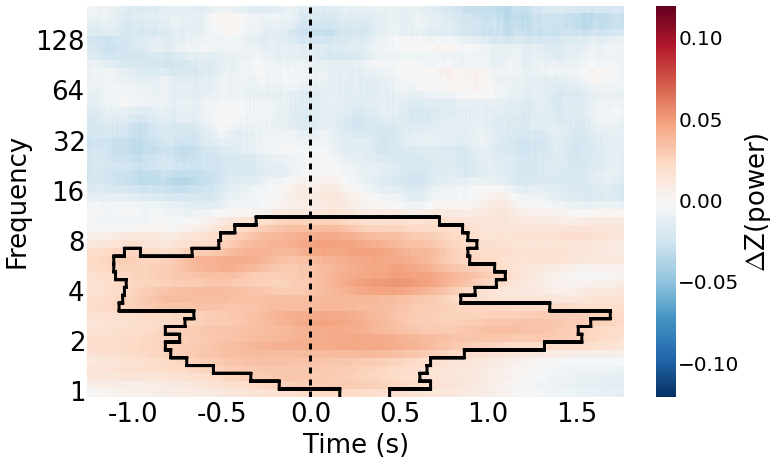

In [73]:
fig,ax,cb=sme_th_tbins.plot_feature_map(region='TC', plot_res_key='zs', alpha=0,
                                        cb_label=r'$\Delta$ Z(Power)', clim=.12,
                                       do_perm=True)
cb.set_ticks([-.15, -.1, -.05, 0, .05, .1, .15])
cb.ax.tick_params(labelsize=20)
cb.solids.set_rasterized(True)
cb.solids.set_edgecolor("face")
cb.set_label(label='$\Delta$Z(power)', size=26) 
stop = np.floor(sme_th_tbins.subject_objs[0].res['time_bins'][-1] * 100 / 50) * .5
start = np.ceil(sme_th_tbins.subject_objs[0].res['time_bins'][0] * 100 / 50) * .5
x_inds = np.arange(start, stop + .1, .5)
new_x = np.interp(x_inds, sme_th_tbins.subject_objs[0].res['time_bins'],
                  range(sme_th_tbins.subject_objs[0].res['time_bins'].shape[0]))
_ = plt.xticks(new_x, np.arange(start, stop + .1, .5), fontsize=26, rotation=0)
_ = plt.yticks(fontsize=26)
_= plt.xlabel('Time (s)', fontsize=26)
_= plt.ylabel('Frequency', fontsize=26)
plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/TxF_TC.pdf')

stat_fun(H1): min=-4.125312 max=3.757343
Running initial clustering
Found 36 clusters
Permuting ...
[....................................... ] 99.20000 \    Computing cluster p-values
Done.


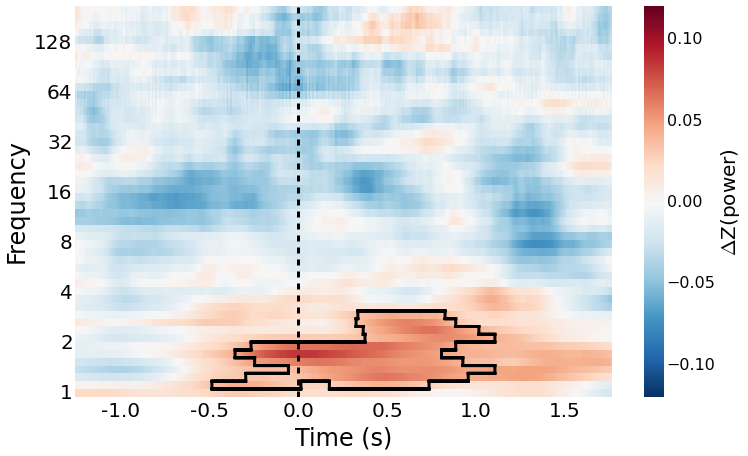

In [40]:
fig,ax,cb=sme_th_tbins.plot_feature_map(region='Hipp', plot_res_key='zs', alpha=0,
                                        cb_label=r'$\Delta$ Z(Power)', clim=.12,
                                       do_perm=True)
cb.set_ticks([-.15, -.1, -.05, 0, .05, .1, .15])
cb.ax.tick_params(labelsize=16)
cb.solids.set_rasterized(True)
cb.solids.set_edgecolor("face")
cb.set_label(label='$\Delta$Z(power)', size=20) 
stop = np.floor(sme_th_tbins.subject_objs[0].res['time_bins'][-1] * 100 / 50) * .5
start = np.ceil(sme_th_tbins.subject_objs[0].res['time_bins'][0] * 100 / 50) * .5
x_inds = np.arange(start, stop + .1, .5)
new_x = np.interp(x_inds, sme_th_tbins.subject_objs[0].res['time_bins'],
                  range(sme_th_tbins.subject_objs[0].res['time_bins'].shape[0]))
_ = plt.xticks(new_x, np.arange(start, stop + .1, .5), fontsize=20, rotation=0)
plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/TxF_Hipp.pdf')

stat_fun(H1): min=-3.932710 max=5.312820
Running initial clustering
Found 26 clusters
Permuting ...
[....................................... ] 99.20000 \    Computing cluster p-values
Done.


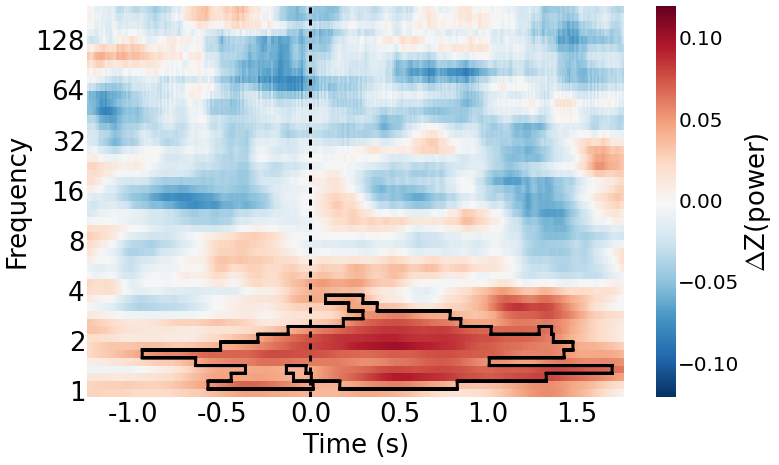

In [71]:
fig,ax,cb=sme_th_tbins.plot_feature_map(region='Hipp', plot_res_key='zs', alpha=0,
                                        cb_label=r'$\Delta$ Z(Power)', clim=.12,
                                       do_perm=True, hemi='l')
cb.set_ticks([-.15, -.1, -.05, 0, .05, .1, .15])
cb.ax.tick_params(labelsize=20)
cb.solids.set_rasterized(True)
cb.solids.set_edgecolor("face")
cb.set_label(label='$\Delta$Z(power)', size=26) 
stop = np.floor(sme_th_tbins.subject_objs[0].res['time_bins'][-1] * 100 / 50) * .5
start = np.ceil(sme_th_tbins.subject_objs[0].res['time_bins'][0] * 100 / 50) * .5
x_inds = np.arange(start, stop + .1, .5)
new_x = np.interp(x_inds, sme_th_tbins.subject_objs[0].res['time_bins'],
                  range(sme_th_tbins.subject_objs[0].res['time_bins'].shape[0]))
_ = plt.xticks(new_x, np.arange(start, stop + .1, .5), fontsize=26, rotation=0)
_ = plt.yticks(fontsize=26)
_= plt.xlabel('Time (s)', fontsize=26)
_= plt.ylabel('Frequency', fontsize=26)
plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/TxF_lHipp.pdf')

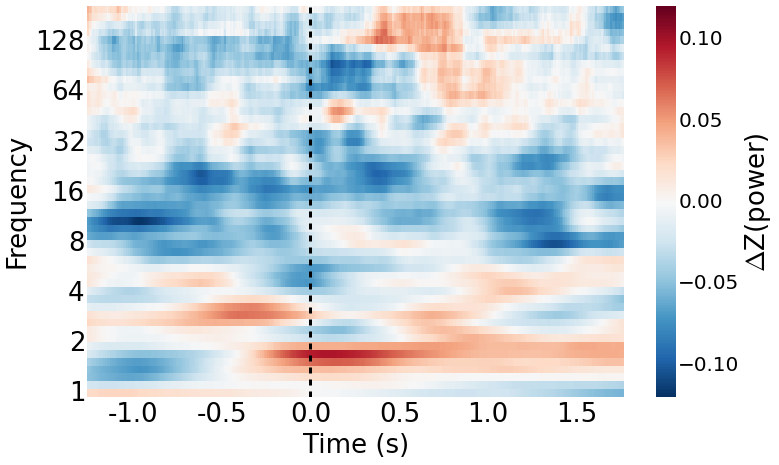

In [72]:
fig,ax,cb=sme_th_tbins.plot_feature_map(region='Hipp', plot_res_key='zs', alpha=0,
                                        cb_label=r'$\Delta$ Z(Power)', clim=.12,
                                       do_perm=False, hemi='r', do_outline=False)
cb.set_ticks([-.15, -.1, -.05, 0, .05, .1, .15])
cb.ax.tick_params(labelsize=20)
cb.solids.set_rasterized(True)
cb.solids.set_edgecolor("face")
cb.set_label(label='$\Delta$Z(power)', size=26) 
stop = np.floor(sme_th_tbins.subject_objs[0].res['time_bins'][-1] * 100 / 50) * .5
start = np.ceil(sme_th_tbins.subject_objs[0].res['time_bins'][0] * 100 / 50) * .5
x_inds = np.arange(start, stop + .1, .5)
new_x = np.interp(x_inds, sme_th_tbins.subject_objs[0].res['time_bins'],
                  range(sme_th_tbins.subject_objs[0].res['time_bins'].shape[0]))
_ = plt.xticks(new_x, np.arange(start, stop + .1, .5), fontsize=26, rotation=0)
_ = plt.yticks(fontsize=26)
_= plt.xlabel('Time (s)', fontsize=26)
_= plt.ylabel('Frequency', fontsize=26)
plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/TxF_rHipp.pdf')

stat_fun(H1): min=-4.141717 max=3.607703
Running initial clustering
Found 21 clusters
Permuting ...
[....................................... ] 99.20000 \    Computing cluster p-values
Done.


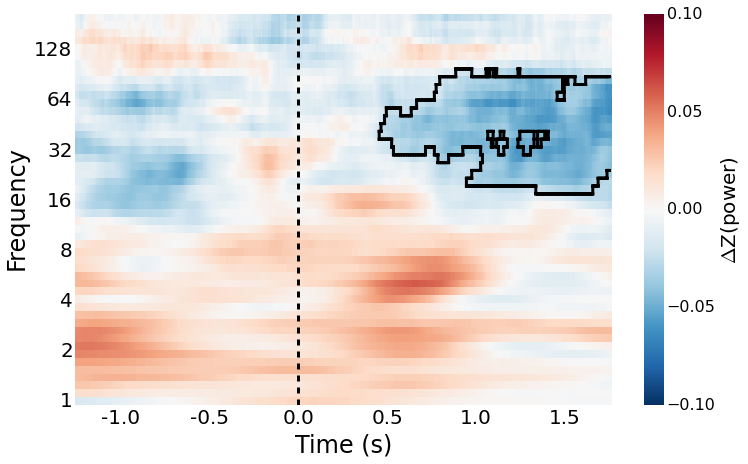

In [28]:
fig,ax,cb=sme_th_tbins.plot_feature_map(region='FC', plot_res_key='zs', alpha=0,
                                        cb_label=r'$\Delta$ Z(Power)', clim=.1,
                                       hemi='l', do_perm=True)
cb.set_ticks([-.15, -.1, -.05, 0, .05, .1, .15])
cb.ax.tick_params(labelsize=16)
cb.solids.set_rasterized(True)
cb.solids.set_edgecolor("face")
cb.set_label(label='$\Delta$Z(power)', size=20) 
stop = np.floor(sme_th_tbins.subject_objs[0].res['time_bins'][-1] * 100 / 50) * .5
start = np.ceil(sme_th_tbins.subject_objs[0].res['time_bins'][0] * 100 / 50) * .5
x_inds = np.arange(start, stop + .1, .5)
new_x = np.interp(x_inds, sme_th_tbins.subject_objs[0].res['time_bins'],
                  range(sme_th_tbins.subject_objs[0].res['time_bins'].shape[0]))
_ = plt.xticks(new_x, np.arange(start, stop + .1, .5), fontsize=20, rotation=0)
# plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/TxF_lSFG.pdf')

In [125]:
# would be interesting to limit to only patients with both TC and Hipp
# also what about instead of TxF, just theta time course

In [470]:
starts = np.arange(-1.5, 2.0 - 0.1 + 0.05, 0.05)
ends = starts + 0.1
np.stack([starts, ends], axis=-1)

array([[ -1.50000000e+00,  -1.40000000e+00],
       [ -1.45000000e+00,  -1.35000000e+00],
       [ -1.40000000e+00,  -1.30000000e+00],
       [ -1.35000000e+00,  -1.25000000e+00],
       [ -1.30000000e+00,  -1.20000000e+00],
       [ -1.25000000e+00,  -1.15000000e+00],
       [ -1.20000000e+00,  -1.10000000e+00],
       [ -1.15000000e+00,  -1.05000000e+00],
       [ -1.10000000e+00,  -1.00000000e+00],
       [ -1.05000000e+00,  -9.50000000e-01],
       [ -1.00000000e+00,  -9.00000000e-01],
       [ -9.50000000e-01,  -8.50000000e-01],
       [ -9.00000000e-01,  -8.00000000e-01],
       [ -8.50000000e-01,  -7.50000000e-01],
       [ -8.00000000e-01,  -7.00000000e-01],
       [ -7.50000000e-01,  -6.50000000e-01],
       [ -7.00000000e-01,  -6.00000000e-01],
       [ -6.50000000e-01,  -5.50000000e-01],
       [ -6.00000000e-01,  -5.00000000e-01],
       [ -5.50000000e-01,  -4.50000000e-01],
       [ -5.00000000e-01,  -4.00000000e-01],
       [ -4.50000000e-01,  -3.50000000e-01],
       [ -

In [6]:
starts = np.arange(-2.25, 3.75 - 0.5 + 0.1, 0.1)
ends = starts + 0.5
time_bins = np.stack([starts, ends], axis=-1)

In [8]:
sme_th_tbins_long = group_SME_timebins.GroupSMETimebins(load_data_if_file_exists=True, 
                                             subject_settings='default_50_freqs_timebins',
                                             load_res_if_file_exists=True, bipolar=True,
                                                        use_json=True,
                                             do_not_compute=True, subjs=th_subjs,
                                            save_res=True, time_bins=time_bins,
                                                        start_time=[-2.0], end_time=[3.5],
                                                  recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
sme_th_tbins_long.process()

R1076D: No results to load.
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: No results to load.
R1076D: Running SME with multiple time windows.


SubjectLevel/Analyses/subject_SME_timebins.py:286: RuntimeWarning: Mean of empty slice
  t_array = np.stack([np.nanmean(self.res[res_key][:, self.elec_locs[x]], axis=1) for x in regions], axis=1)


R1124J: No results to load.
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: No results to load.
R1124J: Running SME with multiple time windows.
R1133C: No results to load.
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: No results to load.
R1133C: Running SME with multiple time windows.
R1145J: No results to load.
R1145J: Input data already exists, loading.
R1145J: Removing sessions  (0 of 1)
R1145J: No results to load.
R1145J: Running SME with multiple time windows.
R1147P: No results to load.
R1147P: Input data already exists, loading.
R1147P: Removing sessions  (0 of 1)
R1147P: No results to load.
R1147P: Running SME with multiple time windows.
R1154D: No results to load.
R1154D: Input data already exists, loading.
R1154D: Removing sessions  (0 of 4)
R1154D: No results to load.
R1154D: Running SME with multiple time windows.
R1155D: No results to load.
R1155D: Input data already exists, loading.
R1155D: 

SubjectLevel/Analyses/subject_SME_timebins.py:122: RuntimeWarning: Mean of empty slice
  rec_mean = np.nanmean(X[recalled], axis=0).reshape(self.subject_data.shape[1:])
SubjectLevel/Analyses/subject_SME_timebins.py:123: RuntimeWarning: Mean of empty slice
  nrec_mean = np.nanmean(X[~recalled], axis=0).reshape(self.subject_data.shape[1:])


R1155D: No results to load.
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 1)
R1155D: No results to load.
R1155D: Running SME with multiple time windows.
R1156D: No results to load.
R1156D: Input data already exists, loading.
R1156D: Removing sessions  (0 of 1)
R1156D: No results to load.
R1156D: Running SME with multiple time windows.
R1157C: No results to load.
R1157C: Input data already exists, loading.
R1157C: Removing sessions  (0 of 3)
R1157C: No results to load.
R1157C: Running SME with multiple time windows.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: No results to load.
R1163T: Input data already exists, loading.
R1163T: Removing sessions  (0 of 2)
R1163T: No results to load.
R1163T: Running SME with multiple time windows.
R1167M: No results to load.
R1167M: Input data already exists, loading.
R1167M: Removing sessions  (0 of 2)
R1167M: No results to load.
R1167M: Running SME

In [9]:
chest_tbins_long = group_SME_timebins.GroupSMETimebins(load_data_if_file_exists=True,
                                                        subject_settings='default_50_freqs_timebins',
                                                        load_res_if_file_exists=True, bipolar=True,
                                                        use_json=True,do_no_compute=False,
                                                        subjs=th_subjs,feat_phase=['chest'],
                                                        save_res=True, time_bins=time_bins,
                                                        start_time=[-2.0], end_time=[3.5],
                                                        recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
chest_tbins_long.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: loading results.
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading results.
R1189M: loading results.
R1190P: loading results.
R1191J: loading results.
R1192C: loading results.
R1194E: loading results.
R1195E: loading results.
R1198M: No results to load.
R1198M: Input data a

### Combined memory timecourse and navigation plot

In [26]:
len(sme_th.subject_objs)

50

In [27]:
from SubjectLevel import subject_exclusions
from scipy.stats import ttest_ind
from copy import deepcopy

# zip timebins, movement, and encoding
for subj in zip(sme_th_tbins_long.subject_objs, move.subject_objs, sme_th.subject_objs, chest_tbins_long.subject_objs):
    do_ana = []
    for analysis in subj:
        analysis.load_data()
        analysis = subject_exclusions.remove_abridged_sessions(analysis)
        if analysis.subject_data is None:
            do_ana.append(False)
        else:
            do_ana.append(True)
    if False in do_ana:
        continue
        
    subj_sme_time = subj[0]
    x1 = deepcopy(subj_sme_time.subject_data.data)
    subj_move = subj[1]
    x2 = deepcopy(subj_move.subject_data.data)
    subj_sme = subj[2]
    x3 = deepcopy(subj_sme.subject_data.data)   
    subj_chest_time = subj[3]
    x4 = deepcopy(subj_chest_time.subject_data.data)      

    sessions = np.concatenate([subj_sme_time.subject_data.events.data['session'], 
                               subj_move.subject_data.events.data['session'],
                               subj_sme.subject_data.events.data['session'],
                               subj_chest_time.subject_data.events.data['session']])
    
    mean_over_time = np.concatenate([np.nanmean(subj_sme_time.subject_data.data, axis=3), 
                                     subj_move.subject_data.data,
                                     subj_sme.subject_data.data])
    
    uniq_sessions = np.unique(sessions)
    for sess in uniq_sessions:
#         sess_event_mask = (sessions == sess)
#         m = np.nanmean(mean_over_time[sess_event_mask], axis=0)
#         st = np.nanstd(mean_over_time[sess_event_mask], axis=0)
        still_mask = (subj_move.subject_data.events.data['session'] == sess) & ~(subj_move.subject_data.events.data['type'] == 'move')
        m = np.nanmean(subj_move.subject_data.data[still_mask], axis=0)
        st = np.nanstd(subj_move.subject_data.data[still_mask], axis=0)
        
        sess_event_mask_x2 = subj_move.subject_data.events.data['session'] == sess
        x2[sess_event_mask_x2] -= m
        x2[sess_event_mask_x2] /= st
        
        sess_event_mask_x3 = subj_sme.subject_data.events.data['session'] == sess
        x3[sess_event_mask_x3] -= m
        x3[sess_event_mask_x3] /= st        
                        
        m_w_bins = np.tile(np.expand_dims(m, 2), x1.shape[-1])
        st_w_bins = np.tile(np.expand_dims(st, 2), x1.shape[-1])
        sess_event_mask_x1 = (subj_sme_time.subject_data.events.data['session'] == sess)
#         m = np.tile(np.expand_dims(np.nanmean(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])
#         st = np.tile(np.expand_dims(np.nanstd(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])        
        x1[sess_event_mask_x1] -= m_w_bins
        x1[sess_event_mask_x1] /= st_w_bins
        
        m_w_bins = np.tile(np.expand_dims(m, 2), x4.shape[-1])
        st_w_bins = np.tile(np.expand_dims(st, 2), x4.shape[-1])
        sess_event_mask_x4 = (subj_chest_time.subject_data.events.data['session'] == sess)
#         m = np.tile(np.expand_dims(np.nanmean(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])
#         st = np.tile(np.expand_dims(np.nanstd(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])        
        x4[sess_event_mask_x4] -= m_w_bins
        x4[sess_event_mask_x4] /= st_w_bins        

    # recompute stats for sme time_bins
    recalled = subj_sme_time.recall_filter_func(subj_sme_time.task, subj_sme_time.subject_data.events.data, subj_sme_time.rec_thresh)
    x1 = x1.reshape(subj_sme_time.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x1[recalled], axis=0).reshape(subj_sme_time.subject_data.shape[1:])
    nrec_mean = np.nanmean(x1[~recalled], axis=0).reshape(subj_sme_time.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x1[recalled], x1[~recalled])
    subj_sme_time.res['zs'] = delta_z
    subj_sme_time.res['z_rec'] = rec_mean
    subj_sme_time.res['z_nrec'] = nrec_mean   
    subj_sme_time.res['z_all'] = np.nanmean(x1, axis=0).reshape(subj_sme_time.subject_data.shape[1:])    
    subj_sme_time.res['ts'] = ts.reshape(subj_sme_time.subject_data.shape[1:])
    subj_sme_time.res['ps'] = ps.reshape(subj_sme_time.subject_data.shape[1:])    
    subj_sme_time.subject_data = None
    
    # recompute stats for move
    recalled = subj_move.subject_data.events.data['type'] == 'move'
    x2 = x2.reshape(subj_move.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x2[recalled], axis=0).reshape(subj_move.subject_data.shape[1:])
    nrec_mean = np.nanmean(x2[~recalled], axis=0).reshape(subj_move.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x2[recalled], x2[~recalled])
    subj_move.res['zs'] = delta_z
    subj_move.res['z_rec'] = rec_mean
    subj_move.res['z_nrec'] = nrec_mean    
    subj_move.res['ts'] = ts.reshape(subj_move.subject_data.shape[1:])
    subj_move.res['ps'] = ps.reshape(subj_move.subject_data.shape[1:])     
    subj_move.subject_data = None
    
    # recompute stats for sme
    recalled = subj_sme.recall_filter_func(subj_sme.task, 
                                           subj_sme.subject_data.events.data, 
                                           subj_sme.rec_thresh)
    x3 = x3.reshape(subj_sme.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x3[recalled], axis=0).reshape(subj_sme.subject_data.shape[1:])
    nrec_mean = np.nanmean(x3[~recalled], axis=0).reshape(subj_sme.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x3[recalled], x3[~recalled])
    subj_sme.res['zs'] = delta_z
    subj_sme.res['z_rec'] = rec_mean
    subj_sme.res['z_nrec'] = nrec_mean    
    subj_sme.res['z_all'] = np.nanmean(x3, axis=0).reshape(subj_sme.subject_data.shape[1:])
    subj_sme.res['ts'] = ts.reshape(subj_sme.subject_data.shape[1:])
    subj_sme.res['ps'] = ps.reshape(subj_sme.subject_data.shape[1:])    
    subj_sme.subject_data = None   
    
    # normalize chest time
#     import pdbsubj_chest_time.subject_data.events[~is_chest].data['norm_err']
#     pdb.set_trace()
    is_chest = ~(subj_chest_time.subject_data.events.data['confidence'] >=0)
    thresh = np.median(subj_chest_time.subject_data.events[~is_chest].data['norm_err'])
    radius = subj_chest_time.subject_data.events.data['distErr'] < 13.0
    
    is_rec = (subj_chest_time.subject_data.events.data['confidence'] >0) & ((subj_chest_time.subject_data.events.data['norm_err'] <= thresh) | radius)
    is_nrec = ~is_chest & ((subj_chest_time.subject_data.events.data['confidence'] == 0) | ((subj_chest_time.subject_data.events.data['norm_err'] > thresh) & (subj_chest_time.subject_data.events.data['distErr'] > subj_chest_time.subject_data.events.data['radius_size'][0]))) 
    
    x4 = x4.reshape(subj_chest_time.subject_data.shape[0], -1)
    chest_mean = np.nanmean(x4[is_chest], axis=0).reshape(subj_chest_time.subject_data.shape[1:])
    enc_mean = np.nanmean(x4[~is_chest], axis=0).reshape(subj_chest_time.subject_data.shape[1:])    
    rec_mean = np.nanmean(x4[is_rec], axis=0).reshape(subj_chest_time.subject_data.shape[1:])    
    nrec_mean = np.nanmean(x4[is_nrec], axis=0).reshape(subj_chest_time.subject_data.shape[1:])            
#     pdb.set_trace()
    delta_z = chest_mean - enc_mean

    ts, ps, = ttest_ind(x4[is_chest], x4[~is_chest])
#     t2, p2, = ttest_ind(x4[is_rec], x4[is_nrec])
    subj_chest_time.res['zs'] = delta_z
    subj_chest_time.res['z_chest'] = chest_mean
    subj_chest_time.res['z_enc'] = enc_mean   
    subj_chest_time.res['z_rec'] = rec_mean   
    subj_chest_time.res['z_nrec'] = nrec_mean    
#     pdb.set_trace()    
    subj_chest_time.res['z_all'] = np.nanmean(x4, axis=0).reshape(subj_chest_time.subject_data.shape[1:])    
    subj_chest_time.res['ts'] = ts.reshape(subj_chest_time.subject_data.shape[1:])
    subj_chest_time.res['ps'] = ps.reshape(subj_chest_time.subject_data.shape[1:])    
    subj_chest_time.subject_data = None    
    
#     if not np.array_equal(subj_chest_time.res['z_rec'],subj_sme_time.res['z_rec']):
#         pdb.set_trace()

R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1145J: Input data already exists, loadi

/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:72: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:73: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:79: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:87: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:88: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:103: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:104: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:110: RuntimeWarning: Mean of empty slice
/home1/jfm2/.

R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 1)
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 1)
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 1)
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 1)
R1156D: Input data already exists, loading.
R1156D: Removing sessions  (0 of 1)
R1156D: Input data already exists, loading.
R1156D: Removing sessions  (0 of 1)
R1156D: Input data already exists, loading.
R1156D: Removing sessions  (0 of 1)
R1156D: Input data already exists, loading.
R1156D: Removing sessions  (0 of 1)
R1157C: Input data already exists, loading.
R1157C: Removing sessions  (0 of 3)
R1157C: Input data already exists, loading.
R1157C: Removing sessions  (0 of 3)
R1157C: Input data already exists, loading.
R1157C: Removing sessions  (0 of 3)
R1157C: Input data already exists, loading.
R1157C: Removing sessions  (0 of 3)
R1163T: Input data already exists, loadi

In [472]:
from SubjectLevel import subject_exclusions
from scipy.stats import ttest_ind
from copy import deepcopy

# zip timebins, movement, and encoding
for subj in zip(sme_th_tbins_long.subject_objs, move.subject_objs, sme_th.subject_objs, chest_tbins_long.subject_objs):
    do_ana = []
    for analysis in subj:
        analysis.load_data()
        analysis = subject_exclusions.remove_abridged_sessions(analysis)
        if analysis.subject_data is None:
            do_ana.append(False)
        else:
            do_ana.append(True)
    if False in do_ana:
        continue
        
    subj_sme_time = subj[0]
    x1 = deepcopy(subj_sme_time.subject_data.data)
    subj_move = subj[1]
    x2 = deepcopy(subj_move.subject_data.data)
    subj_sme = subj[2]
    x3 = deepcopy(subj_sme.subject_data.data)   
    subj_chest_time = subj[3]
    x4 = deepcopy(subj_chest_time.subject_data.data)      

    sessions = np.concatenate([subj_sme_time.subject_data.events.data['session'], 
                               subj_move.subject_data.events.data['session'],
                               subj_sme.subject_data.events.data['session'],
                               subj_chest_time.subject_data.events.data['session']])
    
    mean_over_time = np.concatenate([np.nanmean(subj_sme_time.subject_data.data, axis=3), 
                                     subj_move.subject_data.data,
                                     subj_sme.subject_data.data])
    
    uniq_sessions = np.unique(sessions)
    for sess in uniq_sessions:
#         sess_event_mask = (sessions == sess)
#         m = np.nanmean(mean_over_time[sess_event_mask], axis=0)
#         st = np.nanstd(mean_over_time[sess_event_mask], axis=0)
        still_mask = (subj_move.subject_data.events.data['session'] == sess) & ~(subj_move.subject_data.events.data['type'] == 'move')
        m = np.nanmean(subj_move.subject_data.data[still_mask], axis=0)
        st = np.nanstd(subj_move.subject_data.data[still_mask], axis=0)
        
        sess_event_mask_x2 = subj_move.subject_data.events.data['session'] == sess
        x2[sess_event_mask_x2] -= m
        x2[sess_event_mask_x2] /= st
        
        sess_event_mask_x3 = subj_sme.subject_data.events.data['session'] == sess
        x3[sess_event_mask_x3] -= m
        x3[sess_event_mask_x3] /= st        
                        
        m_w_bins = np.tile(np.expand_dims(m, 2), x1.shape[-1])
        st_w_bins = np.tile(np.expand_dims(st, 2), x1.shape[-1])
        sess_event_mask_x1 = (subj_sme_time.subject_data.events.data['session'] == sess)
#         m = np.tile(np.expand_dims(np.nanmean(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])
#         st = np.tile(np.expand_dims(np.nanstd(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])        
        x1[sess_event_mask_x1] -= m_w_bins
        x1[sess_event_mask_x1] /= st_w_bins
        
        m_w_bins = np.tile(np.expand_dims(m, 2), x4.shape[-1])
        st_w_bins = np.tile(np.expand_dims(st, 2), x4.shape[-1])
        sess_event_mask_x4 = (subj_chest_time.subject_data.events.data['session'] == sess)
#         m = np.tile(np.expand_dims(np.nanmean(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])
#         st = np.tile(np.expand_dims(np.nanstd(np.nanmean(x1[sess_event_mask_x1], axis=3), axis=0), 2), x1.shape[-1])        
        x4[sess_event_mask_x4] -= m_w_bins
        x4[sess_event_mask_x4] /= st_w_bins        

    # recompute stats for sme time_bins
    recalled = subj_sme_time.recall_filter_func(subj_sme_time.task, 
                                           subj_sme_time.subject_data.events.data, 
                                           subj_sme_time.rec_thresh)
    x1 = x1.reshape(subj_sme_time.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x1[recalled], axis=0).reshape(subj_sme_time.subject_data.shape[1:])
    nrec_mean = np.nanmean(x1[~recalled], axis=0).reshape(subj_sme_time.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x1[recalled], x1[~recalled])
    subj_sme_time.res['zs'] = delta_z
    subj_sme_time.res['z_rec'] = rec_mean
    subj_sme_time.res['z_nrec'] = nrec_mean   
    subj_sme_time.res['z_all'] = np.nanmean(x1, axis=0).reshape(subj_sme_time.subject_data.shape[1:])    
    subj_sme_time.res['ts'] = ts.reshape(subj_sme_time.subject_data.shape[1:])
    subj_sme_time.res['ps'] = ps.reshape(subj_sme_time.subject_data.shape[1:])    
    subj_sme_time.subject_data = None
    
    # recompute stats for move
    recalled = subj_move.subject_data.events.data['type'] == 'move'
    x2 = x2.reshape(subj_move.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x2[recalled], axis=0).reshape(subj_move.subject_data.shape[1:])
    nrec_mean = np.nanmean(x2[~recalled], axis=0).reshape(subj_move.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x2[recalled], x2[~recalled])
    subj_move.res['zs'] = delta_z
    subj_move.res['z_rec'] = rec_mean
    subj_move.res['z_nrec'] = nrec_mean    
    subj_move.res['ts'] = ts.reshape(subj_move.subject_data.shape[1:])
    subj_move.res['ps'] = ps.reshape(subj_move.subject_data.shape[1:])     
    subj_move.subject_data = None
    
    # recompute stats for sme
    recalled = subj_sme.recall_filter_func(subj_sme.task, 
                                           subj_sme.subject_data.events.data, 
                                           subj_sme.rec_thresh)
    x3 = x3.reshape(subj_sme.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x3[recalled], axis=0).reshape(subj_sme.subject_data.shape[1:])
    nrec_mean = np.nanmean(x3[~recalled], axis=0).reshape(subj_sme.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x3[recalled], x3[~recalled])
    subj_sme.res['zs'] = delta_z
    subj_sme.res['z_rec'] = rec_mean
    subj_sme.res['z_nrec'] = nrec_mean    
    subj_sme.res['z_all'] = np.nanmean(x3, axis=0).reshape(subj_sme.subject_data.shape[1:])
    subj_sme.res['ts'] = ts.reshape(subj_sme.subject_data.shape[1:])
    subj_sme.res['ps'] = ps.reshape(subj_sme.subject_data.shape[1:])    
    subj_sme.subject_data = None   
    
    # normalize chest time
    is_chest = ~(subj_chest_time.subject_data.events.data['confidence'] >=0)
    x4 = x4.reshape(subj_chest_time.subject_data.shape[0], -1)
    rec_mean = np.nanmean(x4[is_chest], axis=0).reshape(subj_chest_time.subject_data.shape[1:])
    nrec_mean = np.nanmean(x4[~is_chest], axis=0).reshape(subj_chest_time.subject_data.shape[1:])    
    delta_z = rec_mean - nrec_mean
    ts, ps, = ttest_ind(x4[is_chest], x4[~is_chest])
    subj_chest_time.res['zs'] = delta_z
    subj_chest_time.res['z_rec'] = rec_mean
    subj_chest_time.res['z_nrec'] = nrec_mean   
    subj_chest_time.res['z_all'] = np.nanmean(x4, axis=0).reshape(subj_chest_time.subject_data.shape[1:])    
    subj_chest_time.res['ts'] = ts.reshape(subj_chest_time.subject_data.shape[1:])
    subj_chest_time.res['ps'] = ps.reshape(subj_chest_time.subject_data.shape[1:])    
    subj_chest_time.subject_data = None    

R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1076D: Input data already exists, loading.
R1076D: Removing sessions  (0 of 2)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1124J: Input data already exists, loading.
R1124J: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1133C: Input data already exists, loading.
R1133C: Removing sessions  (0 of 1)
R1145J: Input data already exists, loadi

### Withing subject error bar function

In [14]:
def MoreyCous(dat, do_ci=False):
    n_subj = np.sum(np.any(~np.isnan(dat), axis=1))
    g_mean = np.nanmean(dat)
    n_conds = dat.shape[1]
    dat -= np.tile(np.expand_dims(np.nanmean(dat,axis=1),1),n_conds)
    dat += g_mean
    crit_t = scipy.stats.t.ppf(.975, n_subj - 1)
    sem = scipy.stats.sem(dat, axis=0, nan_policy='omit')
    if not do_ci:
        return sem.data * (np.sqrt(n_conds) / np.sqrt(n_conds-1))
    else:
        return sem.data * crit_t * (np.sqrt(n_conds) / np.sqrt(n_conds-1))

# scipy.io.savemat('/Users/jmiller/Desktop/test2',{'dat':np.vstack([plot_region_mean_rec.T[25], plot_region_mean_nrec.T[25]]).T})

### timecourse plot with nav no enc

In [393]:
def rm_anova_r(cond_1,cond_2,cond_3):

#     bad = np.any(np.stack([cond_1,cond_2,cond_3]), axis=0)
#     print(bad)
    #pop the data into R
    %Rpush cond_1 cond_2 cond_3

    #label the conditions
    %R Factor <- c('Cond1','Cond2','Cond3')
    #create a vector of conditions
    %R idata <- data.frame(Factor)

    #combine data into single matrix
    %R Bind <- cbind(cond_1,cond_2,cond_3)
    #generate linear model
    %R model <- lm(Bind~1)

    #load the car library. note this library must be installed.
    %R library(car)
    #run anova
    %R analysis <- Anova(model,idata=idata,idesign=~Factor,type="III")
    #create anova summary table
    %R anova_sum = summary(analysis)

    #move the data from R to python
    %Rpull anova_sum
    f = anova_sum[3][-3]
    p = anova_sum[3][-1]
#     print(anova_sum)
    return f

In [363]:
def rm_anova_r_wrap(cond1,cond2,cond3):
    fs = []
    for tbin in np.stack([cond1.T,cond2.T,cond3.T],-1):
#         print tbin.shape
        fs.append(rm_anova_r(*tbin.T))
#         f,p=scipy.stats.f_oneway(*tbin.T)
#         fs.append(f)
    return np.array(fs)

In [221]:
scipy.stats.ttest_rel(mean_chest_time[:,0],mean_rec_time[:,0],nan_policy='omit')

Ttest_relResult(statistic=-0.19597921219890582, pvalue=0.84627635319335981)

stat_fun(H1): min=-1.328221 max=1.352068
Running initial clustering
Found 0 clusters
1.69967884259
0.10550466158


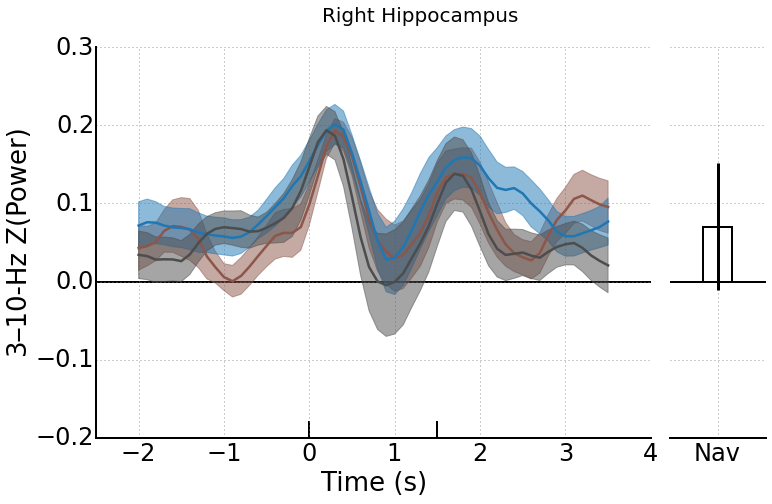

stat_fun(H1): min=-1.503714 max=2.256648
Running initial clustering
Found 1 clusters
Permuting ...
[......................................  ] 96.00000 \    Computing cluster p-values
Done.
0.227722772277
1.32283680374
0.198356371342


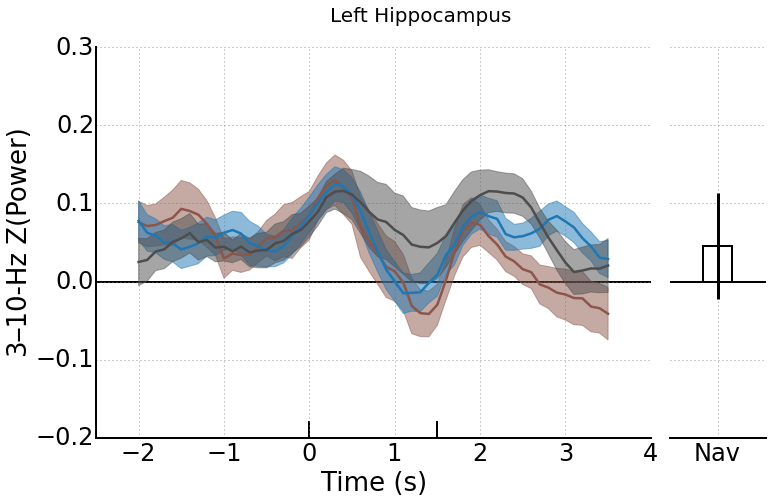

In [29]:
import os
import scipy
from mne.stats import fdr_correction, permutation_cluster_test, permutation_cluster_1samp_test
def stat_fun(x1,x2):
    t,p = scipy.stats.ttest_rel(x1,x2,nan_policy='omit')
    return t.data

def stat_fun2(x):
    t,p = scipy.stats.ttest_1samp(x,0,nan_policy='omit')
    return t.data

names = ['right_enc_time_power', 'left_enc_time_power']
titles = ['Right Hippocampus', 'Left Hippocampus']
save_path = '/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/'
plt.style.use('/Users/jmiller/python/RAM_classify/myplotstyle.mplstyle')
for i, hemi in enumerate([0,1]):
    ind_low = (sme_th_tbins_long.subject_objs[0].freqs >= 3) & (sme_th_tbins_long.subject_objs[0].freqs <= 10)
    mean_chest_time = np.stack([np.nanmean(x.res['z_chest'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)
    
    mean_enc_time = np.stack([np.nanmean(x.res['z_enc'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)    
    
    mean_rec_time = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)

    mean_nrec_time = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)
    
    mean_rec_time_ts = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th_tbins_long.subject_objs],
                                axis=0) 

    mean_move = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in move.subject_objs],
                                axis=0)
    
    
    mean_rec = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)

    mean_nrec = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)    
    
    mean_enc = np.stack([np.nanmean(x.res['z_all'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)   

    # compute within subject error bars for the timecourse
    errs = []
    for dat in zip(mean_rec_time.T, mean_nrec_time.T, mean_chest_time.T):
        errs.append(MoreyCous(np.stack(dat,-1), False))
    errs = np.stack(errs,-1)

    # time bins for x axis
    time_bins = sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1)

    ax = plt.subplot2grid((1, 6), (0, 0), colspan=5)
    ax2 = plt.subplot2grid((1, 6), (0, 5))
    plot_data = np.nanmean(mean_rec_time, axis=0)
    err_data = errs[0]
    ax.plot(time_bins,plot_data, color='#8c564b')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#8c564b', alpha=.5)

    plot_data = np.nanmean(mean_nrec_time, axis=0)
    err_data = errs[1]
    ax.plot(time_bins,plot_data, color='#1f77b4')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#1f77b4', alpha=.5)

    plot_data = np.nanmean(mean_chest_time, axis=0)
    err_data = errs[2]
    ax.plot(time_bins,plot_data, color=[.3, .3, .3])
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color=[.3, .3, .3], alpha=.5)   
#     
    # zero line
    ax.set_xlim(-2.5,4)    
    ax.plot(ax.get_xlim(),[0,0], '-k', lw=2, zorder=-5)
    onset = np.round(time_bins * 1000)/1000 == 0.0
    offset = np.round(time_bins * 1000)/1000 == 1.5
    ax.plot([time_bins[onset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)
    ax.plot([time_bins[offset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)    
    props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
#     ax.text(time_bins[onset], -.03, 'Onset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)    
#     ax.text(time_bins[offset], -.03, 'Offset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)      
    

    T_obs, clusters, cluster_p_values, H0 = permutation_cluster_test([mean_chest_time,mean_enc_time],
                             n_permutations=100, stat_fun=stat_fun)  
    for clus in zip(clusters, cluster_p_values):
        print clus[1]
        if clus[1] < .05:
            print([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]])
#             ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
#                    '-k', lw=3)

    ax.set_ylabel(u'3–10-Hz Z(Power)', fontdict={'fontsize': 26})            
    ax.set_xlabel('Time (s)', fontdict={'fontsize': 26})
    ax.set_axisbelow(True)
    ax.set_axis_bgcolor('w')
    ax.grid(color=(.5,.5,.5))
    ax.set_ylim(-.15,.3)
    ax.set_yticks(np.arange(-.2,.31,.1))
#     ax.grid()
    ax.spines['left'].set_linewidth(2)    
    ax.spines['bottom'].set_linewidth(2)  
    ax.tick_params(labelsize=24)
#     ax.set_title('Left Hippocampus', fontsize=20)
#     if i == 1:
#         l = ax.legend(['Recalled item', 'Not recalled item', 'No item'],loc=2,fontsize=18)
#         frame = l.get_frame()
#         frame.set_facecolor('w')
#         for legobj in l.legendHandles:
#             legobj.set_linewidth(5)

#     print(scipy.stats.ttest_rel(mean_move, mean_enc, nan_policy='omit'))
    ts,ps = scipy.stats.ttest_1samp(mean_move, 0, nan_policy='omit')
    print(ts)
    print(ps)
#     print(scipy.stats.ttest_1samp(mean_enc, 0, nan_policy='omit'))
    
#     errs = MoreyCous(np.stack([mean_move],-1))
    errs = scipy.stats.sem(mean_move, nan_policy='omit')*1.96
    ax2.bar([0], [np.nanmean(mean_move)], width=.3,
            align='center', color='w', lw=2, 
            yerr=errs,
            error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
    
    y = np.nanmean(mean_move) + errs + .01
    if ps < .01:
        plt.text(0,y,'**',ha = 'center', va='center',
                 bbox=dict(facecolor='1.', edgecolor='none'), size=20)
#                            boxstyle='Square,pad='+str(.3)),size = 20)
    
    ax2.set_ylim(-.15,.3)
    ax2.set_yticks(np.arange(-.2,.31,.1))
    ax2.set_axisbelow(True)
    ax2.set_axis_bgcolor('w')
    ax2.grid(color=(.5,.5,.5))
#     ax2.grid()
#     ax2.spines['right'].set_linewidth(2)    
    ax2.spines['bottom'].set_linewidth(2)  
    ax2.set_yticklabels([])
    ax2.set_xticks([0,1])
    ax2.set_xticklabels(['Nav'], rotation=0, fontsize=24)
    ax2.set_xlim(-0.5,0.5)
    ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)
    
    plt.suptitle(titles[i], fontsize=20)
    plt.savefig(os.path.join(save_path,'TH_timecourse_and_bar_no_enc_high_theta_%s.pdf' % names[i]))
    plt.show()

stat_fun(H1): min=-2.257331 max=3.765853
Running initial clustering
Found 5 clusters
Permuting ...
[......................................  ] 96.00000 \    Computing cluster p-values
Done.
0.514851485149
0.257425742574
0.148514851485
0.386138613861
0.306930693069
1.91273204465
0.0709765470948


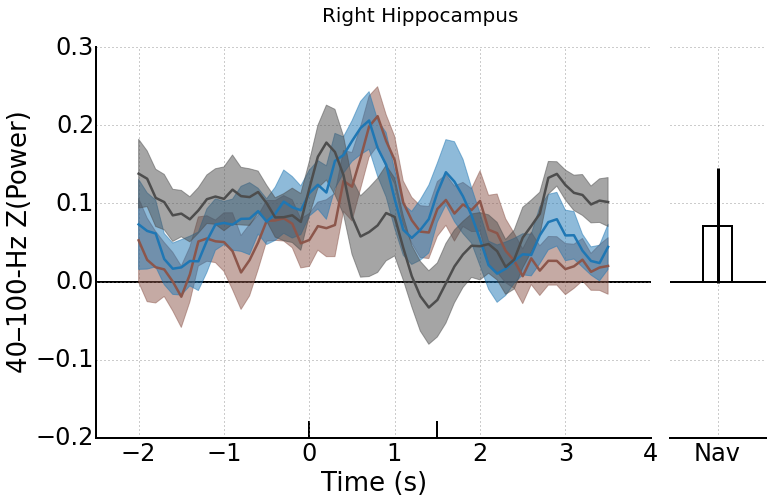

stat_fun(H1): min=-5.114092 max=2.654097
Running initial clustering
Found 3 clusters
Permuting ...
[......................................  ] 96.00000 \    Computing cluster p-values
Done.
0.336633663366
0.00990099009901
[0.40000000000000213, 1.8000000000000034]
0.405940594059
1.21650810322
0.235620408765


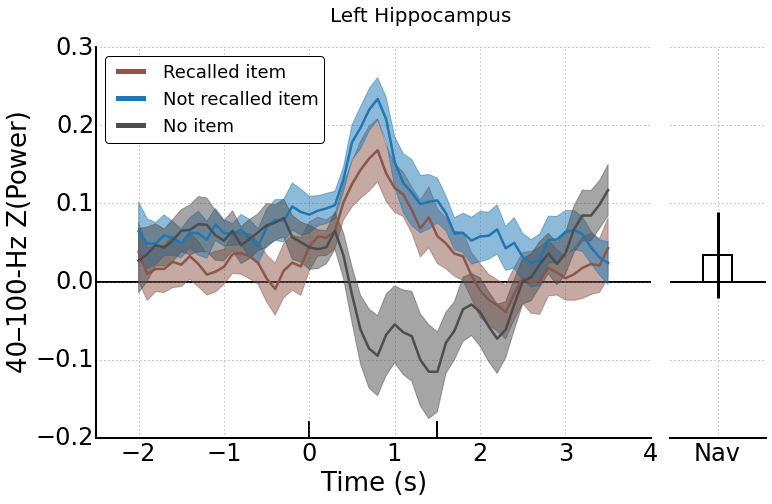

In [498]:
import os
import scipy
from mne.stats import fdr_correction, permutation_cluster_test, permutation_cluster_1samp_test
def stat_fun(x1,x2):
    t,p = scipy.stats.ttest_rel(x1,x2,nan_policy='omit')
    return t.data

def stat_fun2(x):
    t,p = scipy.stats.ttest_1samp(x,0,nan_policy='omit')
    return t.data

names = ['right_enc_time_power', 'left_enc_time_power']
titles = ['Right Hippocampus', 'Left Hippocampus']
save_path = '/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/'
plt.style.use('/Users/jmiller/python/RAM_classify/myplotstyle.mplstyle')
for i, hemi in enumerate([0,1]):
    ind_low = (sme_th_tbins_long.subject_objs[0].freqs >= 40) & (sme_th_tbins_long.subject_objs[0].freqs <= 100)
    mean_chest_time = np.stack([np.nanmean(x.res['z_chest'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)
    
    mean_enc_time = np.stack([np.nanmean(x.res['z_enc'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)    
    
    mean_rec_time = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)

    mean_nrec_time = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)
    
    mean_rec_time_ts = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th_tbins_long.subject_objs],
                                axis=0) 

    mean_move = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in move.subject_objs],
                                axis=0)
    
    
    mean_rec = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)

    mean_nrec = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)    
    
    mean_enc = np.stack([np.nanmean(x.res['z_all'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)   

    # compute within subject error bars for the timecourse
    errs = []
    for dat in zip(mean_rec_time.T, mean_nrec_time.T, mean_chest_time.T):
        errs.append(MoreyCous(np.stack(dat,-1), False))
    errs = np.stack(errs,-1)

    # time bins for x axis
    time_bins = sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1)

    ax = plt.subplot2grid((1, 6), (0, 0), colspan=5)
    ax2 = plt.subplot2grid((1, 6), (0, 5))
    plot_data = np.nanmean(mean_rec_time, axis=0)
    err_data = errs[0]
    ax.plot(time_bins,plot_data, color='#8c564b')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#8c564b', alpha=.5)

    plot_data = np.nanmean(mean_nrec_time, axis=0)
    err_data = errs[1]
    ax.plot(time_bins,plot_data, color='#1f77b4')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#1f77b4', alpha=.5)

    plot_data = np.nanmean(mean_chest_time, axis=0)
    err_data = errs[2]
    ax.plot(time_bins,plot_data, color=[.3, .3, .3])
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color=[.3, .3, .3], alpha=.5)   
#     
    # zero line
    ax.set_xlim(-2.5,4)    
    ax.plot(ax.get_xlim(),[0,0], '-k', lw=2, zorder=-5)
    onset = np.round(time_bins * 1000)/1000 == 0.0
    offset = np.round(time_bins * 1000)/1000 == 1.5
    ax.plot([time_bins[onset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)
    ax.plot([time_bins[offset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)    
    props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
#     ax.text(time_bins[onset], -.03, 'Onset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)    
#     ax.text(time_bins[offset], -.03, 'Offset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)      
    

    T_obs, clusters, cluster_p_values, H0 = permutation_cluster_test([mean_chest_time,mean_enc_time],
                             n_permutations=100, stat_fun=stat_fun)  
    for clus in zip(clusters, cluster_p_values):
        print clus[1]
        if clus[1] < .05:
            print([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]])
#             ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
#                    '-k', lw=3)

    ax.set_ylabel(u'40–100-Hz Z(Power)', fontdict={'fontsize': 26})            
    ax.set_xlabel('Time (s)', fontdict={'fontsize': 26})
    ax.set_axisbelow(True)
    ax.set_axis_bgcolor('w')
    ax.grid(color=(.5,.5,.5))
    ax.set_ylim(-.15,.3)
    ax.set_yticks(np.arange(-.2,.31,.1))
#     ax.grid()
    ax.spines['left'].set_linewidth(2)    
    ax.spines['bottom'].set_linewidth(2)  
    ax.tick_params(labelsize=24)
#     ax.set_title('Left Hippocampus', fontsize=20)
    if i == 1:
        l = ax.legend(['Recalled item', 'Not recalled item', 'No item'],loc=2,fontsize=18)
        frame = l.get_frame()
        frame.set_facecolor('w')
        for legobj in l.legendHandles:
            legobj.set_linewidth(5)

#     print(scipy.stats.ttest_rel(mean_move, mean_enc, nan_policy='omit'))
    ts,ps = scipy.stats.ttest_1samp(mean_move, 0, nan_policy='omit')
    print(ts)
    print(ps)
#     print(scipy.stats.ttest_1samp(mean_enc, 0, nan_policy='omit'))
    
#     errs = MoreyCous(np.stack([mean_move],-1))
    errs = scipy.stats.sem(mean_move, nan_policy='omit')*1.96
    ax2.bar([0], [np.nanmean(mean_move)], width=.3,
            align='center', color='w', lw=2, 
            yerr=errs,
            error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
    
    y = np.nanmean(mean_move) + errs + .01
    if ps < .01:
        plt.text(0,y,'**',ha = 'center', va='center',
                 bbox=dict(facecolor='1.', edgecolor='none'), size=20)
#                            boxstyle='Square,pad='+str(.3)),size = 20)
    
    ax2.set_ylim(-.15,.3)
    ax2.set_yticks(np.arange(-.2,.31,.1))
    ax2.set_axisbelow(True)
    ax2.set_axis_bgcolor('w')
    ax2.grid(color=(.5,.5,.5))
#     ax2.grid()
#     ax2.spines['right'].set_linewidth(2)    
    ax2.spines['bottom'].set_linewidth(2)  
    ax2.set_yticklabels([])
    ax2.set_xticks([0,1])
    ax2.set_xticklabels(['Nav'], rotation=0, fontsize=24)
    ax2.set_xlim(-0.5,0.5)
    ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)
    
    plt.suptitle(titles[i], fontsize=20)
    plt.savefig(os.path.join(save_path,'TH_timecourse_and_bar_no_enc_hfa_%s.pdf' % names[i]))
    plt.show()

In [410]:
from scipy import stats
stats.f.ppf(.95, 1, 24)

4.2596772726902312

stat_fun(H1): min=-1.400646 max=0.952003
Running initial clustering
Found 0 clusters
[ 0.77308155  0.77267134  0.7230578   0.69088499  0.54132515  0.27470942
 -0.09579499 -0.59138919 -1.11242742 -1.40064573 -1.3755571  -1.09935118
 -0.70197649 -0.34118475 -0.06908469  0.18346736  0.38836352  0.54488214
  0.61865712  0.64436692  0.57844043  0.44170726  0.3935794   0.54459463
  0.717119    0.83805094  0.95200307  0.92463432  0.73947521  0.50146587
  0.24513467  0.0069668  -0.17317661 -0.27787144 -0.28249119 -0.12288098
  0.11720391  0.34098149  0.53518309  0.66793332  0.64125115  0.46106306
  0.2102141  -0.12615966 -0.54173378 -0.93038676 -1.13094382 -1.11448085
 -0.96067174 -0.67916206 -0.32130673 -0.11216651 -0.07983481 -0.07094231
 -0.07404536 -0.13184223]
3.61331519173
0.00185149012385


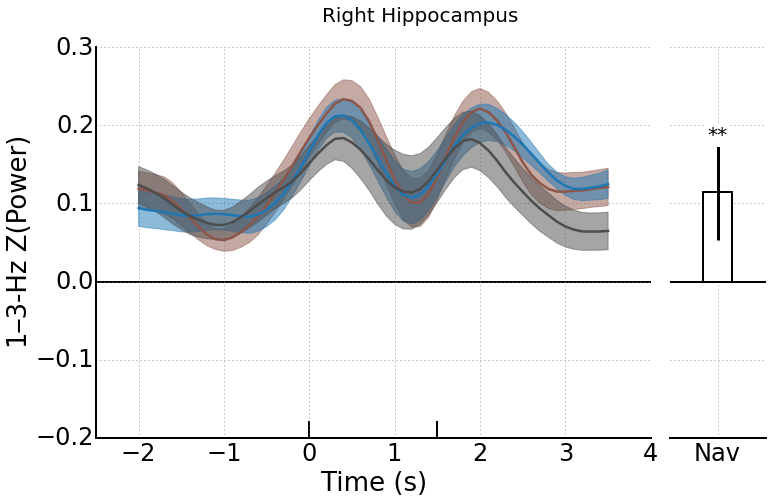

stat_fun(H1): min=-2.184006 max=3.056816
Running initial clustering
Found 2 clusters
Permuting ...
[......................................  ] 96.00000 \    Computing cluster p-values
Done.
[-0.50369361 -0.32292257 -0.22907587 -0.02283234  0.37146581  0.68135429
  0.91570695  1.10988246  1.20906743  1.11158516  0.98709235  1.01722739
  1.01581625  1.16944195  1.5739921   1.71548418  1.71150909  1.73235502
  1.78274508  1.78611957  1.81656268  1.95287878  2.2256472   2.5462086
  2.86039727  3.05681625  2.97998659  2.92030068  2.73679171  2.39509414
  2.37086488  2.58086455  2.63140673  2.55384583  2.2986898   1.85870498
  1.42404284  1.03957963  0.72857881  0.83586126  1.08547625  1.11829209
  1.04197224  0.85817206  0.45711461 -0.01740847 -0.4666248  -0.91820511
 -1.34852005 -1.69482387 -1.99477751 -2.1113915  -2.1840062  -2.13148643
 -2.00417883 -1.86718925]
(slice(18L, 36L, None),)
0.029702970297
[-0.1999999999999984, 1.6000000000000032]
(slice(50L, 56L, None),)
0.237623762376
1.21254

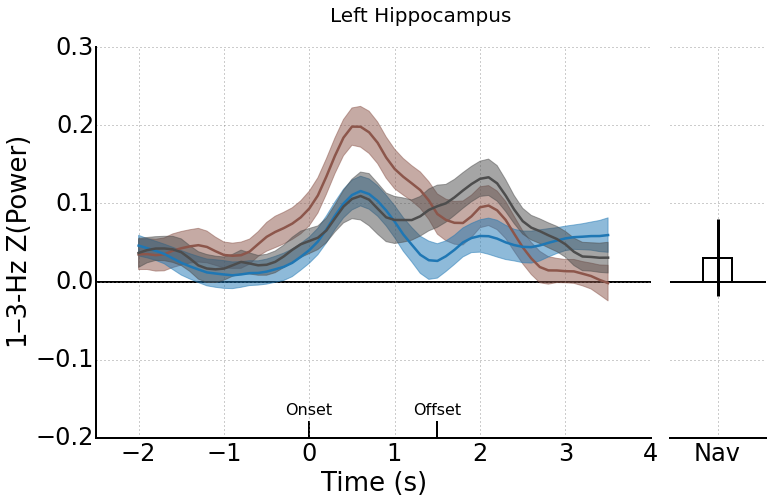

In [496]:
import os
import scipy
from mne.stats import fdr_correction, permutation_cluster_test, permutation_cluster_1samp_test
def stat_fun(x1,x2):
    t,p = scipy.stats.ttest_rel(x1,x2,nan_policy='omit')
    return t.data

def stat_fun2(x):
    t,p = scipy.stats.ttest_1samp(x,0,nan_policy='omit')
    return t.data

names = ['right_enc_time_power', 'left_enc_time_power']
titles = ['Right Hippocampus', 'Left Hippocampus']
save_path = '/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/'
for i, hemi in enumerate([0,1]):
    ind_low = (sme_th_tbins_long.subject_objs[0].freqs >= 1) & (sme_th_tbins_long.subject_objs[0].freqs <= 3)
    mean_chest_time = np.stack([np.nanmean(x.res['z_chest'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)
    
    mean_rec_time = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)

    mean_nrec_time = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in chest_tbins_long.subject_objs],
                                axis=0)
    
    mean_rec_time_ts = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th_tbins_long.subject_objs],
                                axis=0) 

    mean_move = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in move.subject_objs],
                                axis=0)
    
    
    mean_rec = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)

    mean_nrec = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)    
    
    mean_enc = np.stack([np.nanmean(x.res['z_all'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)   

    # compute within subject error bars for the timecourse
    errs = []
    for dat in zip(mean_rec_time.T, mean_nrec_time.T, mean_chest_time.T):
        errs.append(MoreyCous(np.stack(dat,-1), False))
    errs = np.stack(errs,-1)

    # time bins for x axis
    time_bins = sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1)

    ax = plt.subplot2grid((1, 6), (0, 0), colspan=5)
    ax2 = plt.subplot2grid((1, 6), (0, 5))
    plot_data = np.nanmean(mean_rec_time, axis=0)
    err_data = errs[0]
    ax.plot(time_bins,plot_data, color='#8c564b')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#8c564b', alpha=.5)

    plot_data = np.nanmean(mean_nrec_time, axis=0)
    err_data = errs[1]
    ax.plot(time_bins,plot_data, color='#1f77b4')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#1f77b4', alpha=.5)

    plot_data = np.nanmean(mean_chest_time, axis=0)
    err_data = errs[2]
    ax.plot(time_bins,plot_data, color=[.3, .3, .3])
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color=[.3, .3, .3], alpha=.5)   
#     
    # zero line
    ax.set_xlim(-2.5,4)    
    ax.plot(ax.get_xlim(),[0,0], '-k', lw=2, zorder=-5)
    onset = np.round(time_bins * 1000)/1000 == 0.0
    offset = np.round(time_bins * 1000)/1000 == 1.5
    ax.plot([time_bins[onset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)
    ax.plot([time_bins[offset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)     
    props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
    if i == 1:
        ax.text(time_bins[onset], -.17, 'Onset', horizontalalignment='center', fontsize=16, 
                color='k', weight='normal',family='sans-serif', bbox=None)    
        ax.text(time_bins[offset], -.17, 'Offset', horizontalalignment='center', fontsize=16, 
                color='k', weight='normal',family='sans-serif', bbox=None)      
    
    # compute permuation cluster mult comp correction
#     ts, ps = scipy.stats.ttest_1samp(mean_rec_time_ts,0,nan_policy='omit')
#     T_obs, clusters, cluster_p_values, H0 = permutation_cluster_1samp_test(mean_rec_time_ts,
#                              n_permutations=100, stat_fun=stat_fun2)    
#     for clus in zip(clusters, cluster_p_values):
#         if clus[1] < .05:
#     #             ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
#     #                    '-k', lw=3)

#             inds = range(clus[0][0].start,clus[0][0].stop)
#             ax.fill_between(time_bins[inds],
#                             (np.nanmean(mean_nrec_time, axis=0) + errs[1])[inds],
#                             (np.nanmean(mean_rec_time, axis=0) - errs[0])[inds],
#                            alpha=.25, color='k', zorder=-4)
#     print(clusters)
#     print(cluster_p_values)
    
    T_obs, clusters, cluster_p_values, H0 = permutation_cluster_test([mean_rec_time,mean_nrec_time],
                             n_permutations=100, stat_fun=stat_fun)
    print(T_obs)
    for clus in zip(clusters, cluster_p_values):
        print(clus[0])
        print clus[1]
        if clus[1] < .05:
            print([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]])
#             ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
#                    '-k', lw=3)

#             inds = range(clus[0][0].start,clus[0][0].stop)
#             ax.fill_between(time_bins[inds],
#                             (np.nanmean(mean_nrec_time, axis=0) + errs[1])[inds],
#                             (np.nanmean(mean_rec_time, axis=0) - errs[0])[inds],
#                            alpha=.25, color='k', zorder=-4)

    ax.set_ylabel(u'1–3-Hz Z(Power)', fontdict={'fontsize': 26})            
    ax.set_xlabel('Time (s)', fontdict={'fontsize': 26})
    ax.set_axisbelow(True)
    ax.set_axis_bgcolor('w')
    ax.grid(color=(.5,.5,.5))
    ax.set_ylim(-.15,.3)
#     ax.grid()
    ax.set_yticks(np.arange(-.2,.31,.1))
    ax.spines['left'].set_linewidth(2)    
    ax.spines['bottom'].set_linewidth(2)  
    ax.tick_params(labelsize=24)
#     ax.set_title('Left Hippocampus', fontsize=20)
#     if i == 1:
#         l = ax.legend(['Recalled item', 'Not recalled item', 'No item'],loc=2,fontsize=14)
#         frame = l.get_frame()
#         frame.set_facecolor('w')

#     print(scipy.stats.ttest_rel(mean_move, mean_enc, nan_policy='omit'))
    ts,ps = scipy.stats.ttest_1samp(mean_move, 0, nan_policy='omit')
    print(ts)
    print(ps)
#     print(scipy.stats.ttest_1samp(mean_enc, 0, nan_policy='omit'))
    
#     errs = MoreyCous(np.stack([mean_move],-1))
    errs = scipy.stats.sem(mean_move, nan_policy='omit')*1.96
    ax2.bar([0], [np.nanmean(mean_move)], width=.3,
            align='center', color='w', lw=2, 
            yerr=errs,
            error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
    
    y = np.nanmean(mean_move) + errs + .01
    if ps < .01:
        plt.text(0,y,'**',ha = 'center', va='center',
                 bbox=dict(facecolor='1.', edgecolor='none'), size=20)
#                            boxstyle='Square,pad='+str(.3)),size = 20)
    
    ax2.set_ylim(-.15,.3)
    ax2.set_yticks(np.arange(-.2,.31,.1))
    ax2.set_axisbelow(True)
    ax2.set_axis_bgcolor('w')
    ax2.grid(color=(.5,.5,.5))
#     ax2.grid()
#     ax2.spines['right'].set_linewidth(2)    
    ax2.spines['bottom'].set_linewidth(2)  
    ax2.set_yticklabels([])
    ax2.set_xticks([0,1])
    ax2.set_xticklabels(['Nav'], rotation=0, fontsize=24)
    ax2.set_xlim(-0.5,0.5)
    ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)
    
    plt.suptitle(titles[i], fontsize=20)
    plt.savefig(os.path.join(save_path,'TH_timecourse_and_bar_no_enc_low_theta_%s.pdf' % names[i]))
    plt.show()

In [39]:
from scipy.io import loadmat
fr = loadmat('/home1/jfm2/FRsByType_all.mat')

In [44]:
m1 = np.mean(fr['FRsbyType'][0][0], axis=0)
m2 = np.mean(fr['FRsbyType'][0][1], axis=0)
fr_chest = np.mean(np.stack([m1,m2],0),axis=0)
fr_empty = np.mean(fr['FRsbyType'][0][2], axis=0)

In [45]:
t = np.arange(-2,3.5,.1)

In [82]:
fr_chest = np.mean(np.stack([fr['FRsbyType'][0][0],fr['FRsbyType'][0][1]],-1), axis=2).T
fr_empty = fr['FRsbyType'][0][2].T

In [96]:
sem(np.stack(dat,-1))

array([ 0.05791106,  0.06036046])

In [109]:
import pdb
def MoreyCous2(dat, do_ci=False):
    n_subj = np.sum(np.any(~np.isnan(dat), axis=1))
    g_mean = np.nanmean(dat)
    n_conds = dat.shape[1]
    dat -= np.tile(np.expand_dims(np.nanmean(dat,axis=1),1),n_conds)
    dat += g_mean
    crit_t = scipy.stats.t.ppf(.975, n_subj - 1)
    s = scipy.stats.sem(dat, axis=0, nan_policy='omit')
    if not do_ci:
        return s * (np.sqrt(n_conds) / np.sqrt(n_conds-1))
    else:
        return s * crit_t * (np.sqrt(n_conds) / np.sqrt(n_conds-1))

# scipy.io.savemat('/Users/jmiller/Desktop/test2',{'dat':np.vstack([plot_region_mean_rec.T[25], plot_region_mean_nrec.T[25]]).T})

In [106]:
s=scipy.stats.sem(dat, axis=0)
s

array([ 0.03348133,  0.31440393,  0.47372782,  0.52057463,  0.54679631,
        0.55794349,  0.58713938,  0.589689  ,  0.48988972,  0.29332665,
        0.01015397,  0.22485021,  0.26050877,  0.11529556,  0.14443329,
        0.31924731,  0.25794511,  0.0300151 ,  0.20845775,  0.31466267,
        0.35863112,  0.44879867,  0.41956922,  0.20262264,  0.04685681,
        0.01179251,  0.04555609,  0.07572352,  0.00856654,  0.05549837,
        0.05973475,  0.03844171,  0.01550488,  0.04392647,  0.16609625,
        0.27506002,  0.17673166,  0.08643386,  0.27438472,  0.31387026,
        0.29574317,  0.33040404,  0.4150333 ,  0.47829334,  0.41675043,
        0.07996389,  0.29873942,  0.29972081,  0.03171149,  0.20941459,
        0.37555617,  0.41878798,  0.29533092,  0.11660954,  0.01230439])

In [110]:
from scipy.stats import sem
errs = []
for dat in zip(fr_chest.T, fr_empty.T):
#     print np.stack(dat,-1)
    errs.append(MoreyCous2(np.stack(dat,-1), False))
errs = np.stack(errs,-1)

/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:24: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:27: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:30: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:33: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:40: RuntimeWarning: Mean of empty slice
/home1/jfm2/.con

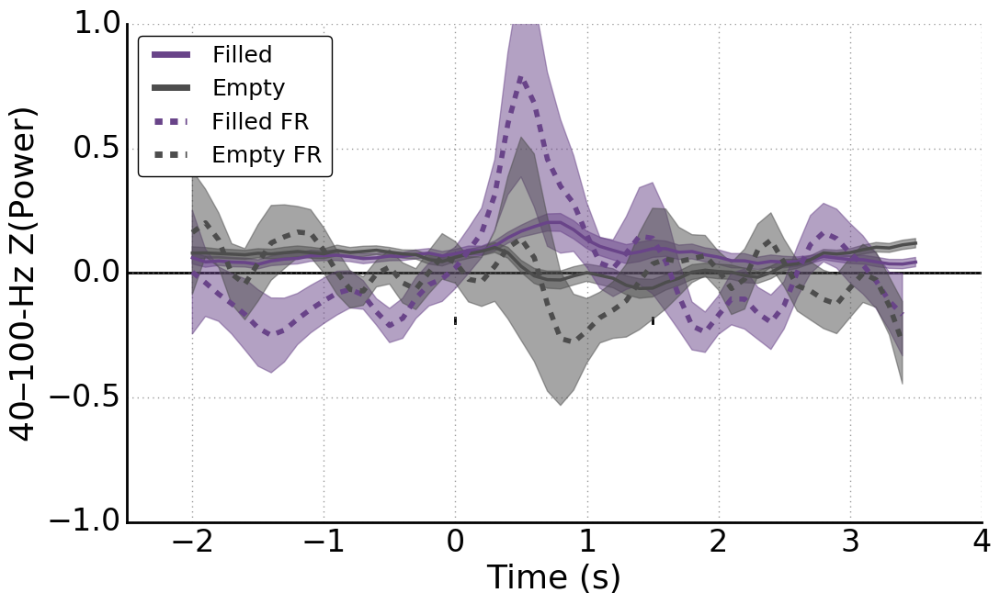

In [115]:
import os
import scipy
from mne.stats import fdr_correction, permutation_cluster_test, permutation_cluster_1samp_test
def stat_fun(x1,x2):
    t,p = scipy.stats.ttest_rel(x1,x2,nan_policy='omit')
    return t.data

def stat_fun2(x):
    t,p = scipy.stats.ttest_1samp(x,0,nan_policy='omit')
    return t.data

names = ['right_enc_time_power', 'left_enc_time_power']
titles = ['Right Hippocampus', 'Left Hippocampus']
save_path = '/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/'
plt.style.use('/home1/jfm2/python/RAM_classify/myplotstyle.mplstyle')

ind_low = (sme_th_tbins_long.subject_objs[0].freqs >= 40) & (sme_th_tbins_long.subject_objs[0].freqs <= 100)
mean_chest_time = np.stack([np.nanmean(x.res['z_chest'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)

mean_enc_time = np.stack([np.nanmean(x.res['z_enc'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)    

mean_rec_time = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)

mean_nrec_time = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)

mean_rec_time_ts = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th_tbins_long.subject_objs],
                            axis=0) 

mean_move = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in move.subject_objs],
                            axis=0)


mean_rec = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th.subject_objs],
                            axis=0)

mean_nrec = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th.subject_objs],
                            axis=0)    

mean_enc = np.stack([np.nanmean(x.res['z_all'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th.subject_objs],
                            axis=0)   

# compute within subject error bars for the timecourse
errs = []
for dat in zip(mean_enc_time.T, mean_chest_time.T):
#     print np.stack(dat,-1).shape
    errs.append(MoreyCous(np.stack(dat,-1), False))
errs = np.stack(errs,-1)

# time bins for x axis
time_bins = sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1)

fig, ax = plt.subplots()
plot_data = np.nanmean(mean_enc_time, axis=0)
err_data = errs[0]
ax.plot(time_bins,plot_data, color='#694489')
ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                color='#694489', alpha=.5)

plot_data = np.nanmean(mean_chest_time, axis=0)
err_data = errs[1]
ax.plot(time_bins,plot_data, color=[.3, .3, .3])
ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                color=[.3, .3, .3], alpha=.5)   
#     
# zero line

errs = []
for dat in zip(fr_chest, fr_empty):
#     print np.stack(dat,-1).shape
    errs.append(MoreyCous2(np.stack(dat,-1), False))
errs = np.stack(errs,-1)
# print(errs.shape)

plot_data = fr_chest.mean(axis=1)
# print(plot_data.shape)
err_data = errs[0]
ax.plot(t, plot_data, '--', color='#694489', lw=4)
ax.fill_between(t, plot_data-err_data, plot_data+err_data,
                color='#694489', alpha=.5)

plot_data = fr_empty.mean(axis=1)
# print(plot_data.shape)
err_data = errs[1]
ax.plot(t, plot_data, '--', color=[.3, .3, .3], lw=4)
ax.fill_between(t, plot_data-err_data, plot_data+err_data,
                color=[.3, .3, .3], alpha=.5)

ax.set_xlim(-2.5,4)    
ax.plot(ax.get_xlim(),[0,0], '-k', lw=2, zorder=-5)
onset = np.round(time_bins * 1000)/1000 == 0.0
offset = np.round(time_bins * 1000)/1000 == 1.5
ax.plot([time_bins[onset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)
ax.plot([time_bins[offset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)    
props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
#     ax.text(time_bins[onset], -.03, 'Onset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)    
#     ax.text(time_bins[offset], -.03, 'Offset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)      


# T_obs, clusters, cluster_p_values, H0 = permutation_cluster_test([mean_chest_time,mean_enc_time],
#                          n_permutations=100, stat_fun=stat_fun)  
# for clus in zip(clusters, cluster_p_values):
#     print clus[1]
#     if clus[1] < .05:
#         print([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]])
#             ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
#                    '-k', lw=3)

ax.set_ylabel(u'40–100-Hz Z(Power)', fontdict={'fontsize': 26})            
ax.set_xlabel('Time (s)', fontdict={'fontsize': 26})
ax.set_axisbelow(True)
ax.set_axis_bgcolor('w')
ax.grid(color=(.5,.5,.5))
ax.set_ylim(-1,1)
# ax.set_yticks(np.arange(-.2,.31,.1))
#     ax.grid()
ax.spines['left'].set_linewidth(2)    
ax.spines['bottom'].set_linewidth(2)  
ax.tick_params(labelsize=24)
#     ax.set_title('Left Hippocampus', fontsize=20)
# if i == 1:
l = ax.legend(['Filled', 'Empty', 'Filled FR', 'Empty FR'],loc=2,fontsize=18)
frame = l.get_frame()
frame.set_facecolor('w')
for legobj in l.legendHandles:
    legobj.set_linewidth(5)

#     print(scipy.stats.ttest_rel(mean_move, mean_enc, nan_policy='omit'))
# ts,ps = scipy.stats.ttest_1samp(mean_move, 0, nan_policy='omit')
# print(ts)
# print(ps)
# #     print(scipy.stats.ttest_1samp(mean_enc, 0, nan_policy='omit'))

# #     errs = MoreyCous(np.stack([mean_move],-1))
# errs = scipy.stats.sem(mean_move, nan_policy='omit')*1.96
# ax2.bar([0], [np.nanmean(mean_move)], width=.3,
#         align='center', color='w', lw=2, 
#         yerr=errs,
#         error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))

# y = np.nanmean(mean_move) + errs + .01
# if ps < .01:
#     plt.text(0,y,'**',ha = 'center', va='center',
#              bbox=dict(facecolor='1.', edgecolor='none'), size=20)
# #                            boxstyle='Square,pad='+str(.3)),size = 20)

# ax2.set_ylim(-1,1)
# ax2.set_yticks(np.arange(-.2,.31,.1))
# ax2.set_axisbelow(True)
# ax2.set_axis_bgcolor('w')
# ax2.grid(color=(.5,.5,.5))
# #     ax2.grid()
# #     ax2.spines['right'].set_linewidth(2)    
# ax2.spines['bottom'].set_linewidth(2)  
# ax2.set_yticklabels([])
# ax2.set_xticks([0,1])
# ax2.set_xticklabels(['Nav'], rotation=0, fontsize=24)
# ax2.set_xlim(-0.5,0.5)
# ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)

# plt.suptitle(titles[i], fontsize=20)
# plt.savefig(os.path.join(save_path,'TH_timecourse_and_bar_no_enc_hfa_%s.pdf' % names[i]))
# plt.show()

/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:24: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:27: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:30: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:33: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:40: RuntimeWarning: Mean of empty slice
/home1/jfm2/.con

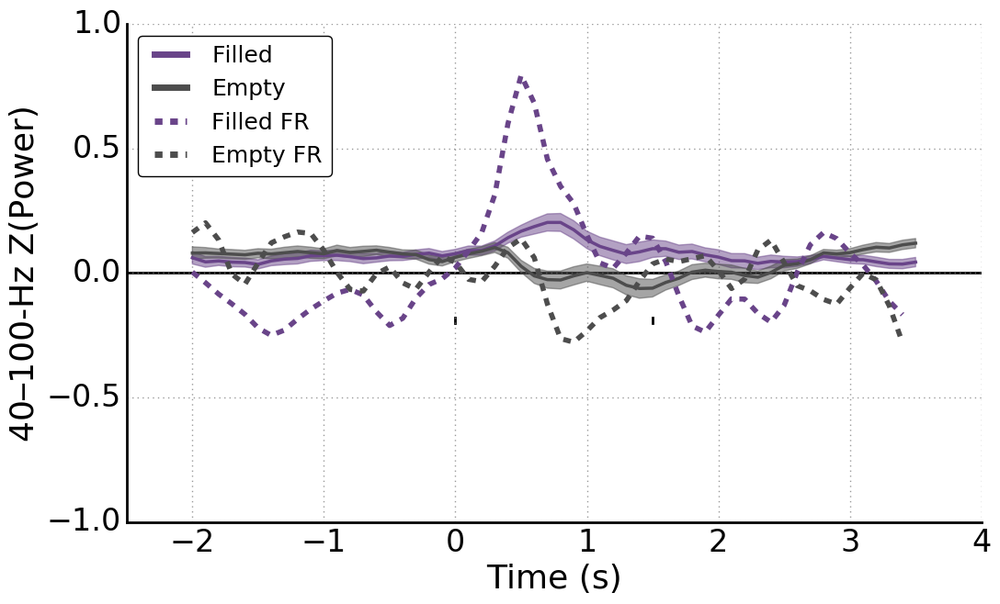

In [117]:
import os
import scipy
from mne.stats import fdr_correction, permutation_cluster_test, permutation_cluster_1samp_test
def stat_fun(x1,x2):
    t,p = scipy.stats.ttest_rel(x1,x2,nan_policy='omit')
    return t.data

def stat_fun2(x):
    t,p = scipy.stats.ttest_1samp(x,0,nan_policy='omit')
    return t.data

names = ['right_enc_time_power', 'left_enc_time_power']
titles = ['Right Hippocampus', 'Left Hippocampus']
save_path = '/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/'
plt.style.use('/home1/jfm2/python/RAM_classify/myplotstyle.mplstyle')

ind_low = (sme_th_tbins_long.subject_objs[0].freqs >= 40) & (sme_th_tbins_long.subject_objs[0].freqs <= 100)
mean_chest_time = np.stack([np.nanmean(x.res['z_chest'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)

mean_enc_time = np.stack([np.nanmean(x.res['z_enc'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)    

mean_rec_time = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)

mean_nrec_time = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)

mean_rec_time_ts = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th_tbins_long.subject_objs],
                            axis=0) 

mean_move = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in move.subject_objs],
                            axis=0)


mean_rec = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th.subject_objs],
                            axis=0)

mean_nrec = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th.subject_objs],
                            axis=0)    

mean_enc = np.stack([np.nanmean(x.res['z_all'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in sme_th.subject_objs],
                            axis=0)   

# compute within subject error bars for the timecourse
errs = []
for dat in zip(mean_enc_time.T, mean_chest_time.T):
#     print np.stack(dat,-1).shape
    errs.append(MoreyCous(np.stack(dat,-1), False))
errs = np.stack(errs,-1)

# time bins for x axis
time_bins = sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1)

fig, ax = plt.subplots()
plot_data = np.nanmean(mean_enc_time, axis=0)
err_data = errs[0]
ax.plot(time_bins,plot_data, color='#694489')
ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                color='#694489', alpha=.5)

plot_data = np.nanmean(mean_chest_time, axis=0)
err_data = errs[1]
ax.plot(time_bins,plot_data, color=[.3, .3, .3])
ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                color=[.3, .3, .3], alpha=.5)   
#     
# zero line

errs = []
for dat in zip(fr_chest, fr_empty):
#     print np.stack(dat,-1).shape
    errs.append(MoreyCous2(np.stack(dat,-1), False))
errs = np.stack(errs,-1)
# print(errs.shape)

plot_data = fr_chest.mean(axis=1)
# print(plot_data.shape)
err_data = errs[0]
ax.plot(t, plot_data, '--', color='#694489', lw=4)
# ax.fill_between(t, plot_data-err_data, plot_data+err_data,
#                 color='#694489', alpha=.5)

plot_data = fr_empty.mean(axis=1)
# print(plot_data.shape)
err_data = errs[1]
ax.plot(t, plot_data, '--', color=[.3, .3, .3], lw=4)
# ax.fill_between(t, plot_data-err_data, plot_data+err_data,
#                 color=[.3, .3, .3], alpha=.5)

ax.set_xlim(-2.5,4)    
ax.plot(ax.get_xlim(),[0,0], '-k', lw=2, zorder=-5)
onset = np.round(time_bins * 1000)/1000 == 0.0
offset = np.round(time_bins * 1000)/1000 == 1.5
ax.plot([time_bins[onset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)
ax.plot([time_bins[offset]]*2, [-.2, -.18],'-k', lw=2, zorder=-5)    
props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
#     ax.text(time_bins[onset], -.03, 'Onset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)    
#     ax.text(time_bins[offset], -.03, 'Offset', horizontalalignment='center', fontsize=16, 
#             color='k', weight='normal',family='sans-serif', bbox=None)      


# T_obs, clusters, cluster_p_values, H0 = permutation_cluster_test([mean_chest_time,mean_enc_time],
#                          n_permutations=100, stat_fun=stat_fun)  
# for clus in zip(clusters, cluster_p_values):
#     print clus[1]
#     if clus[1] < .05:
#         print([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]])
#             ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
#                    '-k', lw=3)

ax.set_ylabel(u'40–100-Hz Z(Power)', fontdict={'fontsize': 26})            
ax.set_xlabel('Time (s)', fontdict={'fontsize': 26})
ax.set_axisbelow(True)
ax.set_axis_bgcolor('w')
ax.grid(color=(.5,.5,.5))
ax.set_ylim(-1,1)
# ax.set_yticks(np.arange(-.2,.31,.1))
#     ax.grid()
ax.spines['left'].set_linewidth(2)    
ax.spines['bottom'].set_linewidth(2)  
ax.tick_params(labelsize=24)
#     ax.set_title('Left Hippocampus', fontsize=20)
# if i == 1:
l = ax.legend(['Filled', 'Empty', 'Filled FR', 'Empty FR'],loc=2,fontsize=18)
frame = l.get_frame()
frame.set_facecolor('w')
for legobj in l.legendHandles:
    legobj.set_linewidth(5)

#     print(scipy.stats.ttest_rel(mean_move, mean_enc, nan_policy='omit'))
# ts,ps = scipy.stats.ttest_1samp(mean_move, 0, nan_policy='omit')
# print(ts)
# print(ps)
# #     print(scipy.stats.ttest_1samp(mean_enc, 0, nan_policy='omit'))

# #     errs = MoreyCous(np.stack([mean_move],-1))
# errs = scipy.stats.sem(mean_move, nan_policy='omit')*1.96
# ax2.bar([0], [np.nanmean(mean_move)], width=.3,
#         align='center', color='w', lw=2, 
#         yerr=errs,
#         error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))

# y = np.nanmean(mean_move) + errs + .01
# if ps < .01:
#     plt.text(0,y,'**',ha = 'center', va='center',
#              bbox=dict(facecolor='1.', edgecolor='none'), size=20)
# #                            boxstyle='Square,pad='+str(.3)),size = 20)

# ax2.set_ylim(-1,1)
# ax2.set_yticks(np.arange(-.2,.31,.1))
# ax2.set_axisbelow(True)
# ax2.set_axis_bgcolor('w')
# ax2.grid(color=(.5,.5,.5))
# #     ax2.grid()
# #     ax2.spines['right'].set_linewidth(2)    
# ax2.spines['bottom'].set_linewidth(2)  
# ax2.set_yticklabels([])
# ax2.set_xticks([0,1])
# ax2.set_xticklabels(['Nav'], rotation=0, fontsize=24)
# ax2.set_xlim(-0.5,0.5)
# ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)

# plt.suptitle(titles[i], fontsize=20)
# plt.savefig(os.path.join(save_path,'TH_timecourse_and_bar_no_enc_hfa_%s.pdf' % names[i]))
# plt.show()

In [16]:
mean_chest_time = np.stack([np.nanmean(x.res['z_chest'][ind_low].mean(axis=0)[(x.elec_locs['Hipp'])], axis=0) for x in chest_tbins_long.subject_objs],
                            axis=0)

/home1/jfm2/.conda/envs/pysurfer/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


KeyError: 'z_chest'

In [ ]:
chest_tbins_long.subject_objs[0]

In [20]:
x.res.keys()

['ps_hfa',
 'ps',
 'ps_lfa',
 'ts_lfa',
 'zs_region',
 'ts',
 'regions',
 'ts_hfa',
 'z_rec',
 'time_bins',
 'z_nrec',
 'ts_region',
 'zs']

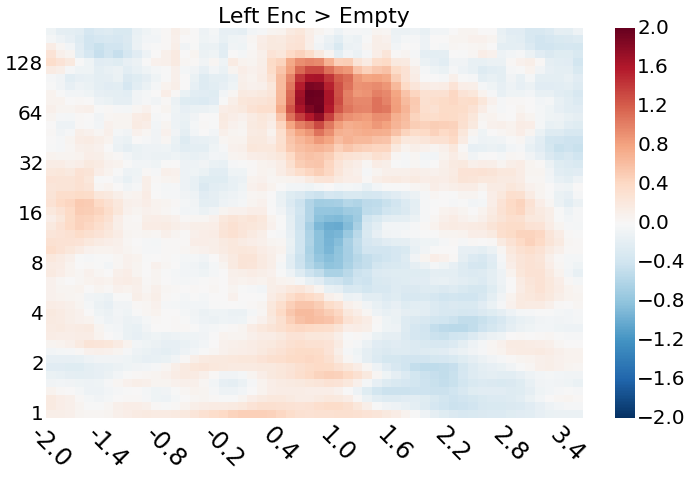

In [154]:
right_hipp = np.stack([-np.nanmean(x.res['ts'][:, (x.elec_locs['Hipp']) & (~x.elec_locs['is_right']), :], axis=1) for x in chest_tbins_long.subject_objs], axis=-1)
# right_hipp.shape
plt.imshow(np.nanmean(right_hipp, axis=2), interpolation='nearest', cmap='RdBu_r', vmin=-2, vmax=2, aspect='auto')
cb = plt.colorbar()
new_freqs = sme_th_tbins_long.subject_objs[0].compute_pow_two_series()
new_y = np.interp(np.log10(new_freqs[:-1]), np.log10(sme_th_tbins_long.subject_objs[0].freqs), range(len(sme_th_tbins_long.subject_objs[0].freqs)))
plt.xticks(range(len(sme_th_tbins_long.subject_objs[0].res['time_bins']))[::6], sme_th_tbins_long.subject_objs[0].res['time_bins'][::6], fontsize=24, rotation=-45)
_ = plt.yticks(new_y, new_freqs[:-1], fontsize=20)
plt.gca().invert_yaxis()
plt.grid()
plt.title('Left Enc > Empty')

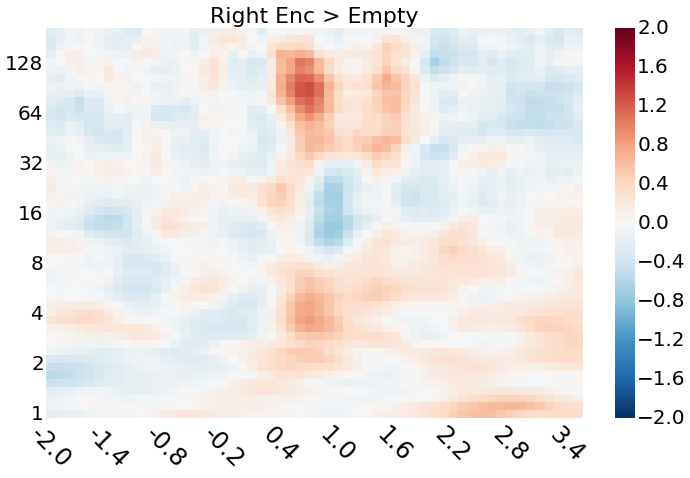

In [153]:
right_hipp = np.stack([-np.nanmean(x.res['ts'][:, (x.elec_locs['Hipp']) & (x.elec_locs['is_right']), :], axis=1) for x in chest_tbins_long.subject_objs], axis=-1)
# right_hipp.shape
plt.imshow(np.nanmean(right_hipp, axis=2), interpolation='nearest', cmap='RdBu_r', vmin=-2, vmax=2, aspect='auto')
cb = plt.colorbar()
new_freqs = sme_th_tbins_long.subject_objs[0].compute_pow_two_series()
new_y = np.interp(np.log10(new_freqs[:-1]), np.log10(sme_th_tbins_long.subject_objs[0].freqs), range(len(sme_th_tbins_long.subject_objs[0].freqs)))
plt.xticks(range(len(sme_th_tbins_long.subject_objs[0].res['time_bins']))[::6], sme_th_tbins_long.subject_objs[0].res['time_bins'][::6], fontsize=24, rotation=-45)
_ = plt.yticks(new_y, new_freqs[:-1], fontsize=20)
plt.gca().invert_yaxis()
plt.grid()
plt.title('Right Enc > Empty')

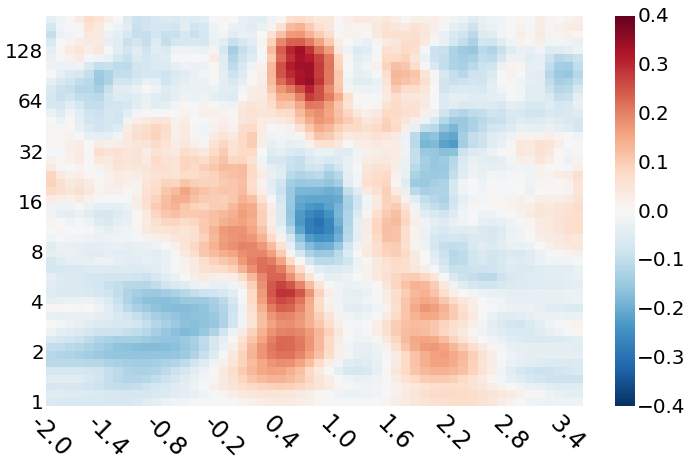

In [107]:
right_hipp = np.stack([np.nanmean(x.res['z_all'][:, (x.elec_locs['Hipp']) & (x.elec_locs['is_right']), :], axis=1) for x in sme_th_tbins_long.subject_objs], axis=-1)
# right_hipp.shape
plt.imshow(np.nanmean(right_hipp, axis=2), interpolation='nearest', cmap='RdBu_r', vmin=-.4, vmax=.4, aspect='auto')
cb = plt.colorbar()
new_freqs = sme_th_tbins_long.subject_objs[0].compute_pow_two_series()
new_y = np.interp(np.log10(new_freqs[:-1]), np.log10(sme_th_tbins_long.subject_objs[0].freqs), range(len(sme_th_tbins_long.subject_objs[0].freqs)))
plt.xticks(range(len(sme_th_tbins_long.subject_objs[0].res['time_bins']))[::6], sme_th_tbins_long.subject_objs[0].res['time_bins'][::6], fontsize=24, rotation=-45)
_ = plt.yticks(new_y, new_freqs[:-1], fontsize=20)
plt.gca().invert_yaxis()
plt.grid()

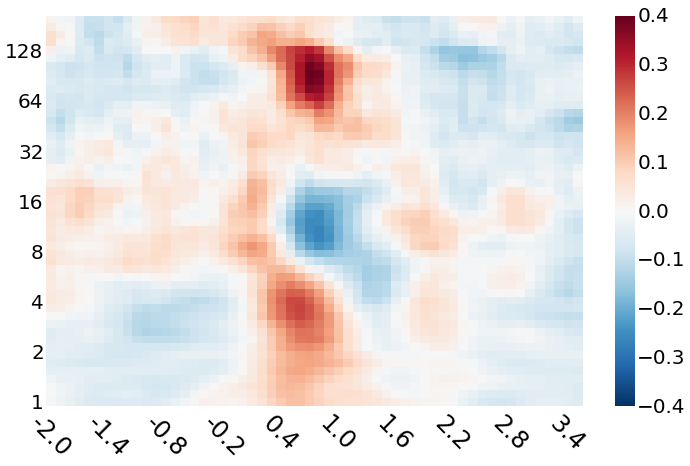

In [96]:
right_hipp = np.stack([np.nanmean(x.res['z_all'][:, (x.elec_locs['Hipp']) & (~x.elec_locs['is_right']), :], axis=1) for x in sme_th_tbins_long.subject_objs], axis=-1)
# right_hipp.shape
plt.imshow(np.nanmean(right_hipp, axis=2), interpolation='nearest', cmap='RdBu_r', vmin=-.4, vmax=.4, aspect='auto')
cb = plt.colorbar()
new_freqs = sme_th_tbins_long.subject_objs[0].compute_pow_two_series()
new_y = np.interp(np.log10(new_freqs[:-1]), np.log10(sme_th_tbins_long.subject_objs[0].freqs), range(len(sme_th_tbins_long.subject_objs[0].freqs)))
_ = plt.yticks(new_y, new_freqs[:-1], fontsize=20)
plt.xticks(range(len(sme_th_tbins_long.subject_objs[0].res['time_bins']))[::6], sme_th_tbins_long.subject_objs[0].res['time_bins'][::6], fontsize=24, rotation=-45)
plt.gca().invert_yaxis()
plt.grid()

stat_fun(H1): min=-3.258419 max=-0.094621
Running initial clustering
Found 6 clusters
Permuting ...
[....................................... ] 99.20000 \    Computing cluster p-values
Done.
0.340659340659
0.262737262737
0.421578421578
0.280719280719
0.402597402597
0.134865134865
1.32119199538
0.202128297533


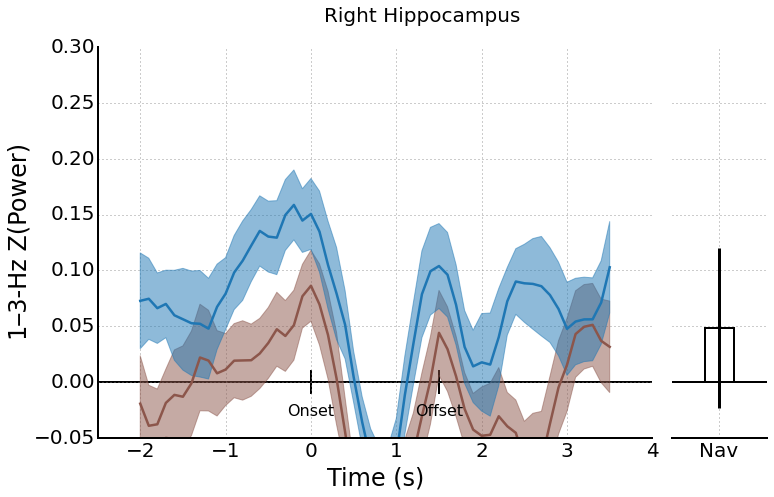

stat_fun(H1): min=-3.511193 max=1.102196
Running initial clustering
Found 3 clusters
Permuting ...
[....................................... ] 99.20000 \    Computing cluster p-values
Done.
0.23976023976
0.243756243756
0.0689310689311
-1.14181630458
0.264794956672


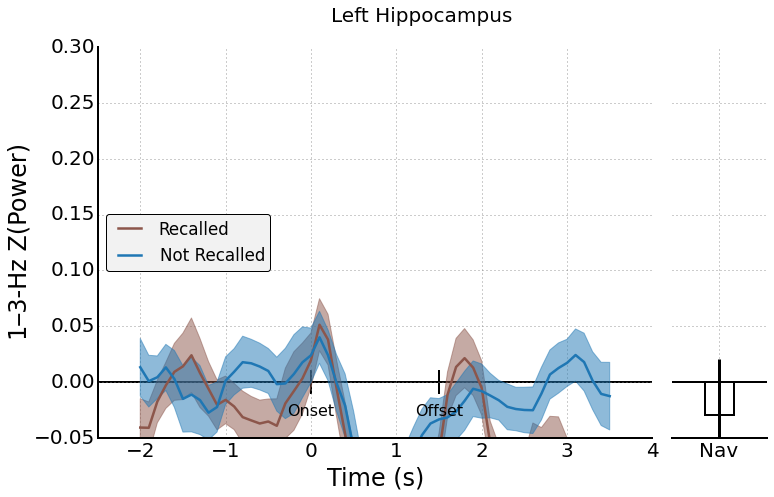

In [90]:
import os
import scipy
from mne.stats import fdr_correction, permutation_cluster_test, permutation_cluster_1samp_test
def stat_fun(x1,x2):
    t,p = scipy.stats.ttest_rel(x1,x2,nan_policy='omit')
    return t.data

def stat_fun2(x):
    t,p = scipy.stats.ttest_1samp(x,0,nan_policy='omit')
    return t.data

names = ['right_enc_time_power', 'left_enc_time_power']
titles = ['Right Hippocampus', 'Left Hippocampus']
save_path = '/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/'
for i, hemi in enumerate([0,1]):
    ind_low = (sme_th_tbins_long.subject_objs[0].freqs >= 8) & (sme_th_tbins_long.subject_objs[0].freqs <= 30)
    mean_rec_time = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th_tbins_long.subject_objs],
                                axis=0)

    mean_nrec_time = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th_tbins_long.subject_objs],
                                axis=0)
    
    mean_rec_time_ts = np.stack([np.nanmean(x.res['ts'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th_tbins_long.subject_objs],
                                axis=0) 

    mean_move = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in move.subject_objs],
                                axis=0)
    
    
    mean_rec = np.stack([np.nanmean(x.res['z_rec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)

    mean_nrec = np.stack([np.nanmean(x.res['z_nrec'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)    
    
    mean_enc = np.stack([np.nanmean(x.res['z_all'][ind_low].mean(axis=0)[(x.elec_locs['Hipp']) & (np.abs(hemi - x.elec_locs['is_right']).astype(bool))], axis=0) for x in sme_th.subject_objs],
                                axis=0)   

    # compute within subject error bars for the timecourse
    errs = []
    for dat in zip(mean_rec_time.T, mean_nrec_time.T):
        errs.append(MoreyCous(np.stack(dat,-1), False))
    errs = np.stack(errs,-1)

    # time bins for x axis
    time_bins = sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1)

    ax = plt.subplot2grid((1, 6), (0, 0), colspan=5)
    ax2 = plt.subplot2grid((1, 6), (0, 5))
    plot_data = np.nanmean(mean_rec_time, axis=0)
    err_data = errs[0]
    ax.plot(time_bins,plot_data, color='#8c564b')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#8c564b', alpha=.5)

    plot_data = np.nanmean(mean_nrec_time, axis=0)
    err_data = errs[1]
    ax.plot(time_bins,plot_data, color='#1f77b4')
    ax.fill_between(sme_th_tbins_long.subject_objs[0].time_bins.mean(axis=1), plot_data-err_data, plot_data+err_data,
                    color='#1f77b4', alpha=.5)

    # zero line
    ax.set_xlim(-2.5,4)    
    ax.plot(ax.get_xlim(),[0,0], '-k', lw=2, zorder=-5)
    onset = np.round(time_bins * 1000)/1000 == 0.0
    offset = np.round(time_bins * 1000)/1000 == 1.5
    ax.plot([time_bins[onset]]*2, [-.01, .01],'-k', lw=2, zorder=-5)
    ax.plot([time_bins[offset]]*2, [-.01, .01],'-k', lw=2, zorder=-5)    
    props = dict(boxstyle='round', facecolor='white', alpha=1, pad=.2, lw=1)
    ax.text(time_bins[onset], -.03, 'Onset', horizontalalignment='center', fontsize=16, 
            color='k', weight='normal',family='sans-serif', bbox=None)    
    ax.text(time_bins[offset], -.03, 'Offset', horizontalalignment='center', fontsize=16, 
            color='k', weight='normal',family='sans-serif', bbox=None)      
    
    # compute permuation cluster mult comp correction
#     ts, ps = scipy.stats.ttest_1samp(mean_rec_time_ts,0,nan_policy='omit')
#     T_obs, clusters, cluster_p_values, H0 = permutation_cluster_1samp_test(mean_rec_time_ts,
#                              n_permutations=100, stat_fun=stat_fun2)    
#     for clus in zip(clusters, cluster_p_values):
#         if clus[1] < .05:
#     #             ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
#     #                    '-k', lw=3)

#             inds = range(clus[0][0].start,clus[0][0].stop)
#             ax.fill_between(time_bins[inds],
#                             (np.nanmean(mean_nrec_time, axis=0) + errs[1])[inds],
#                             (np.nanmean(mean_rec_time, axis=0) - errs[0])[inds],
#                            alpha=.25, color='k', zorder=-4)
#     print(clusters)
#     print(cluster_p_values)
    
    T_obs, clusters, cluster_p_values, H0 = permutation_cluster_test([mean_rec_time,mean_nrec_time],
                             n_permutations=1000, stat_fun=stat_fun)
    for clus in zip(clusters, cluster_p_values):
        print clus[1]
        if clus[1] < .05:
            ax.plot([time_bins[clus[0][0].start], time_bins[clus[0][0].stop]], [.25, .25],
                   '-k', lw=3)

#             inds = range(clus[0][0].start,clus[0][0].stop)
#             ax.fill_between(time_bins[inds],
#                             (np.nanmean(mean_nrec_time, axis=0) + errs[1])[inds],
#                             (np.nanmean(mean_rec_time, axis=0) - errs[0])[inds],
#                            alpha=.25, color='k', zorder=-4)

    ax.set_ylabel(u'1–3-Hz Z(Power)', fontdict={'fontsize': 24})            
    ax.set_xlabel('Time (s)', fontdict={'fontsize': 24})
    ax.set_axisbelow(True)
    ax.set_axis_bgcolor('w')
    ax.grid(color=(.5,.5,.5))
    ax.set_ylim(-.05,.3)
#     ax.grid()
    ax.spines['left'].set_linewidth(2)    
    ax.spines['bottom'].set_linewidth(2)  
#     ax.set_title('Left Hippocampus', fontsize=20)
    if i == 1:
        ax.legend(['Recalled', 'Not Recalled'],loc=6)

#     print(scipy.stats.ttest_rel(mean_move, mean_enc, nan_policy='omit'))
    ts,ps = scipy.stats.ttest_1samp(mean_move, 0, nan_policy='omit')
    print(ts)
    print(ps)
#     print(scipy.stats.ttest_1samp(mean_enc, 0, nan_policy='omit'))
    
#     errs = MoreyCous(np.stack([mean_move],-1))
    errs = scipy.stats.sem(mean_move, nan_policy='omit')*1.96
    ax2.bar([0], [np.nanmean(mean_move)], width=.3,
            align='center', color='w', lw=2, 
            yerr=errs,
            error_kw=dict(elinewidth=3, ecolor='k',capsize=0,capthick=0))
    
    y = np.nanmean(mean_move) + errs + .01
    if ps < .01:
        plt.text(0,y,'**',ha = 'center', va='center',
                 bbox=dict(facecolor='1.', edgecolor='none'), size=20)
#                            boxstyle='Square,pad='+str(.3)),size = 20)
    
    ax2.set_ylim(-.05,.3)
    ax2.set_axisbelow(True)
    ax2.set_axis_bgcolor('w')
    ax2.grid(color=(.5,.5,.5))
#     ax2.grid()
#     ax2.spines['right'].set_linewidth(2)    
    ax2.spines['bottom'].set_linewidth(2)  
    ax2.set_yticklabels([])
    ax2.set_xticks([0,1])
    ax2.set_xticklabels(['Nav'], rotation=0)
    ax2.set_xlim(-0.5,0.5)
    ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)
    
    plt.suptitle(titles[i], fontsize=20)
#     plt.savefig(os.path.join(save_path,'TH_timecourse_and_bar_no_enc_%s.pdf' % names[i]))
    plt.show()

In [342]:
aucs_lf = np.array([x.res['auc'] for x in class_res_lf.subject_objs])
aucs_hf = np.array([x.res['auc'] for x in class_res_hf.subject_objs])
scipy.stats.ttest_1samp(aucs_lf - aucs_hf,0)

Ttest_1sampResult(statistic=2.3360798306346759, pvalue=0.023711079871189127)

In [6]:
class_res_hf = group_classifier.GroupClassifier(load_data_if_file_exists=True, 
                                             subject_settings='default',
                                             load_res_if_file_exists=True, 
                                             bipolar=True, subjs=th_subjs,
                                             base_dir='/Users/jmiller/data/python',
                                             do_not_compute=True,use_json=True,
                                             freqs=np.logspace(np.log10(40),np.log10(100),10),
                                             start_time=[0.0],
                                             end_time=[1.5],
                                             recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
class_res_hf.process()

R1076D: loading results.


/Users/jmiller/anaconda2/envs/brain/lib/python2.7/site-packages/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator LogisticRegression from version 0.18 when using version 0.18.1. This might lead to breaking code or invalid results. Use at your own risk.



R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: No results to load.
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 3)
R1155D: No results to load.
R1155D: Running classify.
ERROR PROCESSING [u'R1155D' u'0'].
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading results.
R1189M: loading results.
R1190P: loading results.
R

In [7]:
class_res_lf = group_classifier.GroupClassifier(load_data_if_file_exists=True, 
                                             subject_settings='default',
                                             load_res_if_file_exists=True, 
                                             bipolar=True, subjs=th_subjs,
                                             base_dir='/Users/jmiller/data/python',
                                             do_not_compute=True,use_json=True,
                                             freqs=np.logspace(np.log10(1),np.log10(10),10),
                                             start_time=[0.0],
                                             end_time=[1.5],
                                             recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
class_res_lf.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: No results to load.
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 3)
R1155D: No results to load.
R1155D: Running classify.
ERROR PROCESSING [u'R1155D' u'0'].
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading results.
R1189M: loading results.
R

In [17]:
scipy.stats.ttest_1samp(class_res_lf.summary_table['AUC'],.5)

Ttest_1sampResult(statistic=5.909940231375054, pvalue=3.4405117261604243e-07)

In [10]:
class_res_hf.summary_table.mean()

AUC     0.527493
LOSO    0.551020
dtype: float64

In [12]:
scipy.stats.ttest_rel(class_res_lf.summary_table['AUC'],class_res_hf.summary_table['AUC'])

Ttest_relResult(statistic=2.3360798306346759, pvalue=0.023711079871189127)

In [79]:
class_top_all = group_classifier_using_top_features.GroupClassifier(load_data_if_file_exists=True, 
                                                                subject_settings='default',
                                                                load_res_if_file_exists=True, 
                                                                bipolar=True,subjs=th_subjs,
                                                                use_json=True,freqs=np.concatenate([np.logspace(np.log10(1),np.log10(10),10),np.logspace(np.log10(40),np.log10(100),10)]),
                                                                base_dir='/Users/jmiller/data/python',
                                                                do_not_compute=True,
                                                                recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
class_top_all.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: No results to load.
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 3)
R1155D: No results to load.
R1155D: Running classify.
R1155D: permutation 1 of 100
ERROR PROCESSING [u'R1155D' u'0'].
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading result

In [80]:
class_top_lf = group_classifier_using_top_features.GroupClassifier(load_data_if_file_exists=True, 
                                                                subject_settings='default',
                                                                load_res_if_file_exists=True, 
                                                                bipolar=True,subjs=th_subjs,
                                                                use_json=True,freqs=np.logspace(np.log10(1),np.log10(10),10),
                                                                base_dir='/Users/jmiller/data/python',
                                                                do_not_compute=True,
                                                                recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
class_top_lf.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: No results to load.
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 3)
R1155D: No results to load.
R1155D: Running classify.
R1155D: permutation 1 of 100
ERROR PROCESSING [u'R1155D' u'0'].
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading result

In [81]:
class_top_hf = group_classifier_using_top_features.GroupClassifier(load_data_if_file_exists=True, 
                                                                subject_settings='default',
                                                                load_res_if_file_exists=True, 
                                                                bipolar=True,subjs=th_subjs,
                                                                use_json=True,freqs=np.logspace(np.log10(40),np.log10(100),10),
                                                                base_dir='/Users/jmiller/data/python',
                                                                do_not_compute=True,
                                                                recall_filter_func=ram_data_helpers.filter_events_to_recalled_norm)
class_top_hf.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: No results to load.
R1155D: Input data already exists, loading.
R1155D: Removing sessions  (0 of 3)
R1155D: No results to load.
R1155D: Running classify.
R1155D: permutation 1 of 100
ERROR PROCESSING [u'R1155D' u'0'].
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: Input data already exists, loading.
R1182C: Removing sessions 0 (1 of 1)
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading result

In [341]:
np.concatenate([np.logspace(np.log10(1),np.log10(10),10),np.logspace(np.log10(40),np.log10(100),10)])

array([   1.        ,    1.29154967,    1.66810054,    2.15443469,
          2.7825594 ,    3.59381366,    4.64158883,    5.9948425 ,
          7.74263683,   10.        ,   40.        ,   44.28692716,
         49.03329792,   54.28835233,   60.10660763,   66.54842384,
         73.68062997,   81.57721731,   90.32010701,  100.        ])

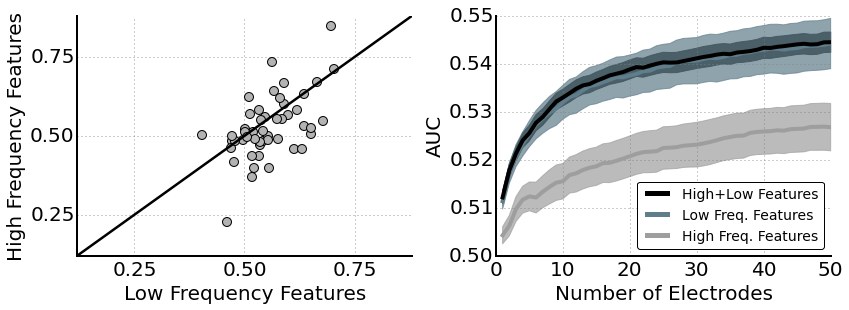

In [102]:
plot_average_by_num_features2(class_top_lf, class_top_hf, class_top_all, class_res_lf, class_res_hf)
plt.gcf().set_size_inches(12,4)
plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/Fig8.pdf')

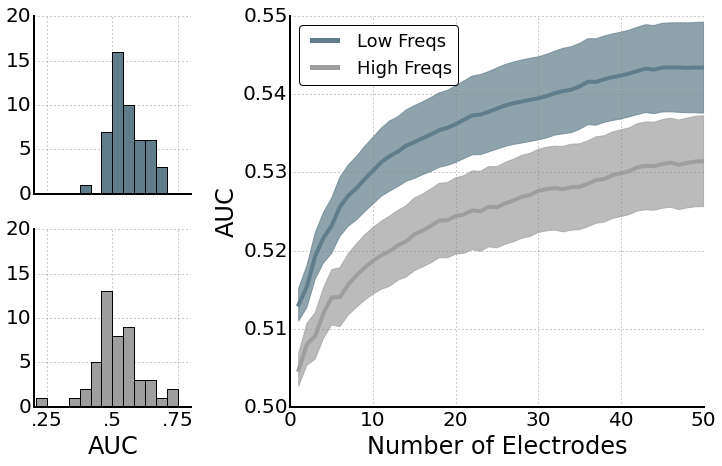

In [330]:
plot_average_by_num_features(class_top_lf, class_top_hf, class_res_lf, class_res_hf)
# plt.savefig('/Users/jmiller/Desktop/low_high_class.pdf')

In [89]:
from scipy.stats import sem
def MoreyCous(dat, do_ci=False):
    n_subj = np.sum(np.any(~np.isnan(dat), axis=1))
    g_mean = np.nanmean(dat)
    n_conds = dat.shape[1]
    dat -= np.tile(np.expand_dims(np.nanmean(dat,axis=1),1),n_conds)
    dat += g_mean
    crit_t = scipy.stats.t.ppf(.975, n_subj - 1)
    s = scipy.stats.sem(dat, axis=0, nan_policy='omit')
    if not do_ci:
        return s * (np.sqrt(n_conds) / np.sqrt(n_conds-1))
    else:
        return s * crit_t * (np.sqrt(n_conds) / np.sqrt(n_conds-1))

# scipy.io.savemat('/Users/jmiller/Desktop/test2',{'dat':np.vstack([plot_region_mean_rec.T[25], plot_region_mean_nrec.T[25]]).T})

In [101]:
def plot_average_by_num_features2(lf, hf, af, lf_all, hf_all):
    """
    Plots auc as a function of number of electrodes (or frequencies) inlcuded, averaged across all subjects.
    """

    # get the results from each subject and stack.
    N = 50
    aucs_lf_all = np.array([x.res['auc'] for x in lf_all.subject_objs])
    aucs_hf_all = np.array([x.res['auc'] for x in hf_all.subject_objs])    
    aucs_lf = np.stack([np.nanmean(x.res['aucs_by_n_feats'][:, :N], axis=0) for x in lf.subject_objs], axis=0)
    aucs_hf = np.stack([np.nanmean(x.res['aucs_by_n_feats'][:, :N], axis=0) for x in hf.subject_objs], axis=0)
    aucs_af = np.stack([np.nanmean(x.res['aucs_by_n_feats'][:, :N], axis=0) for x in af.subject_objs], axis=0)    
    err_lf = sem(aucs_lf, axis=0)
    err_hf = sem(aucs_hf, axis=0)    
    
    errs = []
    for dat in zip(aucs_lf.T, aucs_hf.T, aucs_af.T):
#         print(np.stack(dat,-1).shape)
#         print(MoreyCous(np.stack(dat,-1), False))
        errs.append(MoreyCous(np.stack(dat,-1), False))
    errs = np.array(errs)
#     print(errs)
#     print(scipy.stats.ttest_rel(aucs_lf,aucs_hf,nan_policy='omit'))

    with plt.style.context('myplotstyle.mplstyle'):
#         ax3 = plt.subplot2grid((2, 8), (0, 0), colspan=2)
#         ax2 = plt.subplot2grid((2, 8), (1, 0), colspan=2)
#         ax = plt.subplot2grid((2, 8), (0, 3), colspan=5, rowspan=2)
        fig, (ax1, ax2) = plt.subplots(1,2)
        ax1.plot([0,1],[0,1],'-k')
        ax1.scatter(aucs_lf_all, aucs_hf_all, s=80, color=[.7,.7,.7], edgecolor='k')
        ax1.set_xlim(.12,.88)
        ax1.set_ylim(.12,.88)
        ax1.set_axisbelow(True)
        ax1.set_axis_bgcolor('w')
        ax1.grid(color=(.5,.5,.5))
        ax1.set_yticks([.25,.5,.75])        
        ax1.set_xticks([.25,.5,.75])
        ax1.spines['left'].set_linewidth(2)    
        ax1.spines['bottom'].set_linewidth(2)  
        ax1.set_ylabel('High Frequency Features', fontsize=20)
        ax1.set_xlabel('Low Frequency Features', fontsize=20)
        
        x = np.arange(aucs_lf.shape[1]) + 1
        y_lf = aucs_lf.mean(axis=0)
        y_hf = aucs_hf.mean(axis=0)        
        y_af = aucs_af.mean(axis=0)        
        ax2.plot(x, y_af, linewidth=4, label='High+Low Features', color='k', zorder=11)
        ax2.plot(x, y_lf, linewidth=4, label='Low Freq. Features', color='#607d8b', zorder=10)
        ax2.plot(x, y_hf, linewidth=4, label='High Freq. Features', color='#9e9e9e')                  
        ax2.fill_between(x, y_af - errs[:,2], y_af + errs[:,2], facecolor='k', edgecolor='k', zorder=0, alpha=.9)                        
        ax2.fill_between(x, y_lf - errs[:,0], y_lf + errs[:,0], facecolor='#607d8b', edgecolor='#607d8b', zorder=0, alpha=.7)
        ax2.fill_between(x, y_hf - errs[:,1], y_hf + errs[:,1], facecolor='#9e9e9e', edgecolor='#9e9e9e', zorder=0, alpha=.7)        
        ax2.set_ylabel('AUC', fontsize=20)
        ax2.set_xlabel('Number of Electrodes', fontsize=20)
#         plt.title('N: %d' % aucs_lf.shape[0], fontsize=20)

        l = ax2.legend(loc=4,fontsize=14)
        frame = l.get_frame()
        frame.set_facecolor('w')
        for legobj in l.legendHandles:
            legobj.set_linewidth(5)
        
        ax2.set_axisbelow(True)
        ax2.set_axis_bgcolor('w')
        ax2.grid(color=(.5,.5,.5))
#     ax2.grid()
        ax2.spines['left'].set_linewidth(2)    
        ax2.spines['bottom'].set_linewidth(2)  
#         ax2.set_yticklabels([])
#         ax2.set_xticks([0,1])#         
#     ax2.set_xlim(-0.5,0.5)
#     ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)
   
    plt.tight_layout()
#         ax2.hist(aucs_hf_all, bins=np.linspace(0,1,25), color='#9e9e9e')    
#         ax2.set_axisbelow(True)
#         ax2.set_axis_bgcolor('w')
#         ax2.grid(color=(.5,.5,.5))        
#         ax2.set_ylim(0,20)  
#         ax2.set_xticklabels(['.25','.5','.75'])
#         ax2.set_xticks([.25,.5,.75])
#         ax2.set_xlim(.2,.8)       
#         ax2.spines['left'].set_linewidth(2)    
#         ax2.spines['bottom'].set_linewidth(2)      
#         ax2.set_xlabel('AUC', fontsize=24)

In [305]:
def plot_average_by_num_features(lf, hf, lf_all, hf_all):
    """
    Plots auc as a function of number of electrodes (or frequencies) inlcuded, averaged across all subjects.
    """

    # get the results from each subject and stack.
    N = 50
    aucs_lf_all = np.array([x.res['auc'] for x in lf_all.subject_objs])
    aucs_hf_all = np.array([x.res['auc'] for x in hf_all.subject_objs])    
    aucs_lf = np.stack([np.nanmean(x.res['aucs_by_n_feats'][:, :N], axis=0) for x in lf.subject_objs], axis=0)
    aucs_hf = np.stack([np.nanmean(x.res['aucs_by_n_feats'][:, :N], axis=0) for x in hf.subject_objs], axis=0)
    err_lf = sem(aucs_lf, axis=0)
    err_hf = sem(aucs_hf, axis=0)    
    
    errs = []
    for dat in zip(aucs_lf.T, aucs_hf.T):
#         print(np.stack(dat,-1).shape)
#         print(MoreyCous(np.stack(dat,-1), False))
        errs.append(MoreyCous(np.stack(dat,-1), False))
    errs = np.array(errs)
#     print(scipy.stats.ttest_rel(aucs_lf,aucs_hf,nan_policy='omit'))

    with plt.style.context('myplotstyle.mplstyle'):
        ax3 = plt.subplot2grid((2, 8), (0, 0), colspan=2)
        ax2 = plt.subplot2grid((2, 8), (1, 0), colspan=2)
        ax = plt.subplot2grid((2, 8), (0, 3), colspan=5, rowspan=2)
#         fig, ax = plt.subplots()
        x = np.arange(aucs_lf.shape[1]) + 1
        y_lf = aucs_lf.mean(axis=0)
        y_hf = aucs_hf.mean(axis=0)        
        ax.plot(x, y_lf, linewidth=4, label='Low Freqs', color='#607d8b')
        ax.plot(x, y_hf, linewidth=4, label='High Freqs', color='#9e9e9e')        
        ax.fill_between(x, y_lf - errs[:,0], y_lf + errs[:,0], facecolor='#607d8b', edgecolor='#607d8b', zorder=0, alpha=.7)
        ax.fill_between(x, y_hf - errs[:,1], y_hf + errs[:,1], facecolor='#9e9e9e', edgecolor='#9e9e9e', zorder=0, alpha=.7)        
        ax.set_ylabel('AUC', fontsize=24)
        ax.set_xlabel('Number of Electrodes', fontsize=24)
#         plt.title('N: %d' % aucs_lf.shape[0], fontsize=20)

        l = ax.legend(loc=2,fontsize=18)
        frame = l.get_frame()
        frame.set_facecolor('w')
        for legobj in l.legendHandles:
            legobj.set_linewidth(5)
        
        ax.set_axisbelow(True)
        ax.set_axis_bgcolor('w')
        ax.grid(color=(.5,.5,.5))
#     ax2.grid()
        ax.spines['left'].set_linewidth(2)    
        ax.spines['bottom'].set_linewidth(2)  
#         ax2.set_yticklabels([])
#         ax2.set_xticks([0,1])#         
#     ax2.set_xlim(-0.5,0.5)
#     ax2.plot(ax2.get_xlim(),[0,0], '-k', lw=2)

        ax3.hist(aucs_lf_all, bins=np.linspace(0,1,25), color='#607d8b')
        ax3.set_axisbelow(True)
        ax3.set_axis_bgcolor('w')
        ax3.grid(color=(.5,.5,.5))
        ax3.set_ylim(0,20)
        ax3.set_xticklabels([])
        ax3.set_xticks([.25,.5,.75])
        ax3.set_xlim(.2,.8)    
        ax3.spines['left'].set_linewidth(2)    
        ax3.spines['bottom'].set_linewidth(2)         
        
        ax2.hist(aucs_hf_all, bins=np.linspace(0,1,25), color='#9e9e9e')    
        ax2.set_axisbelow(True)
        ax2.set_axis_bgcolor('w')
        ax2.grid(color=(.5,.5,.5))        
        ax2.set_ylim(0,20)  
        ax2.set_xticklabels(['.25','.5','.75'])
        ax2.set_xticks([.25,.5,.75])
        ax2.set_xlim(.2,.8)       
        ax2.spines['left'].set_linewidth(2)    
        ax2.spines['bottom'].set_linewidth(2)      
        ax2.set_xlabel('AUC', fontsize=24)

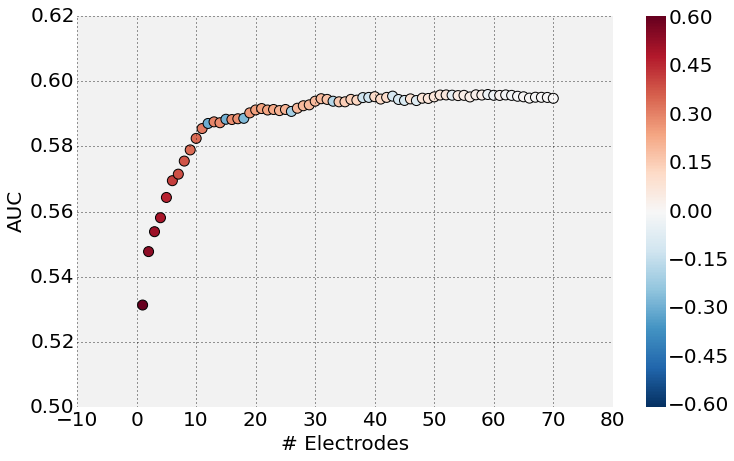

In [189]:
plot_auc_by_num_features(class_top.subject_objs[16])
plt.title('')
plt.savefig('/Users/jmiller/Desktop/AUC_num_elecs_R1180C.pdf')

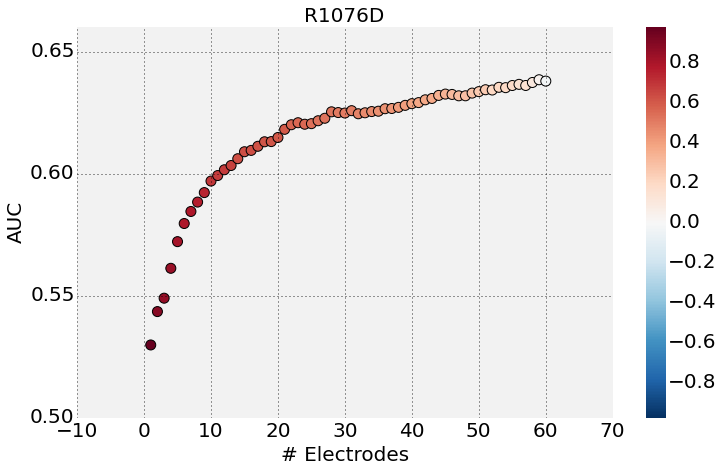

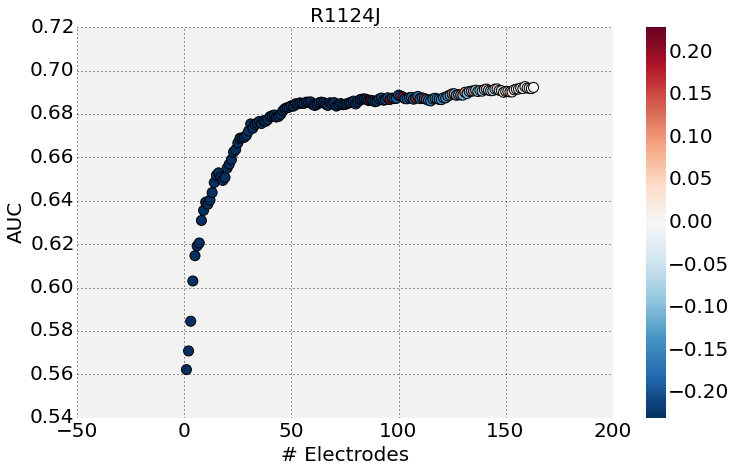

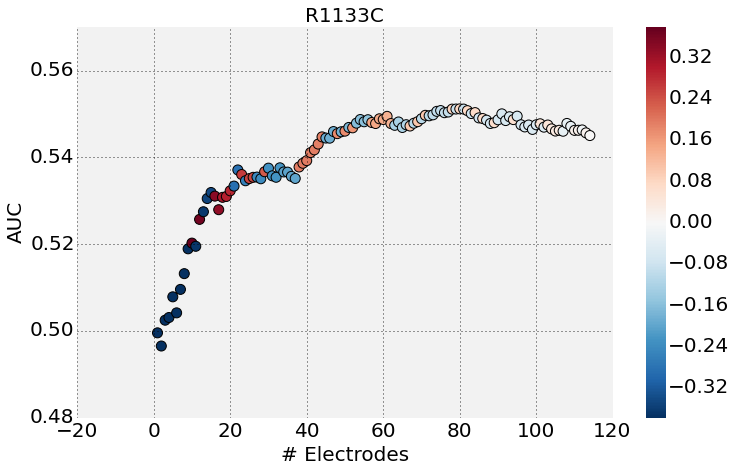

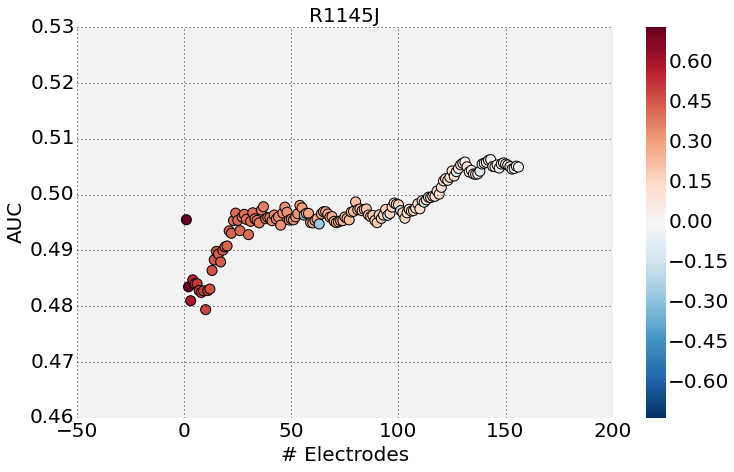

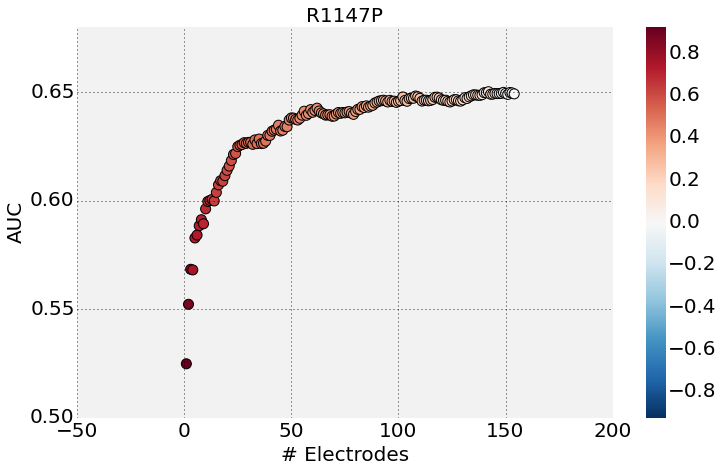

...

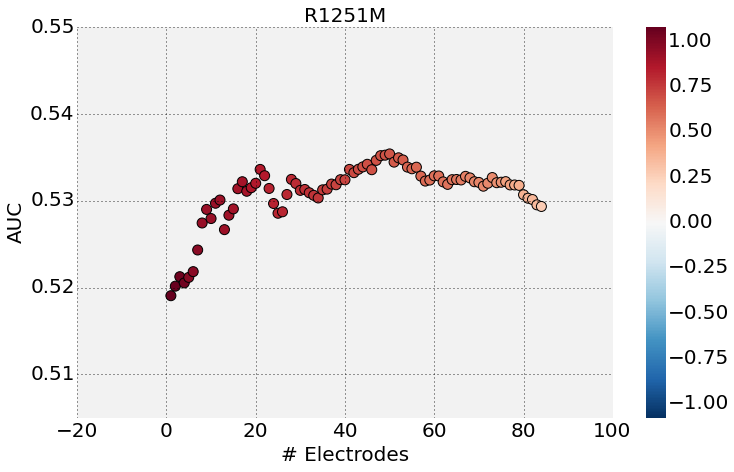

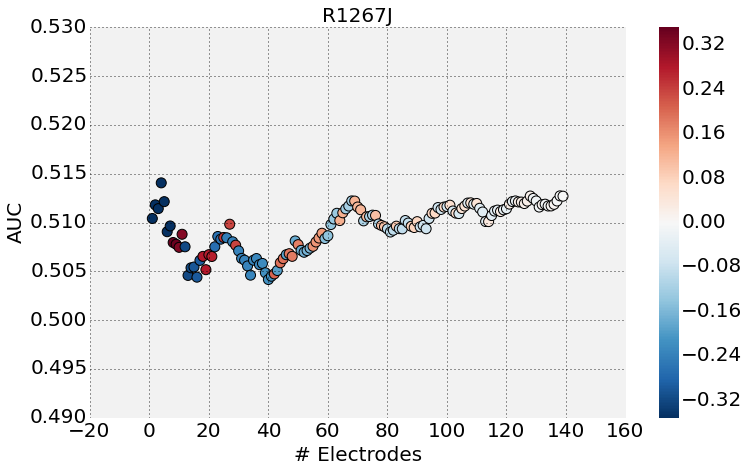

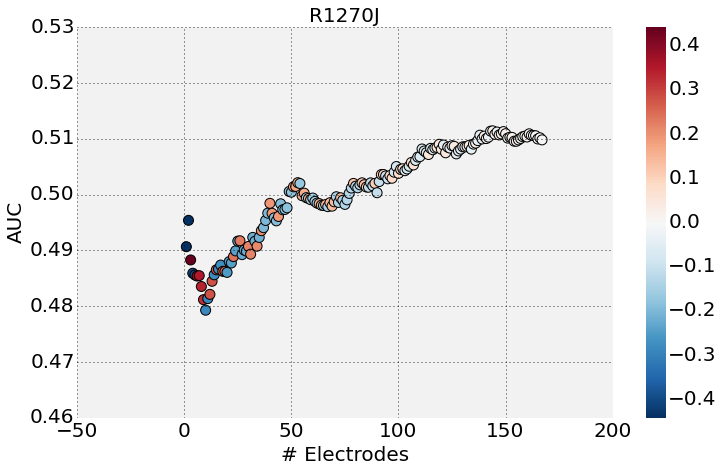

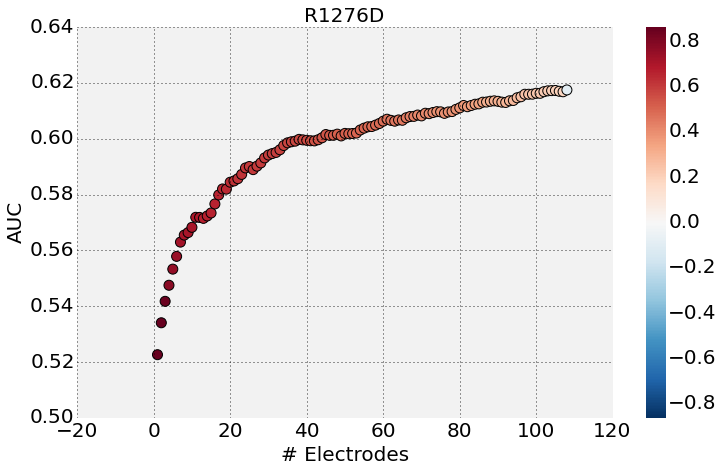

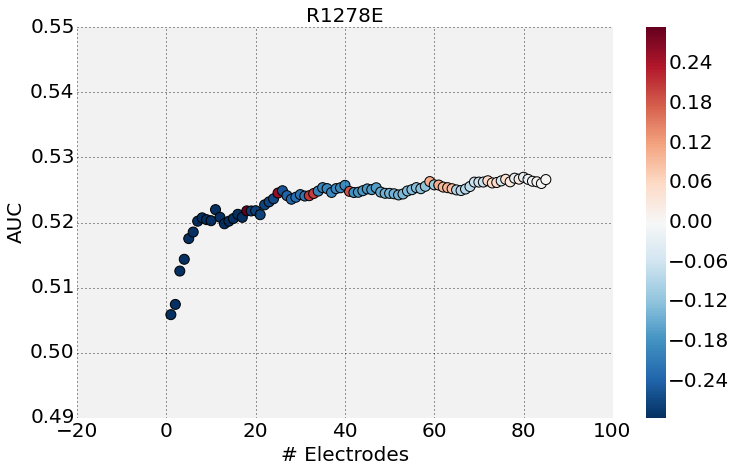

In [175]:
for subj in class_top.subject_objs:
    plot_auc_by_num_features(subj)
    plt.show()

In [404]:
from scipy.stats import sem
def plot_average_by_num_features(self):
    """
    Plots auc as a function of number of electrodes (or frequencies) inlcuded, averaged across all subjects.
    """

    if self.subject_objs is None:
        print('Must run .process() first before plotting the results.')
        return

    # get the results from each subject and stack.
    N = 50 if self.subject_objs[0].do_top_elecs else len(self.subject_objs[0].freqs)
    aucs = np.stack([np.nanmean(x.res['aucs_by_n_feats'][:, :N], axis=0) for x in self.subject_objs if x.res['loso']], axis=0)
#     aucs = np.stack([np.nanmean(x.res['aucs_by_n_feats'][:, :N], axis=0) for x in self.subject_objs], axis=0)
    err = sem(aucs, axis=0)

    with plt.style.context('myplotstyle.mplstyle'):
        x = np.arange(aucs.shape[1]) + 1
        y = aucs.mean(axis=0)
        plt.plot(x, y, linewidth=4)
        plt.fill_between(x, y - err, y + err, facecolor=[.5, .5, .5, .5], edgecolor=[.5, .5, .5, .5], zorder=0)
        plt.ylabel('AUC', fontsize=20)
        plt.xlabel('# Electrodes' if self.subject_objs[0].do_top_elecs else '# Frequencies', fontsize=20)
#         plt.title('N: %d' % aucs.shape[0], fontsize=20)



In [405]:
def plot_auc_by_num_features(self):
    """
    Plots AUC as a function of the number of top features included in the model.
    """

    ts = np.nanmean(self.res['ts'], axis=0)
    ts = ts[np.argsort(np.abs(ts))][::-1]
    clim = np.max([ts.min(), ts.max()])
    with plt.style.context('myplotstyle.mplstyle'):
        y = np.mean(self.res['aucs_by_n_feats'], axis=0)
        plt.scatter(np.arange(len(y)) + 1, y, c=ts, cmap='RdBu_r', vmin=-clim, vmax=clim, s=100)
        cb = plt.colorbar()
        plt.ylabel('AUC', fontsize=20)
        plt.xlabel('# Electrodes' if self.do_top_elecs else '# Frequencies', fontsize=20)
        plt.title(self.subj, fontsize=20)

In [112]:
subj.res['loso']

True

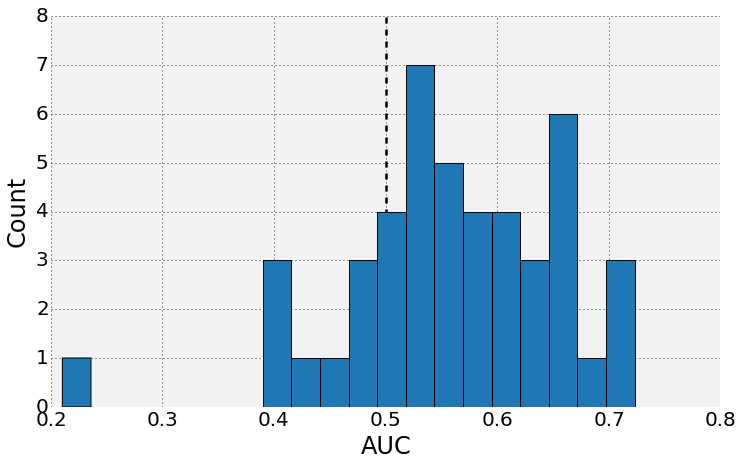

In [191]:
class_res.plot_auc_hist()
plt.title('')
plt.savefig('/Users/jmiller/Desktop/AUC_hist.pdf')

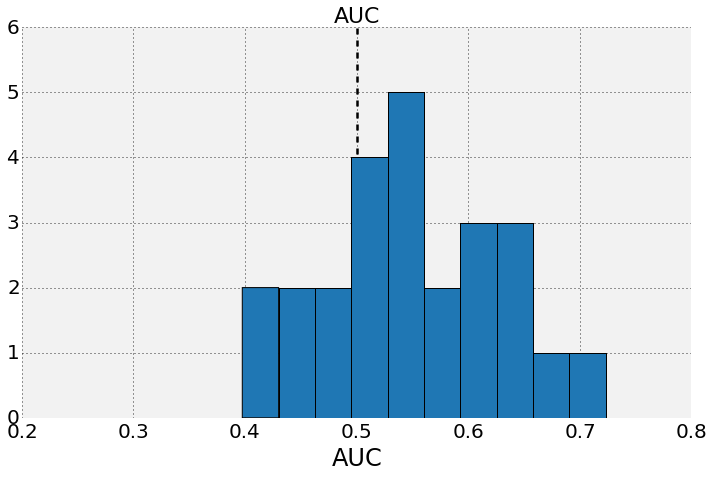

In [135]:
 def plot_auc_hist(self):
        """
        Plot histogram of AUC values.
        """

        with plt.style.context('myplotstyle.mplstyle'):
            self.summary_table.hist(column='AUC', bins=20, zorder=5)
            plt.xlim(.2, .8)
            plt.ylabel('Count', fontsize=24)
            plt.xlabel('AUC', fontsize=24)
            plt.plot([.5, .5], [plt.ylim()[0], plt.ylim()[1] + 1], '--k')

            t, p = ttest_1samp(self.summary_table['AUC'], .5)
            _ = plt.title(r'Mean AUC: %.3f, $t(%d) = %.2f, p < 10^{%s}$' % (self.summary_table['AUC'].mean(),
                                                                            self.summary_table.shape[0]-1,
                                                                            t, int(np.ceil(np.log10(p)))))

## Movement analysis

In [12]:
move = group_move_vs_still.GroupMoveStill(subjs=th_subjs,
                                        load_data_if_file_exists=True,
                                        load_res_if_file_exists=True, use_json=True,
                                        base_dir='/Users/jmiller/data/python',
                                        do_not_compute=True)
move.process()

R1076D: loading results.
R1124J: loading results.
R1133C: loading results.
R1145J: loading results.
R1147P: loading results.
R1154D: loading results.
R1155D: loading results.
R1155D: loading results.
R1156D: loading results.
R1157C: loading results.
R1160C: No results to load.
R1160C: Input data already exists, loading.
R1160C: Removing sessions 0 (1 of 1)
R1163T: loading results.
R1167M: loading results.
R1168T: loading results.
R1170J: loading results.
R1170J: loading results.
R1171M: loading results.
R1172E: loading results.
R1180C: loading results.
R1182C: No results to load.
R1182C: subject_data does not exist, not computing.
Data must be loaded before saving. Use .load_data()
ERROR PROCESSING [u'R1182C' u'0'].
R1184M: No results to load.
R1184M: Input data already exists, loading.
R1184M: Removing sessions 0 (1 of 1)
R1188C: loading results.
R1189M: loading results.
R1190P: loading results.
R1191J: loading results.
R1192C: loading results.
R1194E: loading results.
R1195E: loading

In [78]:
reload(brain_plots)

<module 'Projects.TH_SME_Paper.brain_plots' from '/Users/jmiller/python/RAM_classify/Projects/TH_SME_Paper/brain_plots.py'>

In [20]:
%gui qt
inds = np.where((move.subject_objs[0].freqs >= 1) & (move.subject_objs[0].freqs <=3))[0]
brain_plots.sme_brain(move, inds, res_key='ts', file_ext='low_theta_move', 
                      base_dir='/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels')
 

R1076D: finding valid vertices.
R1124J: finding valid vertices.
R1133C: finding valid vertices.
R1145J: finding valid vertices.
R1147P: finding valid vertices.
R1154D: finding valid vertices.
R1155D: finding valid vertices.
R1155D: finding valid vertices.
R1156D: finding valid vertices.
R1157C: finding valid vertices.
R1163T: finding valid vertices.
R1167M: finding valid vertices.
R1168T: finding valid vertices.
R1170J: finding valid vertices.
R1170J: finding valid vertices.
R1171M: finding valid vertices.
R1172E: finding valid vertices.
R1180C: finding valid vertices.
R1188C: finding valid vertices.
R1189M: finding valid vertices.
R1190P: finding valid vertices.
R1191J: finding valid vertices.
R1192C: finding valid vertices.
R1194E: finding valid vertices.
R1195E: finding valid vertices.
R1201P: finding valid vertices.
R1201P: finding valid vertices.
R1202M: finding valid vertices.
R1204T: finding valid vertices.
R1207J: finding valid vertices.
R1208C: finding valid vertices.
R1210E: 

In [21]:
%gui qt
inds = np.where((move.subject_objs[0].freqs >= 3) & (move.subject_objs[0].freqs <=10))[0]
brain_plots.sme_brain(move, inds, res_key='ts', file_ext='high_theta_move', 
                      base_dir='/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels')
                      

R1076D: finding valid vertices.
R1124J: finding valid vertices.
R1133C: finding valid vertices.
R1145J: finding valid vertices.
R1147P: finding valid vertices.
R1154D: finding valid vertices.
R1155D: finding valid vertices.
R1155D: finding valid vertices.
R1156D: finding valid vertices.
R1157C: finding valid vertices.
R1163T: finding valid vertices.
R1167M: finding valid vertices.
R1168T: finding valid vertices.
R1170J: finding valid vertices.
R1170J: finding valid vertices.
R1171M: finding valid vertices.
R1172E: finding valid vertices.
R1180C: finding valid vertices.
R1188C: finding valid vertices.
R1189M: finding valid vertices.
R1190P: finding valid vertices.
R1191J: finding valid vertices.
R1192C: finding valid vertices.
R1194E: finding valid vertices.
R1195E: finding valid vertices.
R1201P: finding valid vertices.
R1201P: finding valid vertices.
R1202M: finding valid vertices.
R1204T: finding valid vertices.
R1207J: finding valid vertices.
R1208C: finding valid vertices.
R1210E: 

In [22]:
hfa_inds = np.where((move.subject_objs[0].freqs >= 40) & (move.subject_objs[0].freqs <=100))[0]
brain_plots.sme_brain(move, hfa_inds, res_key='ts', file_ext='hfa_move',
                      base_dir='/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels')

R1076D: finding valid vertices.
R1124J: finding valid vertices.
R1133C: finding valid vertices.
R1145J: finding valid vertices.
R1147P: finding valid vertices.
R1154D: finding valid vertices.
R1155D: finding valid vertices.
R1155D: finding valid vertices.
R1156D: finding valid vertices.
R1157C: finding valid vertices.
R1163T: finding valid vertices.
R1167M: finding valid vertices.
R1168T: finding valid vertices.
R1170J: finding valid vertices.
R1170J: finding valid vertices.
R1171M: finding valid vertices.
R1172E: finding valid vertices.
R1180C: finding valid vertices.
R1188C: finding valid vertices.
R1189M: finding valid vertices.
R1190P: finding valid vertices.
R1191J: finding valid vertices.
R1192C: finding valid vertices.
R1194E: finding valid vertices.
R1195E: finding valid vertices.
R1201P: finding valid vertices.
R1201P: finding valid vertices.
R1202M: finding valid vertices.
R1204T: finding valid vertices.
R1207J: finding valid vertices.
R1208C: finding valid vertices.
R1210E: 

Ttest_1sampResult(statistic=masked_array(data = [1.184498558576996 3.238942071616378],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.24781383  0.00431972],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20
Ttest_1sampResult(statistic=masked_array(data = [1.2984920305620227 1.0612117635881821],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.20645741  0.30189756],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20
Ttest_1sampResult(statistic=masked_array(data = [0.5350944451116694 1.5648233300243966],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.59750814  0.13412766],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20


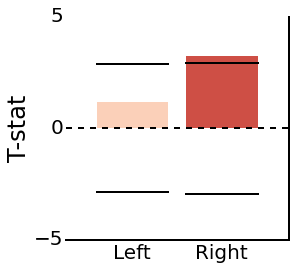

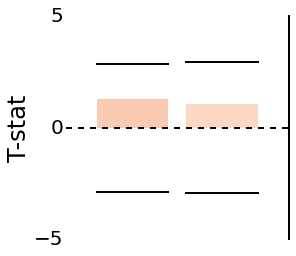

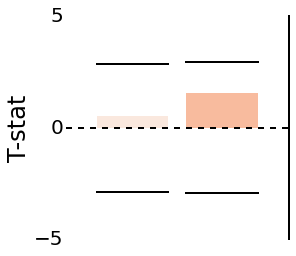

In [434]:
%matplotlib inline
import scipy
from scipy.stats import ttest_1samp
bins = [[1,3],[3,10],[40,100]]
names = ['move_low_theta', 'move_high_theta', 'move_hfa']
plot_labels = [True, False, False]
for fig_info in zip(bins,names, plot_labels):
    lf = fig_info[0][0]
    hf = fig_info[0][1]
    name = fig_info[1]
    plot_label = fig_info[2]
    plot_region_bilat_bar_t(move,lf,hf,'Hipp','ts', plot_label)
#     plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/%s.pdf' % name)

Ttest_1sampResult(statistic=masked_array(data = [1.207051233776429 3.2639719061622223],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.23917495  0.00408342],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20
Ttest_1sampResult(statistic=masked_array(data = [1.339793913275894 1.0358410092072214],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.19286124  0.31328084],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20
Ttest_1sampResult(statistic=masked_array(data = [0.485808781960973 1.5091046602506308],
             mask = [False False],
       fill_value = 1e+20)
, pvalue=masked_array(data = [ 0.63150869  0.14772234],
             mask = False,
       fill_value = 1e+20)
)
-2.86488639434
25
-2.92711911662
20


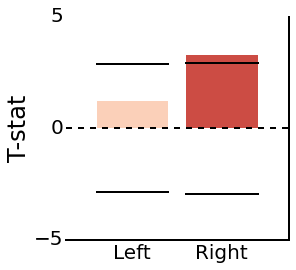

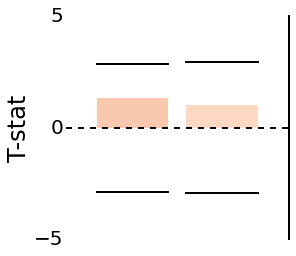

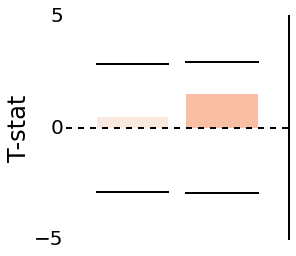

In [19]:
%matplotlib inline
import scipy
from scipy.stats import ttest_1samp
bins = [[1,3],[3,10],[40,100]]
names = ['move_low_theta', 'move_high_theta', 'move_hfa']
plot_labels = [True, False, False]
for fig_info in zip(bins,names, plot_labels):
    lf = fig_info[0][0]
    hf = fig_info[0][1]
    name = fig_info[1]
    plot_label = fig_info[2]
    plot_region_bilat_bar_t(move,lf,hf,'Hipp','ts', plot_label)
    plt.savefig('/Users/jmiller/Documents/papers/jacobsPapers/TH_SME/figs/panels/%s.pdf' % name)